In [2]:
import pandas as pd
from yahoo_fin.stock_info import get_data
import matplotlib.pyplot as plt
import numpy as np

In [3]:
############# Data Preparation ##############

In [4]:
# List of tickers for the 30 companies
# custom_tickers = [
#     "AMZN", "AXP", "AMGN", "AAPL", "BA",
#     "CAT", "CSCO", "CVX", "GS", "HD",
#     "HON", "IBM", "INTC", "JNJ", "KO",
#     "JPM", "MCD", "MMM", "MRK", "MSFT",
#     "NKE", "PG", "TRV", "UNH", "CRM",
#     "VZ", "V", "WMT", "DIS", "DJI"
# ]

#PAST DJIA
custom_tickers = [
    "PG", "JNJ", "XOM", "CVX", "MRK", "PFE", "MCD", "T",
    "VZ", "HPQ", "IBM", "MSFT", "INTC", "HD", "WMT", "TRV",
    "RTX", "BA", "AA", "DD", "CAT", "MMM", "DIS", "JPM", "AXP", "GE",
    "CCEP"
    #"CRJ", "H", "BOA"
]

study_periods = [
    ('2001-01-02', '2004-01-06'),
    ('2004-01-06', '2007-01-02'),
    ('2007-01-02', '2010-01-05'),
    ('2010-01-05', '2013-05-14')
]

def calculate_weekly_returns(df):
    weekly_df = df.resample('W').last()
    weekly_df['close'].fillna(method='ffill', inplace=True)
    weekly_df['returns'] = weekly_df['close'].pct_change().fillna(0)
    return weekly_df

def ultrametric(correlation_matrix, q=2):
    """
    Convert a correlation matrix to an ultrametric distance matrix.

    Parameters:
        correlation_matrix (pd.DataFrame): Correlation matrix of stocks.
        q (float): Exponent parameter (default is 2).

    Returns:
        pd.DataFrame: Ultrametric distance matrix.
    """
    # Calculate the ultrametric distance matrix
    ultrametric_distances = q * (1 - correlation_matrix) ** (1/q)
    
    return ultrametric_distances

def data_prep(custom_tickers, study_periods):
    # Fetch data for each ticker
    stock_data = {}
    for ticker in custom_tickers:
        try:
            data = get_data(ticker)
            stock_data[ticker] = data
        except AssertionError as e:
            print(f"No data found for {ticker}: {e}")
    weekly_returns_dict = {}

    for ticker, data in stock_data.items():
        data.index = pd.to_datetime(data.index)

        for period_num, (start_date, end_date) in enumerate(study_periods, start=1):
            period_data = data.loc[start_date:end_date]
            period_returns = calculate_weekly_returns(period_data)
            weekly_returns_dict.setdefault(ticker, {})[f'period_{period_num}'] = period_returns
    period_dfs = {}
    # Iterate over the periods
    for period in ['period_1', 'period_2', 'period_3', 'period_4']:
        # Initialize an empty dictionary to store data for the current period
        period_data = {}

        # Iterate over each ticker's data
        for ticker, data in weekly_returns_dict.items():
            # Drop NaN values from the 'close' column for the current period
            close_prices = data[period][['returns']].dropna()
            period_data[ticker] = close_prices

        # Concatenate the data for all tickers into a single DataFrame for the current period
        period_df = pd.concat(period_data, axis=1)
        period_dfs[period] = period_df.dropna(axis=1)
    correlation_matrices = {}
    for period, period_df in period_dfs.items():
        # Calculate correlation matrix for the current period and store it in the dictionary
        correlation_matrices[period] = period_df.corr()
    # Convert new correlation matrices to distance matrices using ultrametric function
    distance_matrices = {}
    for period, correlation_matrix in correlation_matrices.items():
        distance_matrices[period] = ultrametric(correlation_matrix)
    return period_dfs, correlation_matrices, distance_matrices

In [5]:
period_dfs, correlation_matrices, distance_matrices = data_prep(custom_tickers, study_periods)

In [6]:
############# Random Selection ##############

In [7]:
def calculate_metrics_for_random_selection(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 100
 
    for period, returns_data in period_dfs.items():
        returns_data = returns_data.droplevel(1, axis=1)
        results_by_stocks = {}
        stocks_length_list = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlation = []
            selected_stocks_list = {}
            
            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks
               
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                
                mean_std = (portfolio_return_stocks).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            #stocks_length_list[period] = selected_stocks_list
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]
            
            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

num_stocks_list = [2, 4, 8]
result_df_random = calculate_metrics_for_random_selection(period_dfs, num_stocks_list)
result_df_random

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.003631,0.037123,0.001220,0.281896,"[XOM, T, CCEP, CVX, WMT, PG, CVX, CAT, XOM, T,..."
period_1 (4 stocks),0.027470,0.033516,0.090663,0.187782,"[GE, MRK, DD, MSFT, TRV, PG, MRK, PFE, IBM, DI..."
period_1 (8 stocks),0.029085,0.030970,0.096628,0.360766,"[INTC, VZ, MRK, IBM, MSFT, WMT, BA, MMM, INTC,..."
period_2 (2 stocks),0.240917,0.022541,1.122502,0.242695,"[GE, IBM, BA, CCEP, IBM, HD, MRK, PFE, JNJ, HP..."
period_2 (4 stocks),0.245156,0.018705,1.342342,0.204265,"[GE, VZ, PFE, CAT, CAT, VZ, HD, PFE, PG, XOM, ..."
period_2 (8 stocks),0.239115,0.016162,1.502208,0.311206,"[AXP, CCEP, PG, RTX, MSFT, CAT, T, CVX, PFE, R..."
period_3 (2 stocks),-0.030314,0.042875,-0.046459,0.647729,"[VZ, DIS, CVX, JNJ, MCD, PG, DIS, HD, WMT, PG,..."
period_3 (4 stocks),0.026295,0.039030,0.075862,0.576794,"[MMM, HD, CVX, TRV, DD, MRK, MMM, MCD, MCD, MR..."
period_3 (8 stocks),0.000639,0.037785,0.005184,0.505349,"[PFE, IBM, MSFT, MMM, PG, DIS, T, RTX, MCD, XO..."
period_4 (2 stocks),0.376758,0.027121,1.527437,0.488259,"[HPQ, JNJ, MCD, CVX, INTC, AA, RTX, GE, JNJ, T..."


In [8]:
############# HCT ##############

In [9]:
import numpy as np
from scipy.cluster.hierarchy import average, fcluster, linkage
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Function to perform hierarchical clustering and print stocks in each cluster
def hierarchical_clustering(distance_matrix, labels, period):
#    linkage_matrix = average(distance_matrix)
    linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
    labels = [label[0] for label in labels]

    # Set the figure size to be larger
    plt.figure(figsize=(12, 8))  # Adjust the size as needed

    # Plot the dendrogram
    dendrogram(average(distance_matrix), labels=labels, orientation='top')

    # Customize plot title and axis labels
    plt.title(f'Hierarchical Clustering Dendrogram - {period}')
    plt.xlabel('Stocks')
    plt.ylabel('Distance')

    # Create dictionary to store stocks in each cluster for 2, 4, and 8 clusters
    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}
    
    # Perform clustering to get cluster labels for 2, 4, and 8 clusters
    for num_clusters in [2, 4, 8]:
        cluster_labels = fcluster(linkage_matrix, num_clusters, criterion='maxclust')
        
        # Assign stocks to clusters
        for stock, cluster_label in zip(labels, cluster_labels):
            if cluster_label not in cluster_stocks[num_clusters]:
                cluster_stocks[num_clusters][cluster_label] = [stock]
            else:
                cluster_stocks[num_clusters][cluster_label].append(stock)

    # Show the plot
    plt.show()
    
    return cluster_stocks

def HCT(distance_matrices):
    # Create a dictionary to store cluster stocks for each period
    all_cluster_stocks_HCT = {}
    # Perform hierarchical clustering and plot dendrogram for each study period
    for period, distance_matrix in distance_matrices.items():
        all_cluster_stocks_HCT[period] = hierarchical_clustering(distance_matrix.values, distance_matrix.index, period)
    return all_cluster_stocks_HCT

/var/folders/m7/j4dcn39d2w53ww84yjmrzn2r0000gn/T/ipykernel_63778/3077549457.py:9: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/scipy/cluster/hierarchy.py:446: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='average', metric='euclidean')


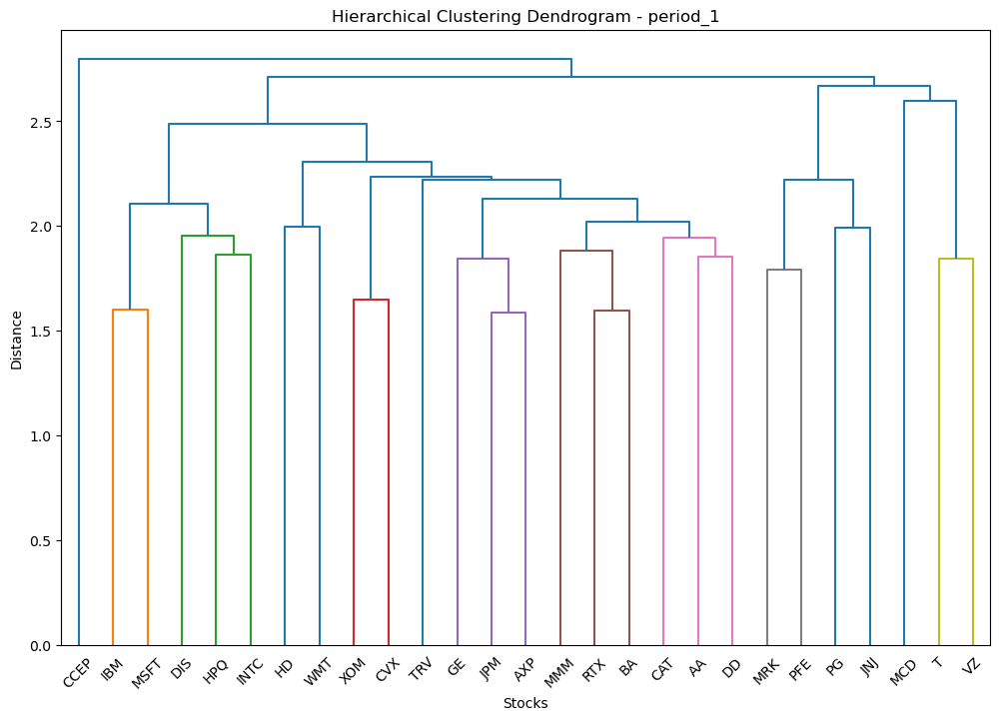

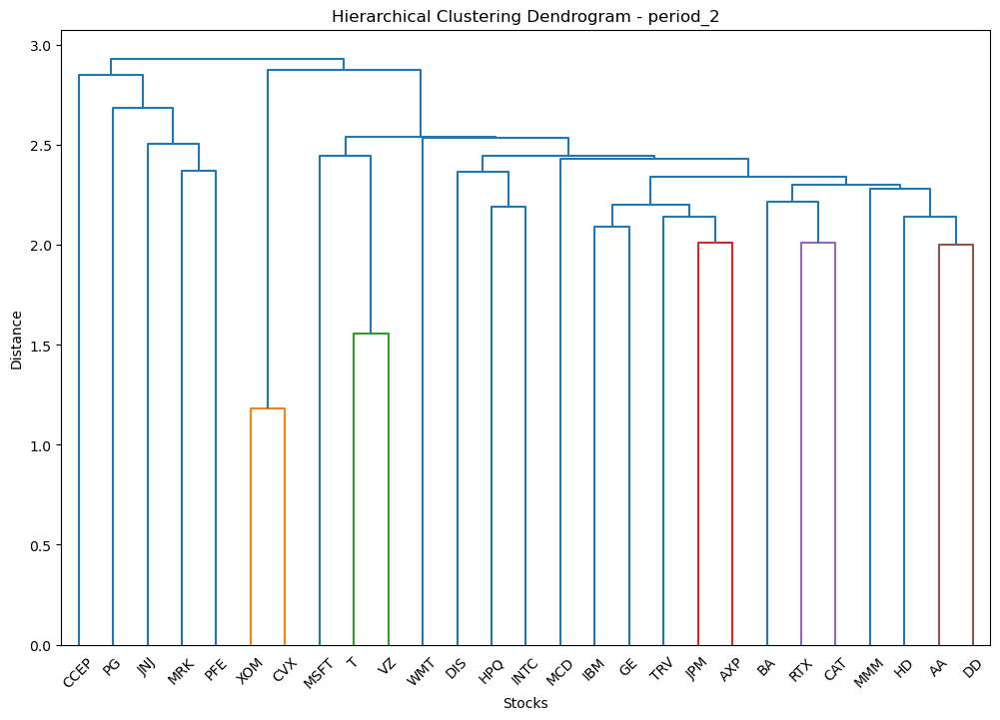

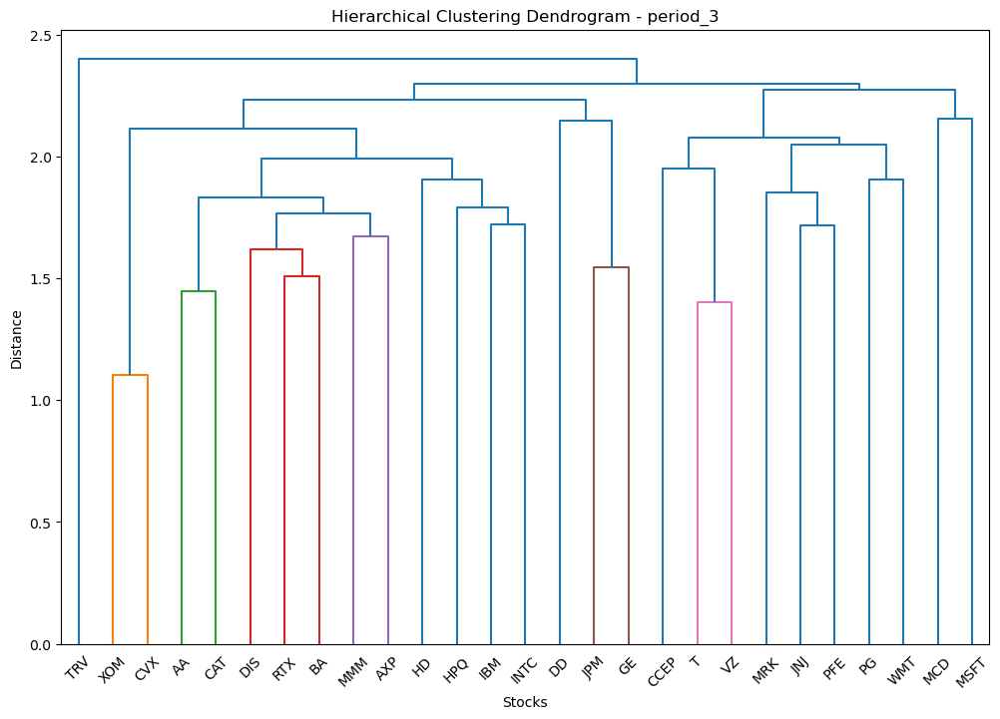

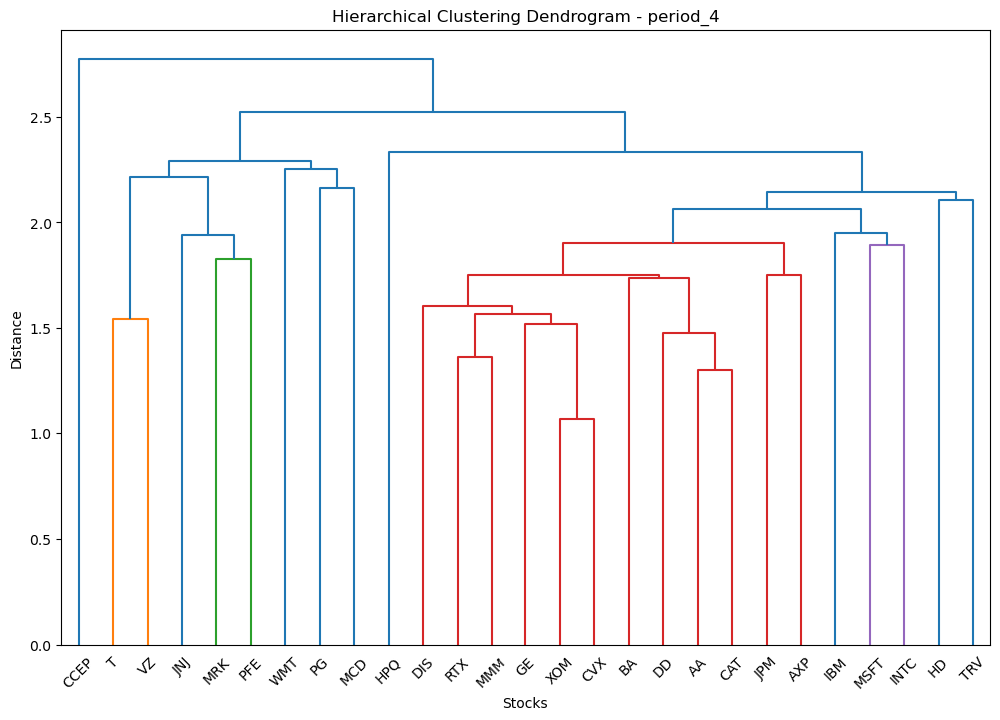

In [122]:
all_cluster_stocks_HCT = HCT(distance_matrices)

In [11]:
import pandas as pd
import numpy as np

def calculate_metrics_for_all_clusters(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 100

    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        selected_stocks_list = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]
                try:
                    selected_stocks_list[num_clusters].extend(selected_stocks)
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks
                
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                
                mean_portfolio_return = np.prod(1+portfolio_return_stocks)-1
                portfolio_returns.append(mean_portfolio_return)
                
                #print(returns_data[selected_stocks].std())
                mean_std = (portfolio_return_stocks+1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation
            
            sharpe_ratio = np.mean((np.array(portfolio_returns)/10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            final_stocks_list = [selected_stocks_list[num_clusters]]
            
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : final_stocks_list}
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
        results_by_period[period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [12]:
result_df_HCT = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT, period_dfs)
result_df_HCT

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.003806,0.035257,0.008568,0.544934,"[JNJ, IBM, PG, TRV, PFE, IBM, JNJ, CAT, VZ, IN..."
period_1 (4 stocks),-0.030167,0.032040,-0.077754,0.256176,"[MRK, JPM, VZ, HPQ, MRK, AA, CCEP, INTC, MRK, ..."
period_1 (8 stocks),0.024275,0.027534,0.092118,0.270884,"[PG, HD, MCD, T, IBM, JPM, MMM, CCEP, PFE, WMT..."
period_2 (2 stocks),0.264152,0.020739,1.352388,0.006022,"[JNJ, RTX, PFE, DIS, CVX, CAT, PFE, INTC, MRK,..."
period_2 (4 stocks),0.363012,0.016960,2.187817,0.206646,"[CCEP, XOM, AA, MSFT, JNJ, XOM, MCD, T, PG, CV..."
period_2 (8 stocks),0.264696,0.013562,1.972312,0.157949,"[PG, MRK, CVX, WMT, VZ, AXP, TRV, CCEP, PG, MR..."
period_3 (2 stocks),0.005439,0.041795,0.042682,0.347389,"[T, HPQ, CVX, HPQ, PG, CAT, WMT, MMM, JNJ, CAT..."
period_3 (4 stocks),-0.040199,0.040701,-0.105815,0.472014,"[MSFT, CVX, AA, JPM, MCD, T, AA, GE, PFE, XOM,..."
period_3 (8 stocks),0.002583,0.034666,0.007321,0.479716,"[PFE, XOM, MSFT, T, IBM, TRV, AA, DD, JNJ, XOM..."
period_4 (2 stocks),0.426154,0.024742,1.832538,0.295234,"[MCD, IBM, WMT, IBM, T, AXP, VZ, HPQ, MCD, TRV..."


In [13]:
############# KMEANS ##############

In [14]:
from sklearn.cluster import KMeans
import numpy as np

In [15]:
periods = ['period_1','period_2','period_3','period_4']

In [16]:
# Function to perform K-means clustering
def kmeans_clustering(data, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    cluster_labels = kmeans.fit_predict(data)
    centroid_vectors = kmeans.cluster_centers_
    return cluster_labels, centroid_vectors

In [17]:
def generate_clusters_and_centroids(periods, distance_matrices, tickers):
    stocks = tickers
    all_cluster_stocks_kmeans = {}
    all_centroid_vectors = {}

    for period in periods:
        X = distance_matrices[period]
        
        clusters_for_period = {}
        centroid_vectors_for_period = {}
        
        for size in ['2', '4', '8']:  # Using strings instead of integers
            cluster_labels, centroid_vectors = kmeans_clustering(X, num_clusters=int(size))  # Convert size to integer
            clusters = {}
            centroid_dict = {}
            
            for cluster_num in range(int(size)):  # Convert size to integer
                clusters[str(cluster_num + 1)] = []  # Convert cluster_num to string
                centroid_dict[str(cluster_num + 1)] = [centroid_vectors[cluster_num]]  # Store centroid vector as a list
                
            for idx, label in enumerate(cluster_labels):
                clusters[str(label + 1)].append(stocks[idx])  # Convert label to string
            
            clusters_for_period[size] = clusters
            centroid_vectors_for_period[size] = centroid_dict
        
        all_cluster_stocks_kmeans[period] = clusters_for_period
        all_centroid_vectors[period] = centroid_vectors_for_period

    return all_cluster_stocks_kmeans, all_centroid_vectors

all_cluster_stocks_kmeans, centroid_vectors = generate_clusters_and_centroids(periods, distance_matrices, custom_tickers)

/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warning

In [19]:
result_df_kmeans_rand = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.018496,0.035845,-0.037238,0.372278,"[CVX, JNJ, RTX, MCD, CAT, CCEP, WMT, VZ, TRV, ..."
period_1 (4 stocks),-0.072766,0.030686,-0.230677,0.233639,"[T, HPQ, XOM, JNJ, VZ, JPM, CVX, PG, T, AXP, X..."
period_1 (8 stocks),0.037411,0.028379,0.136863,0.303424,"[HD, DIS, INTC, MRK, T, AA, CCEP, XOM, WMT, AX..."
period_2 (2 stocks),0.298275,0.020910,1.495842,0.130016,"[XOM, DD, JNJ, AA, XOM, MCD, PFE, BA, CVX, BA,..."
period_2 (4 stocks),0.365114,0.016604,2.249777,0.174499,"[DD, PG, XOM, T, JPM, CCEP, XOM, MSFT, BA, PFE..."
period_2 (8 stocks),0.243309,0.014147,1.733117,0.168267,"[JNJ, IBM, BA, CVX, MRK, INTC, T, CCEP, PG, HD..."
period_3 (2 stocks),-0.007295,0.041063,0.030313,0.528628,"[WMT, AA, CVX, HD, MCD, RTX, MCD, DIS, MCD, IB..."
period_3 (4 stocks),-0.041332,0.042923,-0.095803,0.503490,"[WMT, AXP, INTC, AA, PG, JPM, IBM, DD, JNJ, GE..."
period_3 (8 stocks),0.030514,0.035277,0.086550,0.468772,"[DD, T, CAT, PG, INTC, TRV, BA, WMT, GE, VZ, X..."
period_4 (2 stocks),0.430790,0.025143,1.819637,0.342394,"[CVX, VZ, MMM, VZ, MMM, CCEP, XOM, MRK, BA, MC..."


In [20]:
def print_kmeans_clusters(all_cluster_stocks_kmeans,time):
    index_tuples = [(period, num_clusters, idx+1) for period, clusters in all_cluster_stocks_kmeans.items() for num_clusters, values in clusters.items() for idx, _ in enumerate(values)]
    values = []
    for period, clusters in all_cluster_stocks_kmeans.items():
        for num_clusters, labels in clusters.items():
            for label, stocks in labels.items():
                values.append([stocks])
    multi_index = pd.MultiIndex.from_tuples(index_tuples, names=['Period', 'Cluster', 'Label'])
    kmeans_df = pd.DataFrame(values, index=multi_index,columns=["Stock"])
    pd.set_option('display.max_colwidth', None)
    print(time)
    return kmeans_df.loc[time]

In [73]:
print_kmeans_clusters(all_cluster_stocks_kmeans,'period_3')

period_3


Stock
Cluster Label                                                                                
2       1                                 [PG, JNJ, XOM, CVX, MRK, PFE, MCD, T, VZ, WMT, TRV]
        2      [HPQ, IBM, MSFT, INTC, HD, RTX, BA, AA, DD, CAT, MMM, DIS, JPM, AXP, GE, CCEP]
4       1                                           [PG, JNJ, MRK, PFE, MCD, T, VZ, WMT, TRV]
        2                                                                      [JPM, AXP, GE]
        3                                                    [HPQ, IBM, MSFT, INTC, HD, CCEP]
        4                                          [XOM, CVX, RTX, BA, AA, DD, CAT, MMM, DIS]
8       1                                                                  [DD, JPM, AXP, GE]
        2                                                                             [T, VZ]
        3                                                                 [XOM, CVX, AA, CAT]
        4                                                                 [PG, JNJ, MRK, PFE]
        5                                                              [HPQ, IBM, MSFT, INTC]
        6                                                                               [TRV]
        7                                                       [HD, RTX, BA, MMM, DIS, CCEP]
        8                                                                          [MCD, WMT]

In [22]:
def calculate_metrics_for_kmeans(all_cluster_stocks, period_dfs, centroid_vectors,distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    for period, cluster_stocks in all_cluster_stocks.items():
        returns_data = period_dfs[period].droplevel(1, axis=1)
        results_by_cluster = {}
        stocks_by_cluster = {}
        
        for num_clusters, clusters in cluster_stocks.items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[period][str(num_clusters)]
                distance_matrix = distance_matrices[period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            #results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation}
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks" : [selected_stocks]}

        results_by_period[period] = results_by_cluster
        stocks_by_period[period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [23]:
result_df_kmeans, stocks_by_period_kmeans = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)

In [24]:
result_df_kmeans

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),-0.213123,0.030766,-0.692727,0.263464,"[WMT, MRK]"
period_1 (4 stocks),-0.246485,0.030010,-0.821343,0.316795,"[T, DIS, WMT, MRK]"
period_1 (8 stocks),-0.041584,0.029096,-0.142921,0.332000,"[WMT, GE, HPQ, MRK, MCD, AA, CCEP, XOM]"
period_2 (2 stocks),0.007040,0.023190,0.030360,0.185491,"[PFE, TRV]"
period_2 (4 stocks),0.315555,0.018344,1.720191,0.287445,"[TRV, PFE, XOM, AXP]"
period_2 (8 stocks),0.216613,0.014355,1.508984,0.190098,"[JNJ, RTX, TRV, XOM, PFE, MSFT, VZ, CCEP]"
period_3 (2 stocks),-0.088398,0.042592,-0.207543,0.564727,"[PFE, CCEP]"
period_3 (4 stocks),-0.080091,0.045275,-0.176902,0.569158,"[PFE, AXP, CCEP, DIS]"
period_3 (8 stocks),-0.003358,0.040587,-0.008275,0.478927,"[AXP, VZ, AA, PFE, INTC, TRV, CCEP, MCD]"
period_4 (2 stocks),0.991680,0.025792,3.844910,0.547225,"[DIS, TRV]"


In [25]:
############# MST ##############

In [80]:
import numpy as np
import pandas as pd
import networkx as nx
import random
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
from networkx.algorithms.community import girvan_newman

In [252]:
def generate_portfolios(communities, labels, num_portfolios=100):
    """Generate multiple portfolios by selecting one ticker at random from each cluster."""
    portfolios = []
    for _ in range(num_portfolios):
        portfolio = [random.choice(list([labels[node] for node in community])) for community in communities]
        portfolios.append(portfolio)
    return portfolios

def plot_MST_portfolios(G, num_clusters, period, communities, labels):
    # Plot the graph with clusters colored
    pos = nx.spring_layout(G)
    for i, community in enumerate(communities):
        nx.draw_networkx_nodes(G, pos, nodelist=community, node_color=plt.cm.tab10(i), node_size=700, label=f'Cluster {i+1}')
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=15)
    plt.title(f"Minimum Spanning Tree with {num_clusters} Clusters (Girvan-Newman Algorithm) - {period}")
    plt.show()

def MST_cluster(distance_matrix, labels, period):
    sparse_matrix = csr_matrix(distance_matrix)

    # Compute the minimum spanning tree
    mst = minimum_spanning_tree(sparse_matrix)

    # Create a NetworkX graph from the MST
    G = nx.Graph(mst.toarray().astype(float))

    # Use the Girvan-Newman algorithm to find communities
    communities_generator = girvan_newman(G)

    cluster_stocks = {num_clusters: {} for num_clusters in [2, 4, 8]}

    for num_clusters in [2, 4, 8]:
        for communities in communities_generator:
            for comm_num, community in enumerate(communities, start=1):
                cluster_stocks[num_clusters][comm_num] = [labels[t] for t in community]    
            #print("communities: ", communities)
            #print("cluster stocks:", cluster_stocks)
            if len(communities) == num_clusters:
                break
        #plot
        plot_MST_portfolios(G, num_clusters, period, communities, labels)
    return cluster_stocks

def MST(distance_matrices,tickers):
    all_cluster_stocks = {}
    tickers = sorted(tickers)
    labels = {i: ticker for i, ticker in enumerate(tickers)}
    for period, distance_matrix in distance_matrices.items():
        all_cluster_stocks[period] = MST_cluster(distance_matrix.values, labels, period)
    return all_cluster_stocks

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


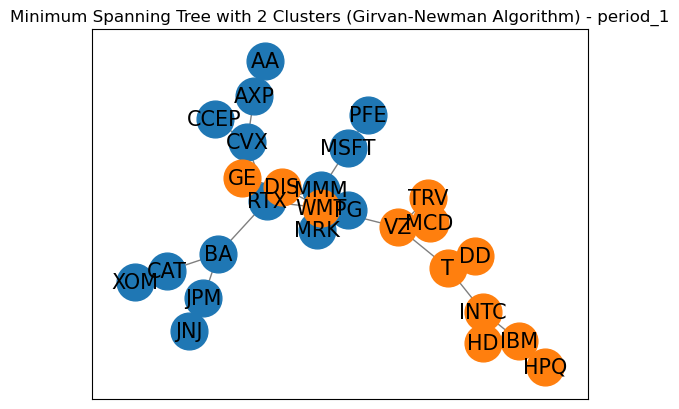

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


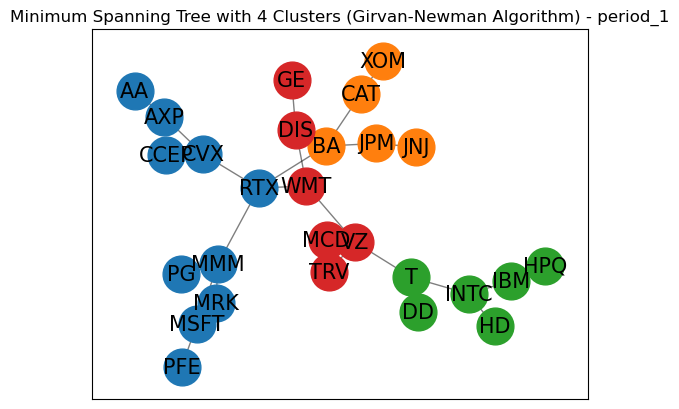

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


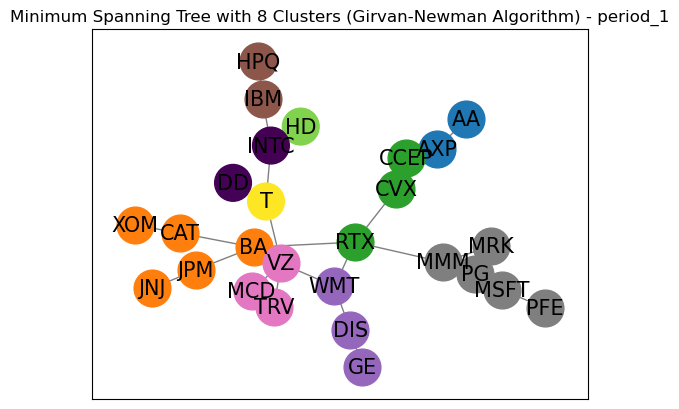

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


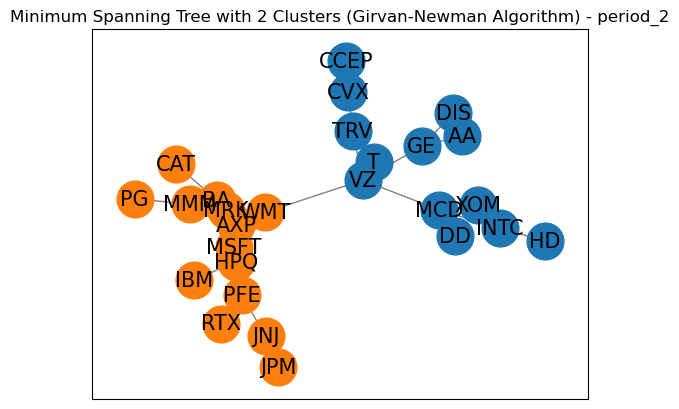

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


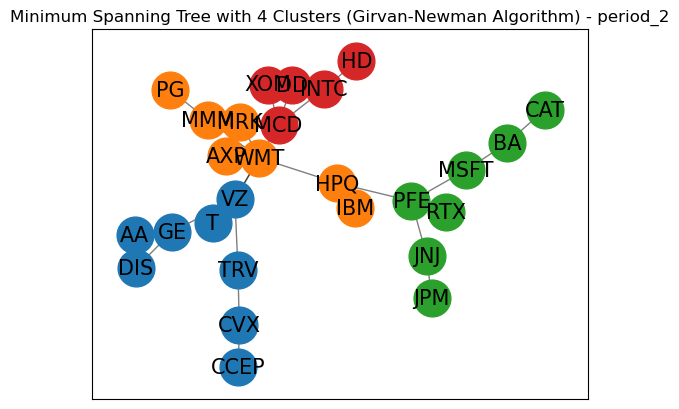

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


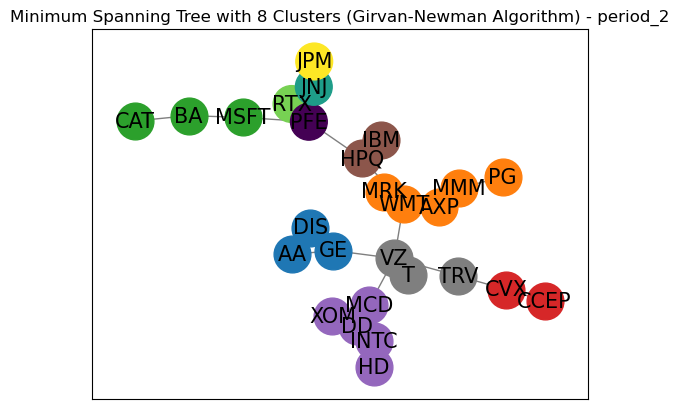

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


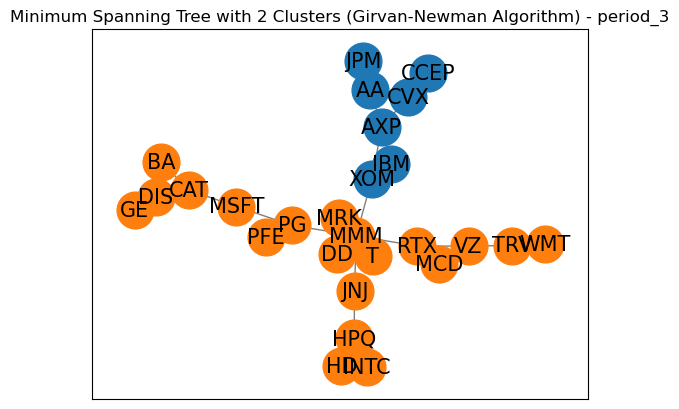

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


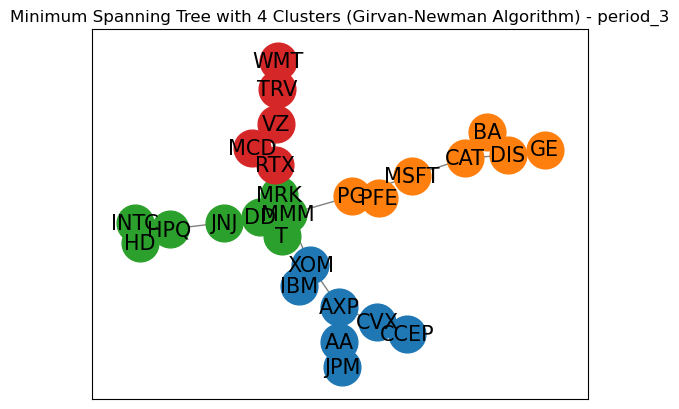

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


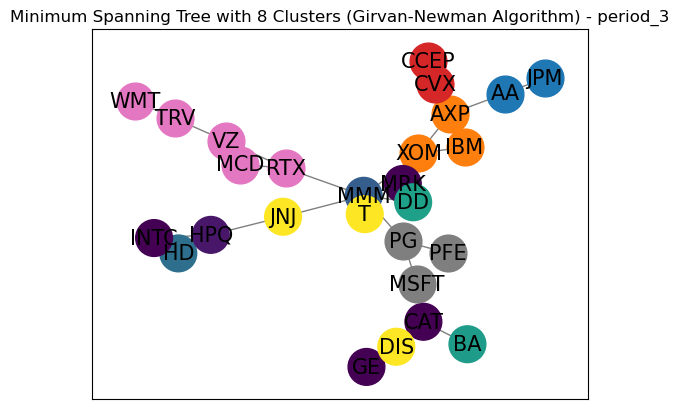

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


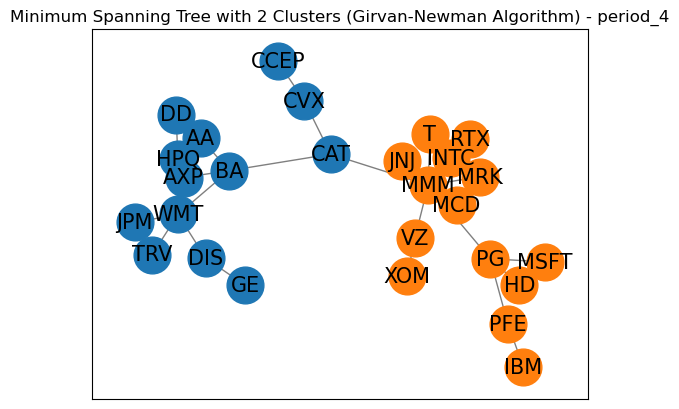

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


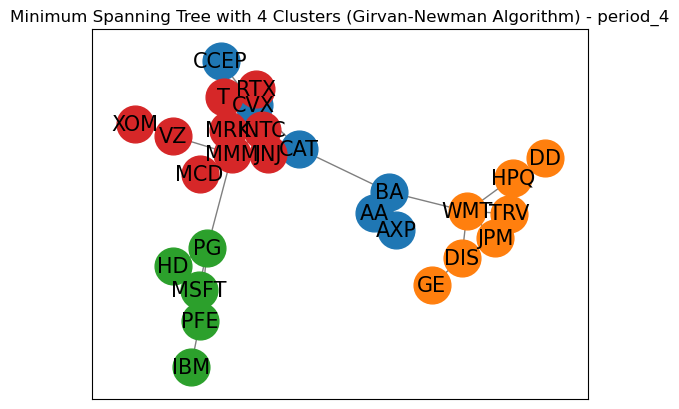

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

{0: 'AA', 1: 'AXP', 2: 'BA', 3: 'CAT', 4: 'CCEP', 5: 'CVX', 6: 'DD', 7: 'DIS', 8: 'GE', 9: 'HD', 10: 'HPQ', 11: 'IBM', 12: 'INTC', 13: 'JNJ', 14: 'JPM', 15: 'MCD', 16: 'MMM', 17: 'MRK', 18: 'MSFT', 19: 'PFE', 20: 'PG', 21: 'RTX', 22: 'T', 23: 'TRV', 24: 'VZ', 25: 'WMT', 26: 'XOM'}


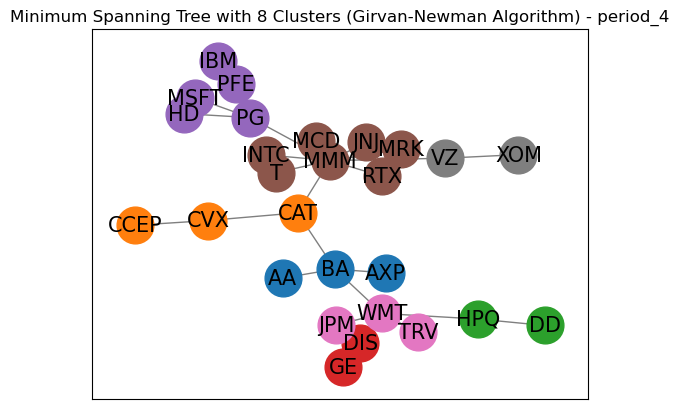

In [208]:
all_cluster_stocks_MST = MST(distance_matrices, custom_tickers)

In [170]:
result_df_MST = calculate_metrics_for_all_clusters(all_cluster_stocks_MST, period_dfs)
result_df_MST

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.001840,0.038978,0.009018,0.285866,"[MSFT, INTC, CVX, INTC, PFE, IBM, PFE, WMT, MMM, GE, MSFT, INTC, CCEP, MCD, CVX, HD, PG, INTC, RTX, HPQ, MSFT, HPQ, XOM, MCD, MSFT, WMT, PG, VZ, CVX, HPQ, JPM, MCD, MSFT, INTC, XOM, HD, MMM, DIS, JPM, IBM, JNJ, DIS, BA, INTC, CAT, MCD, CAT, VZ, XOM, HPQ, BA, TRV, PG, TRV, XOM, VZ, PFE, GE, CVX, DIS, BA, T, BA, IBM, XOM, WMT, CCEP, TRV, BA, VZ, BA, DIS, BA, T, CCEP, DIS, BA, TRV, JPM, HD, XOM, DD, AXP, T, CAT, DIS, CCEP, IBM, AXP, MCD, MSFT, VZ, MSFT, TRV, MRK, DIS, JPM, WMT, JPM, IBM, ...]"
period_1 (4 stocks),0.027165,0.033309,0.082759,0.520274,"[MMM, JPM, IBM, VZ, MRK, JPM, HD, TRV, MRK, JPM, HPQ, MCD, CCEP, XOM, INTC, VZ, MRK, JNJ, IBM, TRV, AA, CAT, DD, WMT, PFE, CAT, IBM, MCD, MSFT, JPM, DD, VZ, AA, CAT, HPQ, WMT, AXP, BA, DD, VZ, PFE, XOM, INTC, VZ, PG, JNJ, IBM, TRV, AA, CAT, DD, TRV, MMM, JNJ, IBM, GE, MMM, JNJ, HD, WMT, RTX, CAT, IBM, GE, AXP, JPM, T, GE, MRK, JNJ, INTC, MCD, AA, JNJ, T, DIS, CVX, CAT, DD, WMT, MRK, BA, HD, WMT, PG, JPM, T, DIS, AXP, XOM, DD, MCD, MSFT, JPM, IBM, DIS, AA, JPM, IBM, WMT, ...]"
period_1 (8 stocks),0.019368,0.031629,0.063823,0.372108,"[AA, JPM, CCEP, DD, GE, IBM, VZ, MSFT, AXP, JNJ, CCEP, DD, GE, IBM, MCD, MSFT, AXP, BA, CVX, T, WMT, HPQ, MCD, PG, AA, XOM, CCEP, DD, DIS, IBM, TRV, MRK, AA, CAT, CCEP, INTC, WMT, HPQ, TRV, MRK, AA, JNJ, CVX, DD, WMT, HPQ, MCD, PG, AA, BA, CVX, DD, GE, HPQ, MCD, MMM, AA, JNJ, RTX, T, WMT, IBM, MCD, MRK, AXP, JNJ, CVX, HD, DIS, IBM, TRV, PG, AXP, CAT, RTX, DD, GE, HPQ, MCD, MRK, AA, JNJ, CVX, T, GE, IBM, VZ, PFE, AXP, JNJ, CVX, HD, GE, IBM, VZ, MSFT, AA, JPM, RTX, DD, ...]"
period_2 (2 stocks),0.282420,0.022345,1.280029,0.330971,"[DIS, RTX, VZ, AXP, MCD, PFE, VZ, RTX, AA, HPQ, CVX, HPQ, AA, RTX, T, MRK, T, PG, DD, CAT, INTC, AXP, DD, PFE, HD, PFE, CCEP, JPM, AA, JNJ, TRV, WMT, CVX, HPQ, DIS, AXP, VZ, PFE, HD, CAT, TRV, BA, GE, CAT, MCD, RTX, INTC, JNJ, T, MSFT, MCD, BA, VZ, JNJ, AA, MRK, DD, HPQ, HD, HPQ, T, HPQ, TRV, WMT, T, JPM, DIS, IBM, TRV, MSFT, T, WMT, TRV, MMM, CVX, HPQ, HD, MSFT, DD, MRK, VZ, PG, XOM, PFE, CCEP, BA, HD, MRK, GE, MSFT, GE, RTX, INTC, MMM, GE, BA, XOM, MRK, VZ, RTX, ...]"
period_2 (4 stocks),0.245430,0.018653,1.376736,0.241178,"[AA, HPQ, JPM, HD, DIS, MRK, JPM, HD, GE, HPQ, BA, XOM, TRV, HPQ, CAT, DD, T, PG, MSFT, XOM, TRV, MMM, CAT, HD, TRV, IBM, BA, INTC, GE, AXP, BA, INTC, CCEP, MRK, MSFT, INTC, DIS, AXP, JPM, XOM, CCEP, MRK, JPM, DD, DIS, MMM, BA, DD, TRV, HPQ, CAT, XOM, GE, AXP, JNJ, HD, CCEP, HPQ, CAT, HD, AA, PG, BA, XOM, VZ, IBM, MSFT, DD, GE, IBM, RTX, DD, AA, WMT, JNJ, XOM, CCEP, WMT, JPM, DD, CVX, MRK, MSFT, DD, DIS, HPQ, CAT, HD, CVX, PG, BA, MCD, CCEP, WMT, PFE, XOM, T, IBM, RTX, MCD, ...]"
period_2 (8 stocks),0.261473,0.016053,1.644249,0.205074,"[GE, WMT, CAT, CCEP, DD, IBM, JPM, T, GE, MRK, BA, CVX, INTC, IBM, RTX, TRV, DIS, MRK, MSFT, CVX, INTC, IBM, JPM, T, AA, MMM, MSFT, CCEP, MCD, HPQ, JPM, VZ, DIS, AXP, MSFT, CCEP, DD, IBM, JNJ, T, AA, WMT, MSFT, CCEP, MCD, HPQ, RTX, VZ, AA, PG, BA, CCEP, HD, IBM, PFE, T, AA, WMT, CAT, CCEP, MCD, HPQ, RTX, T, GE, PG, MSFT, CVX, DD, HPQ, JNJ, T, GE, WMT, MSFT, CVX, INTC, IBM, PFE, T, GE, WMT, BA, CCEP, XOM, IBM, PFE, T, DIS, WMT, BA, CCEP, MCD, IBM, JNJ, VZ, AA, PG, MSFT, CCEP, ...]"
period_3 (2 stocks),0.018151,0.045990,0.092861,0.573544,"[AXP, DIS, CCEP, DD, JPM, T, AA, TRV, IBM, PG, AXP, TRV, AA, TRV, JPM, T, IBM, HD, CCEP, TRV, XOM, PG, CCEP, MMM, CCEP, BA, IBM, VZ, JPM, DIS, CCEP, MCD, XOM, HD, CVX, T, CVX, PG, IBM, INTC, AXP, INTC, XOM, INTC, AA, HPQ, AA, CAT, JPM, PG, AXP, JNJ, AXP, HD, JPM, T, AXP, HD, XOM, PFE, CVX, INTC, JPM, MCD, XOM, DIS, IBM, TRV, CCEP, DD, JPM, INTC, CCEP, MRK, CCEP, MMM, CVX, MCD, CCEP, DD, AA, CAT, AXP, GE, XOM, PFE, JPM, MMM, AXP, WMT, CCEP, HD, XOM, HPQ, XOM, JNJ, AA, DD, CCEP, HD, ...]"
period_3 (4 stocks),0.007081,0.039581,0.039543,0.570889,"[AXP, PG, MRK, TRV, AA, PFE, T, MCD, XOM, MSFT, T, VZ, XOM, GE, HPQ, WMT, IBM, PFE, INTC, MCD, CVX, MSFT, HPQ, RTX, 

In [28]:
############# Plots and Diagrams ##############

In [174]:
def count_of_stocks(result_df_clusters,custom_tickers):
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers, columns=[period])

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers
        total_counts = counts_df.sum(axis=1)

        # Get the top 8 stocks and group the rest into "Other"
        top_8 = total_counts.nlargest(8)
        other = pd.Series(total_counts.sum() - top_8.sum(), index=["Other"])

        # Concatenate the top 8 and "Other"
        final_counts = pd.concat([top_8, other])

        # Plot the pie chart for the current period
        plt.figure(figsize=(8, 8))
        plt.pie(final_counts, labels=final_counts.index, autopct='%1.1f%%', startangle=140)
        plt.axis('equal')
        plt.title(f'Top 8 Stocks - {period}')
        plt.show()
        total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Plot the pie chart for all periods combined
    plt.figure(figsize=(8, 8))
    plt.pie(total_counts, labels=total_counts.index, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title('All Stocks - All Periods Combined')
    plt.show()

    ################################################################################################
    total_counts_df = pd.DataFrame(index=custom_tickers)

    # Iterate over each period
    for period, group in result_df_clusters.groupby(level=0):
        # Create an empty DataFrame to store counts for the current period
        counts_df = pd.DataFrame(index=custom_tickers)

        # Count occurrences of each ticker in the current period
        ticker_counts = pd.Series(group["Stocks"].sum()).value_counts()
        counts_df[period] = ticker_counts.reindex(custom_tickers, fill_value=0)

        # Sum the counts across tickers for the current period
        total_counts_df[period] = counts_df.sum(axis=1)

    # Sum the counts across all periods
    total_counts = total_counts_df.sum(axis=1)

    # Sort the total counts in descending order
    total_counts_sorted = total_counts.sort_values(ascending=False)

    # Plot the bar chart for all periods combined
    plt.figure(figsize=(10, 6))
    total_counts_sorted.plot(kind='bar')
    plt.xlabel('Stock')
    plt.ylabel('Count')
    plt.title('Total Counts of Each Stock Across All Periods')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

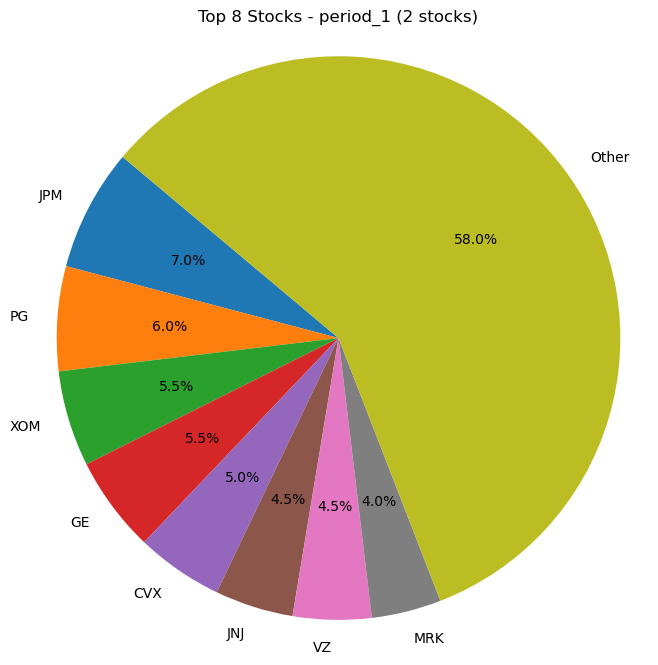

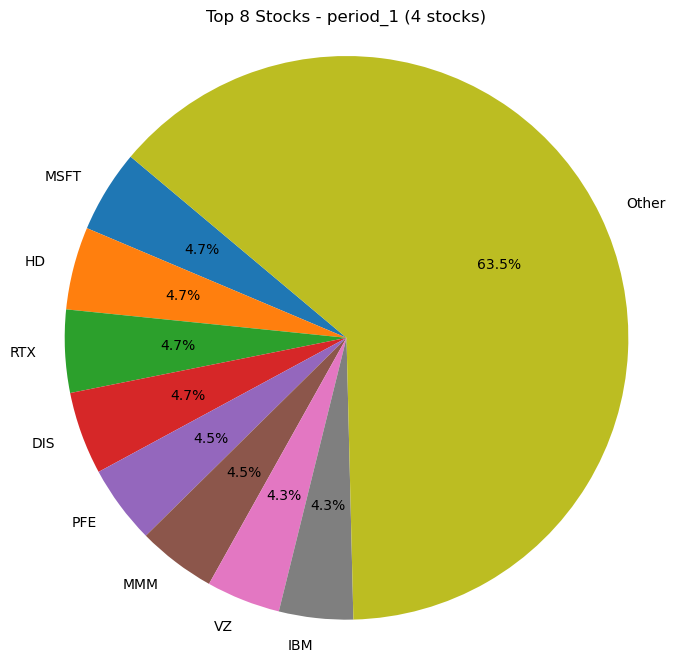

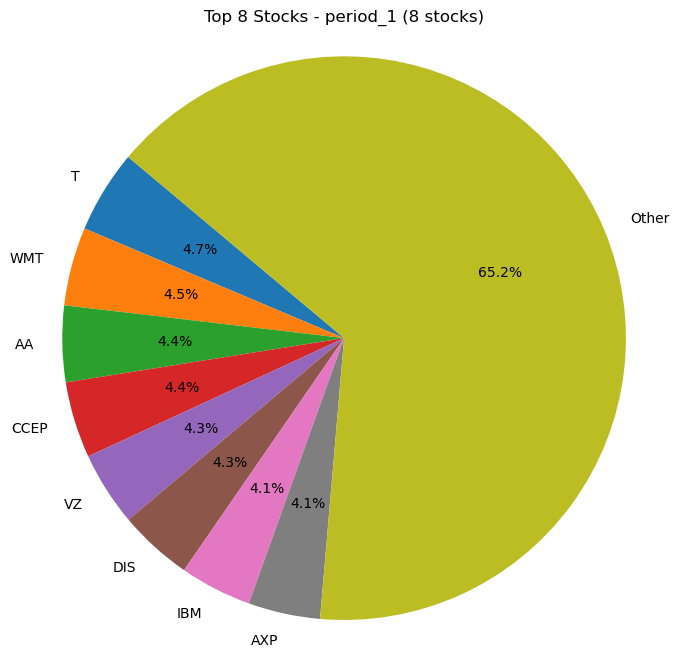

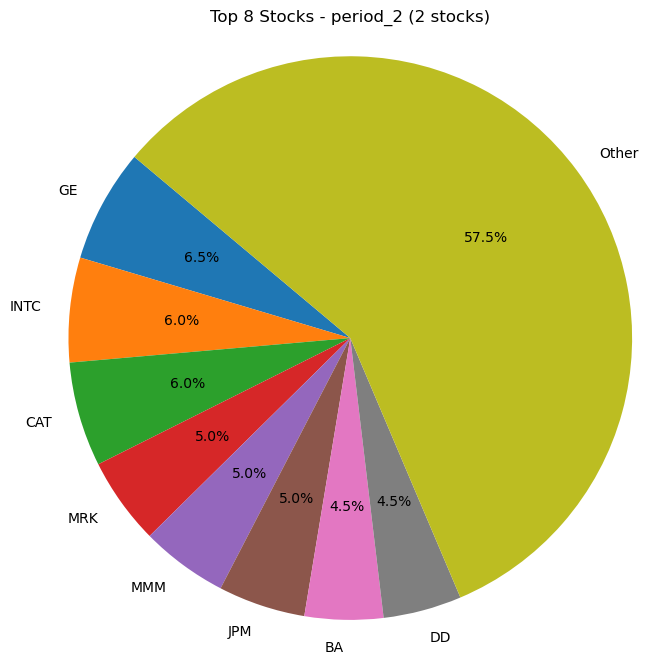

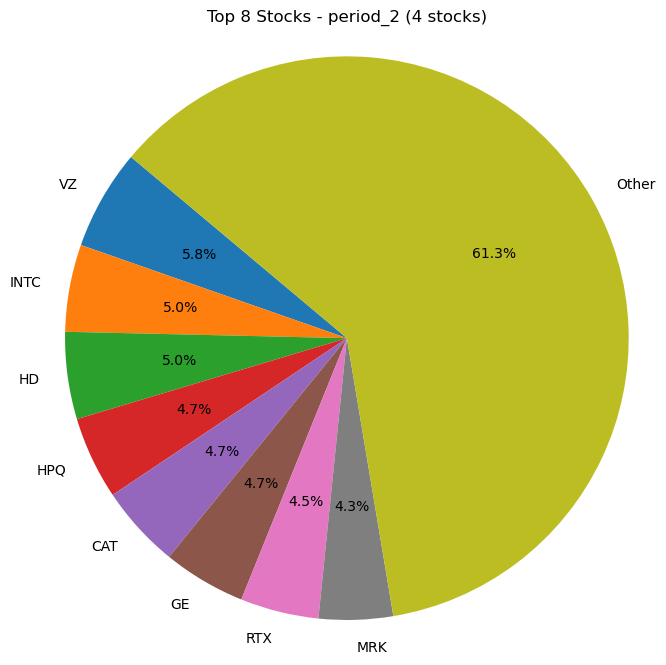

...

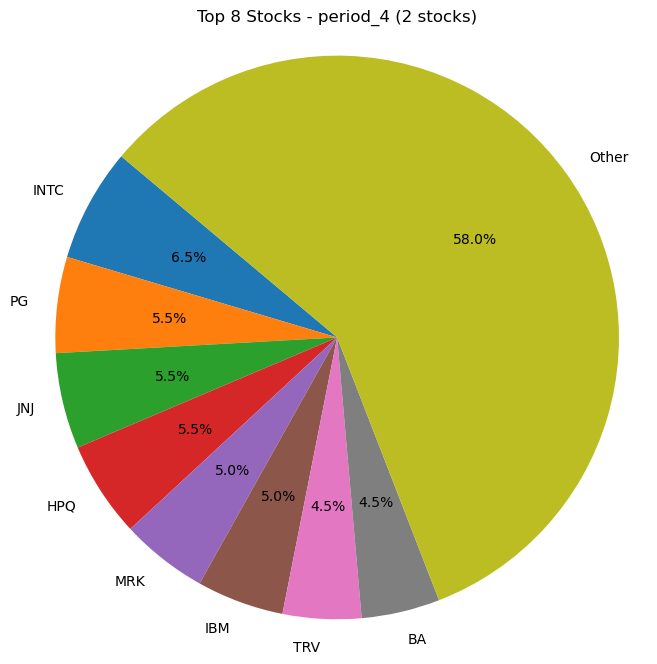

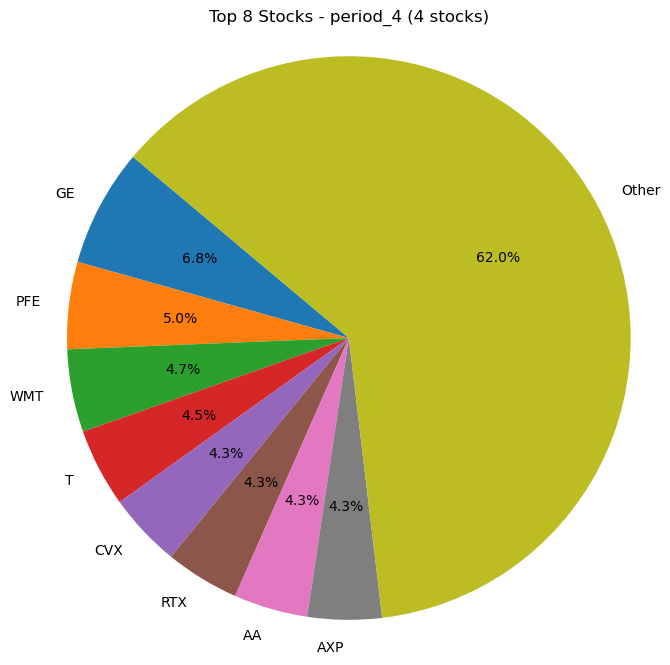

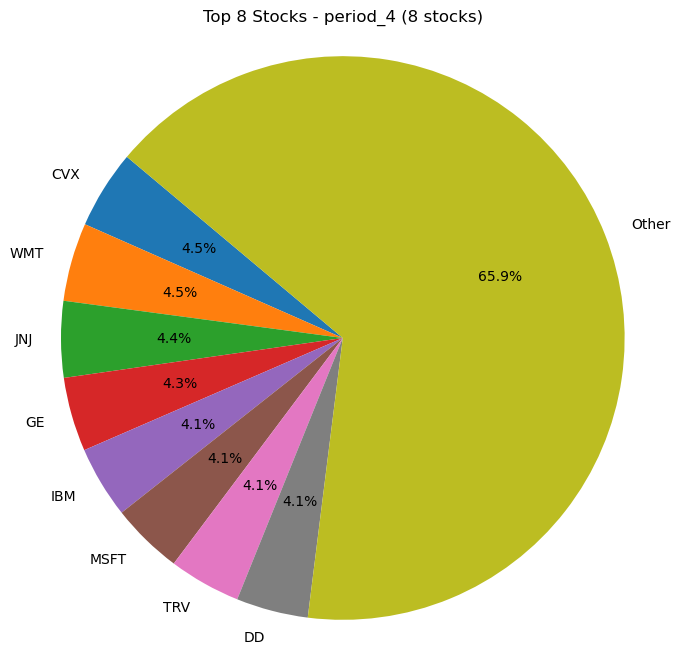

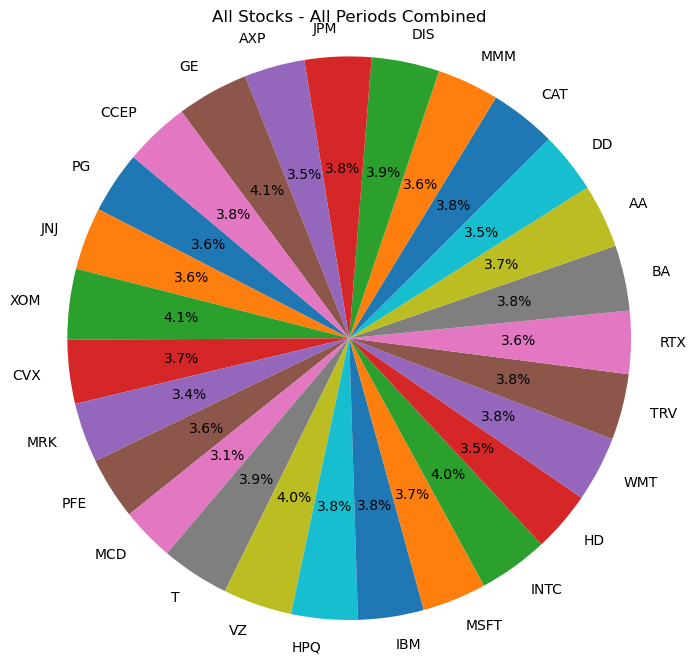

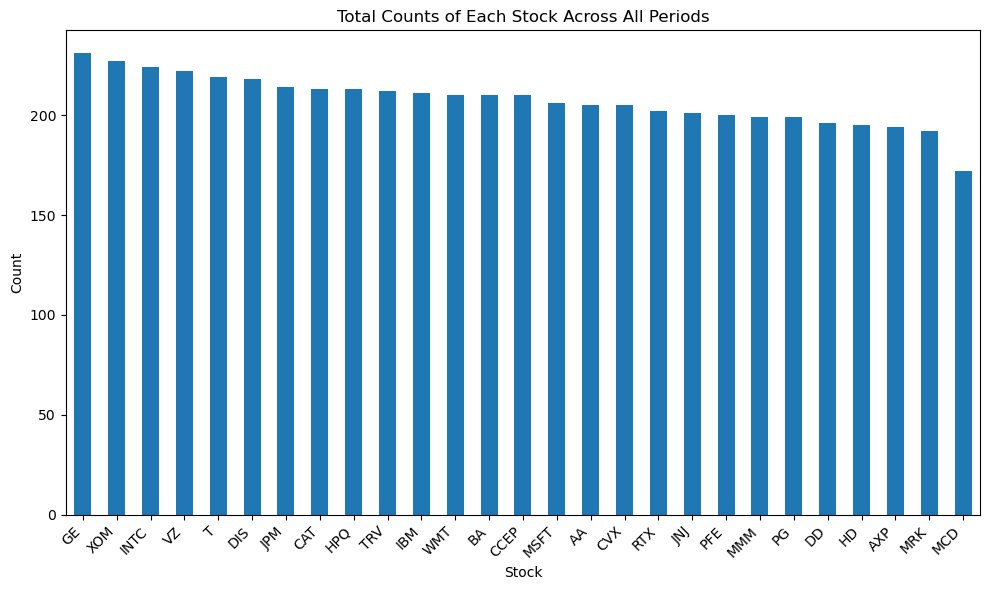

In [30]:
count_of_stocks(result_df_random,custom_tickers)

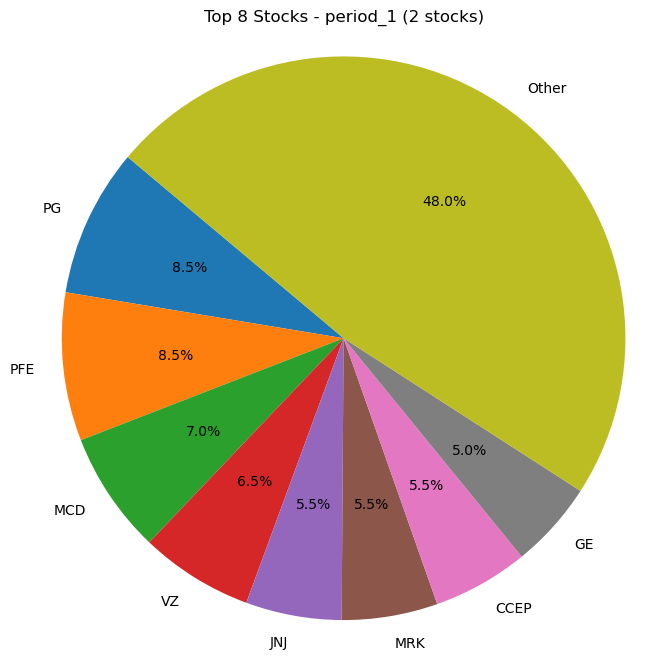

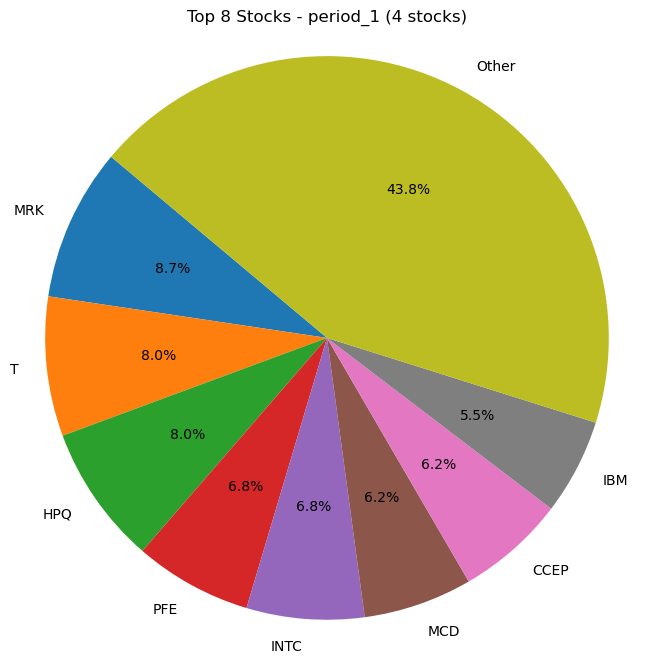

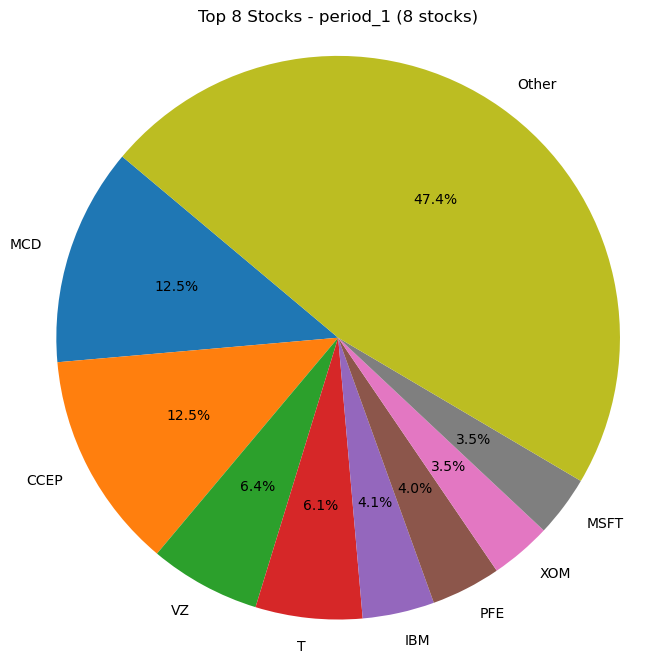

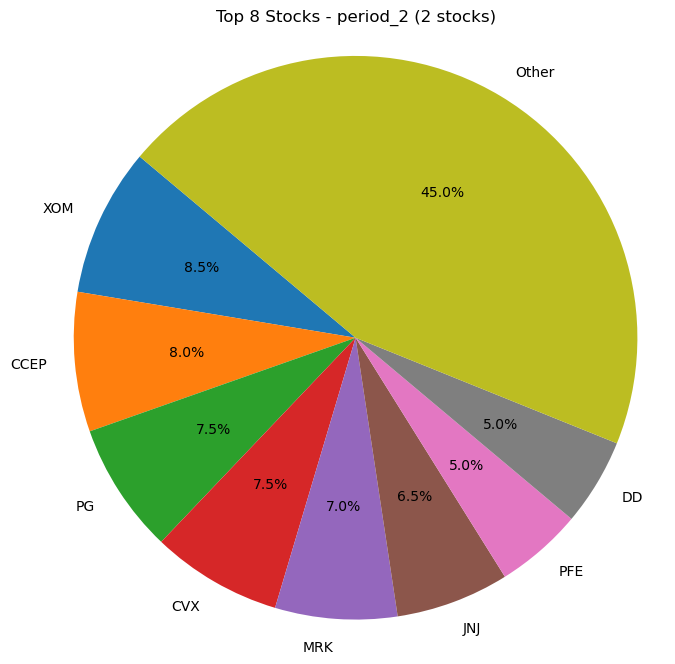

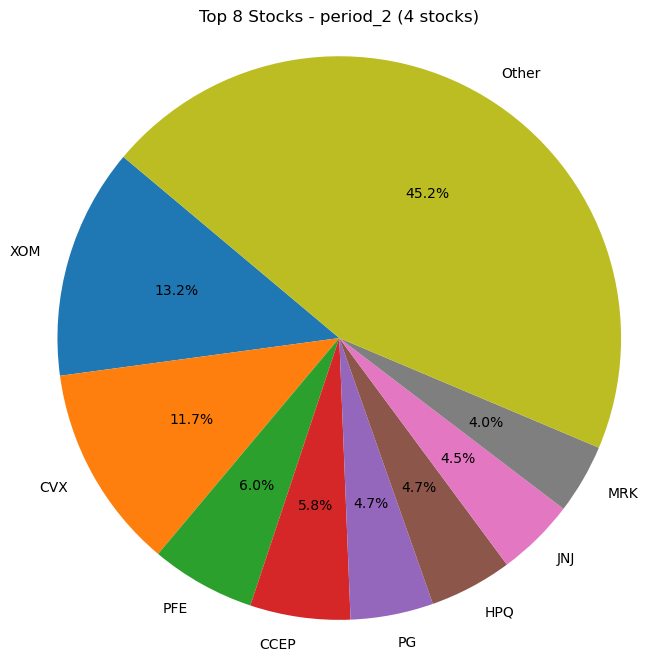

...

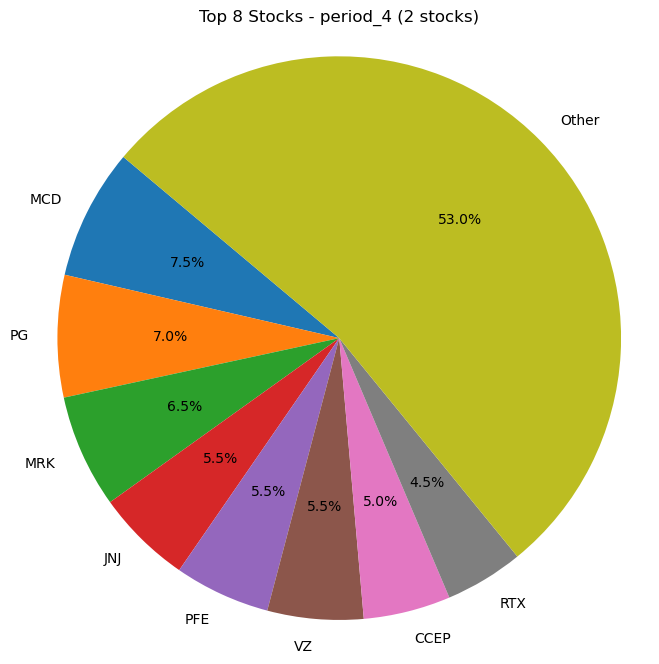

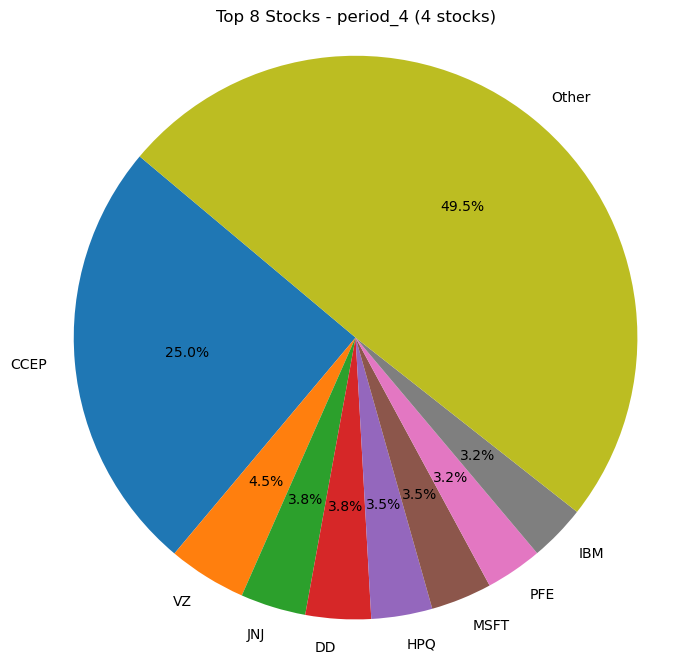

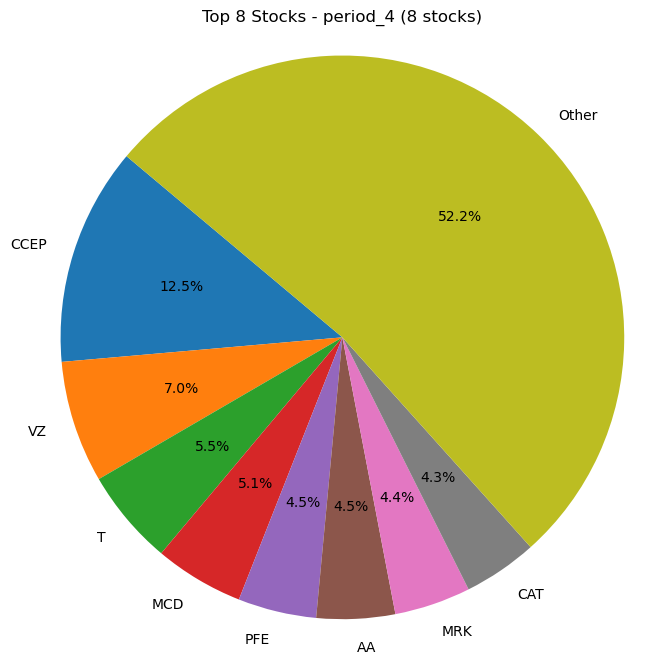

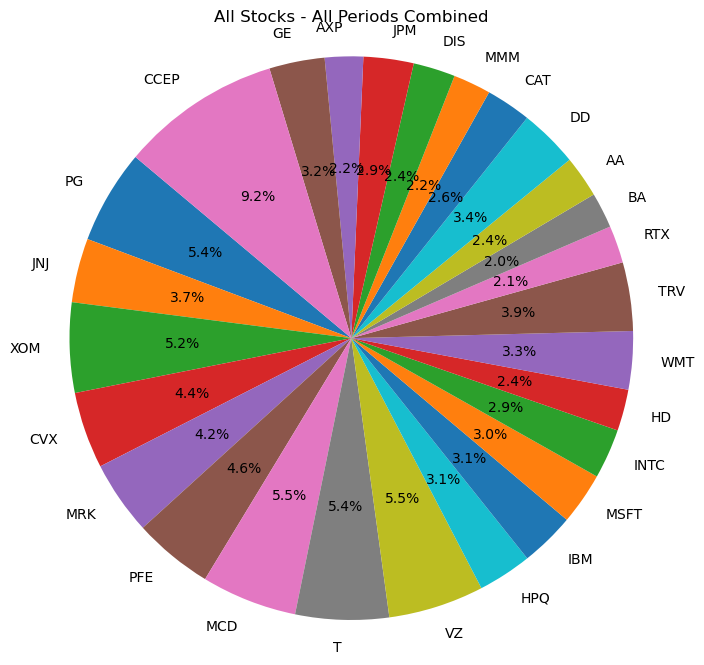

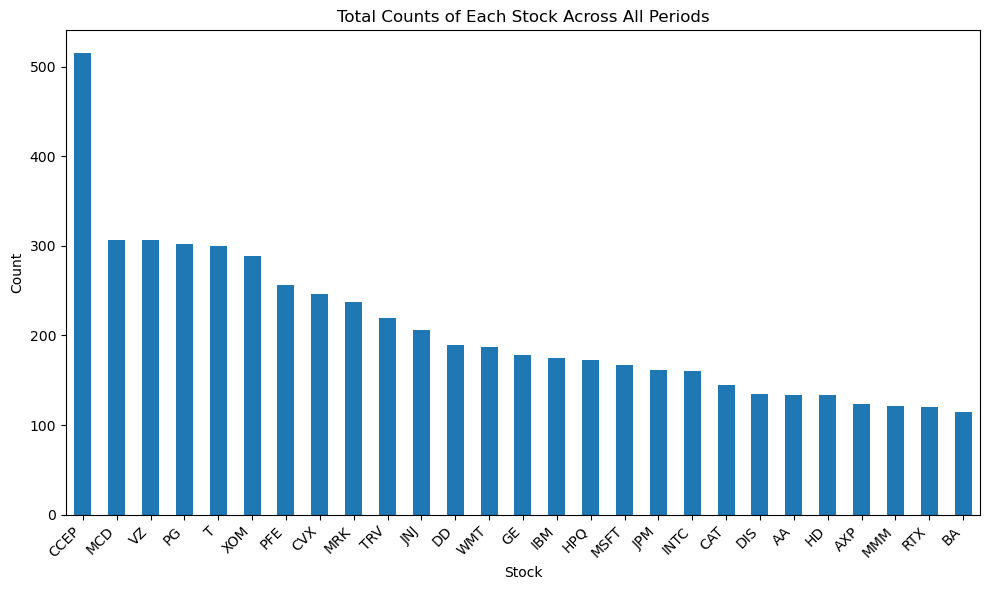

In [31]:
count_of_stocks(result_df_HCT,custom_tickers)

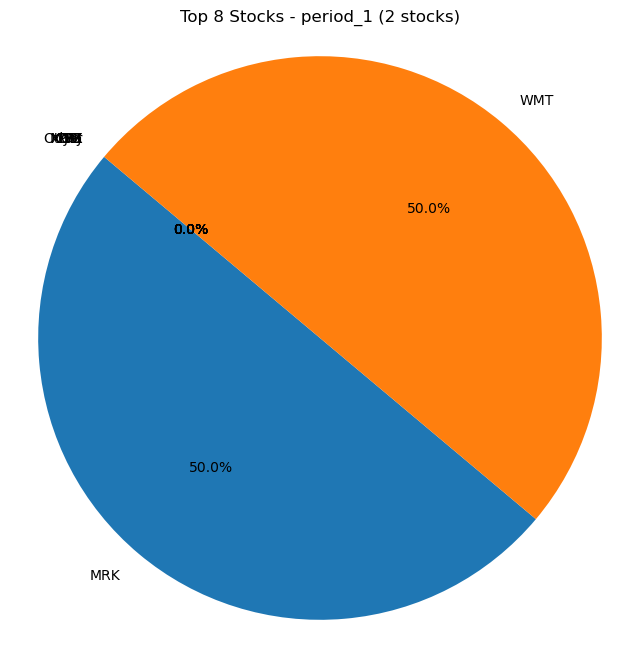

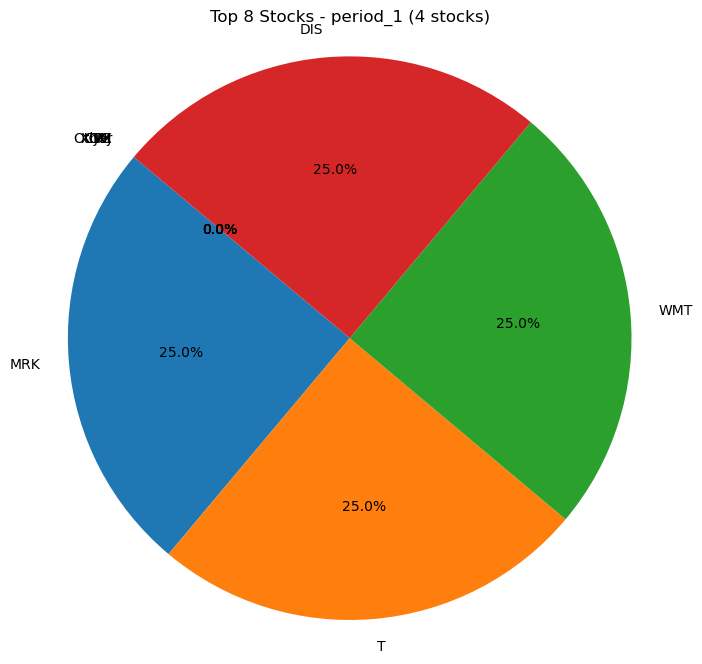

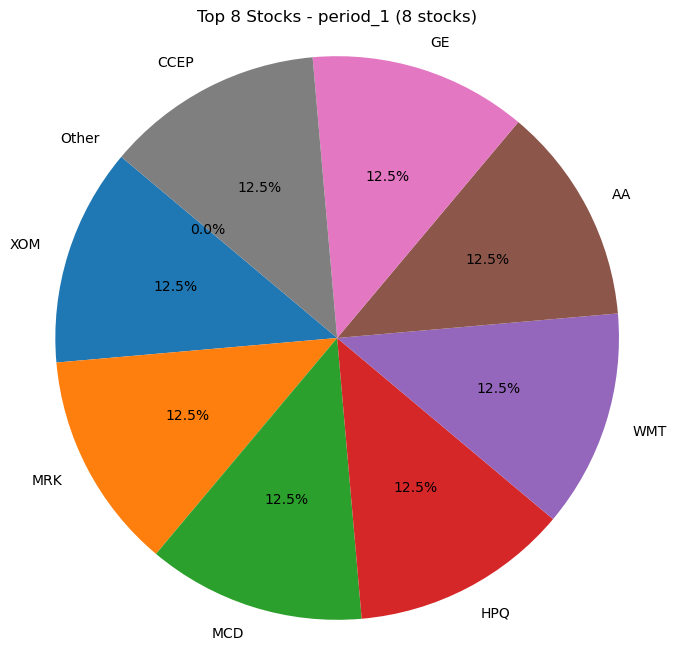

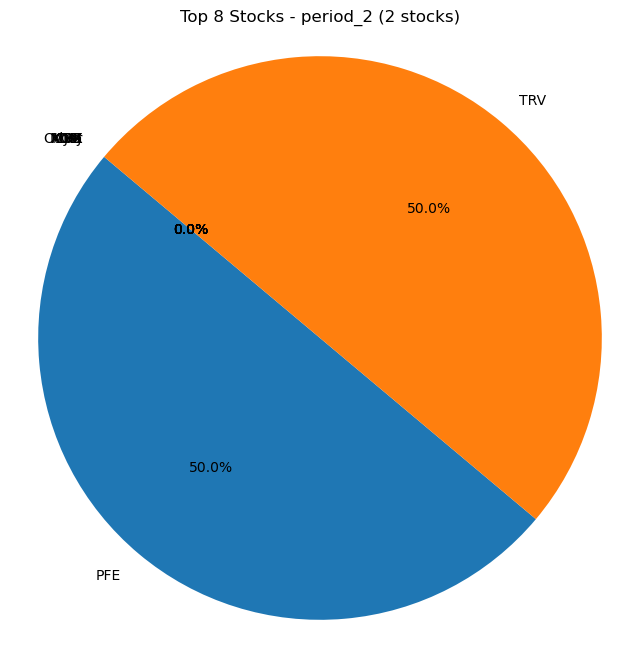

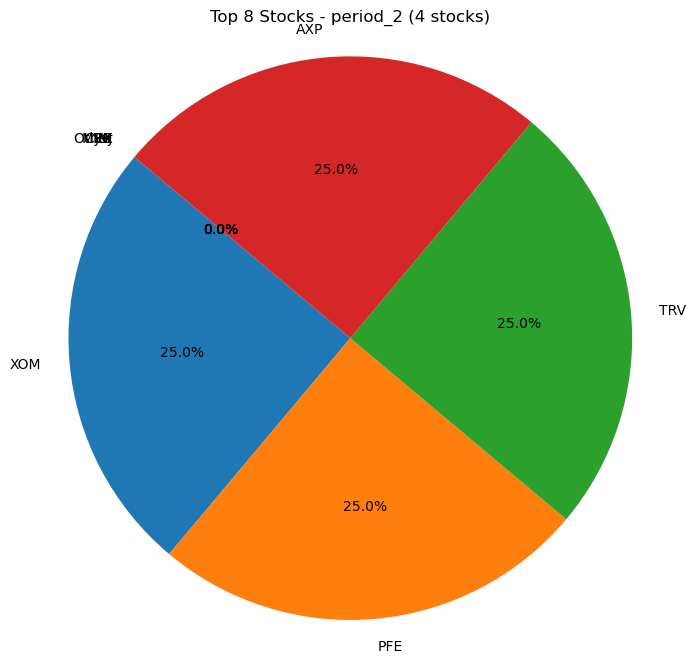

...

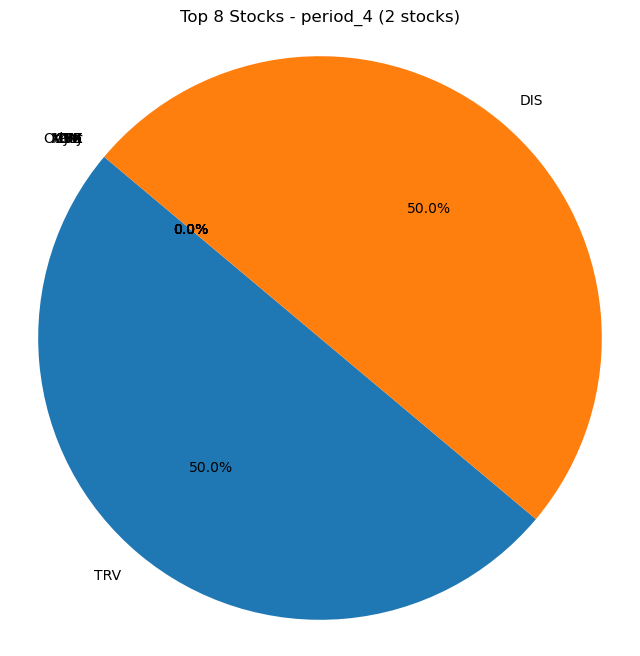

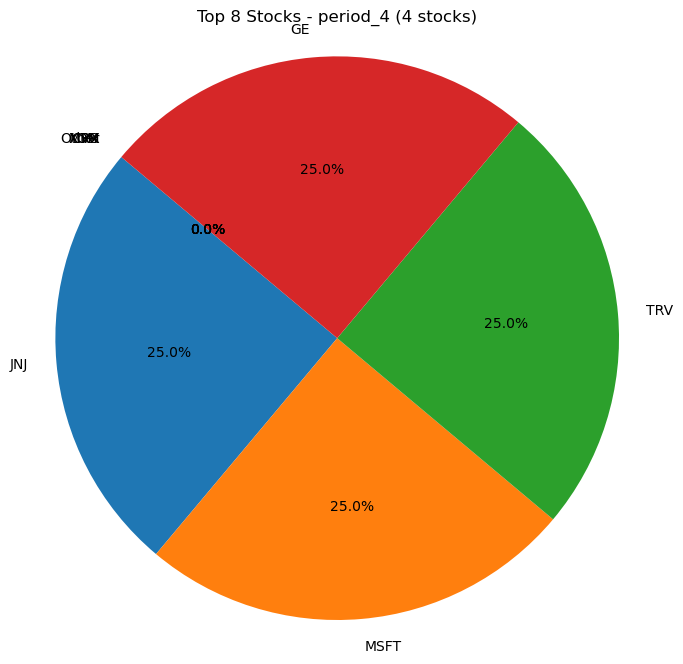

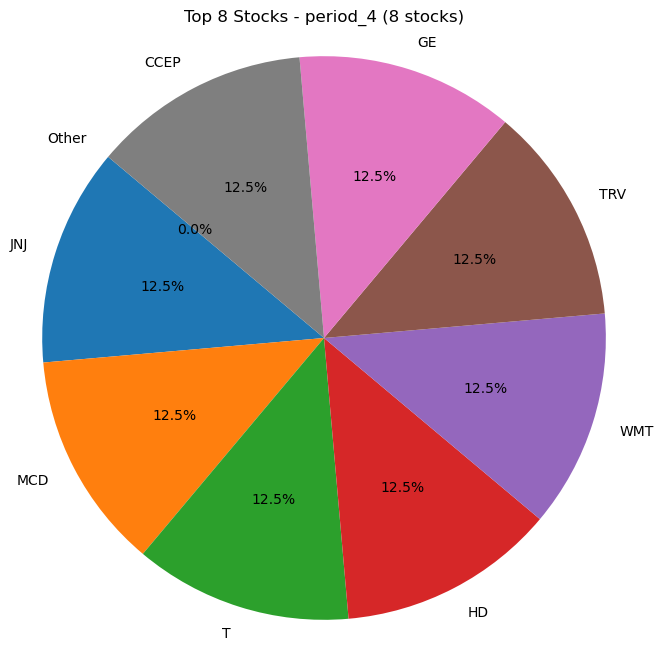

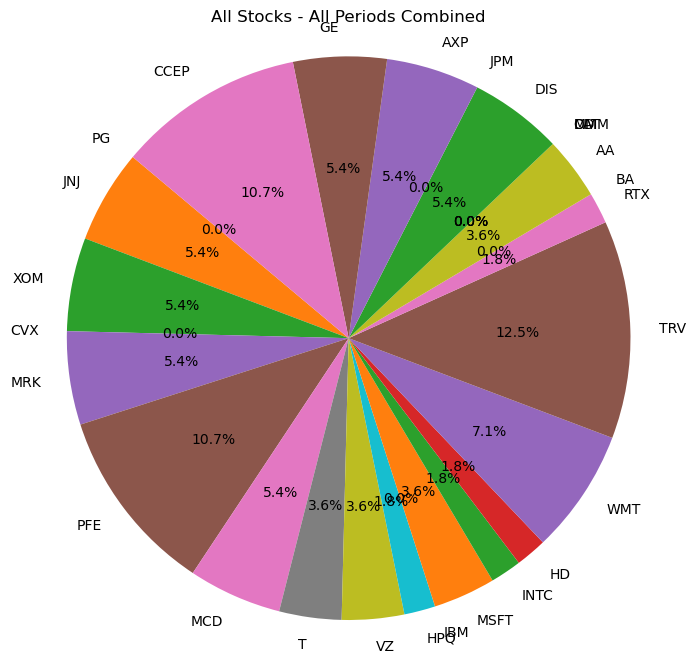

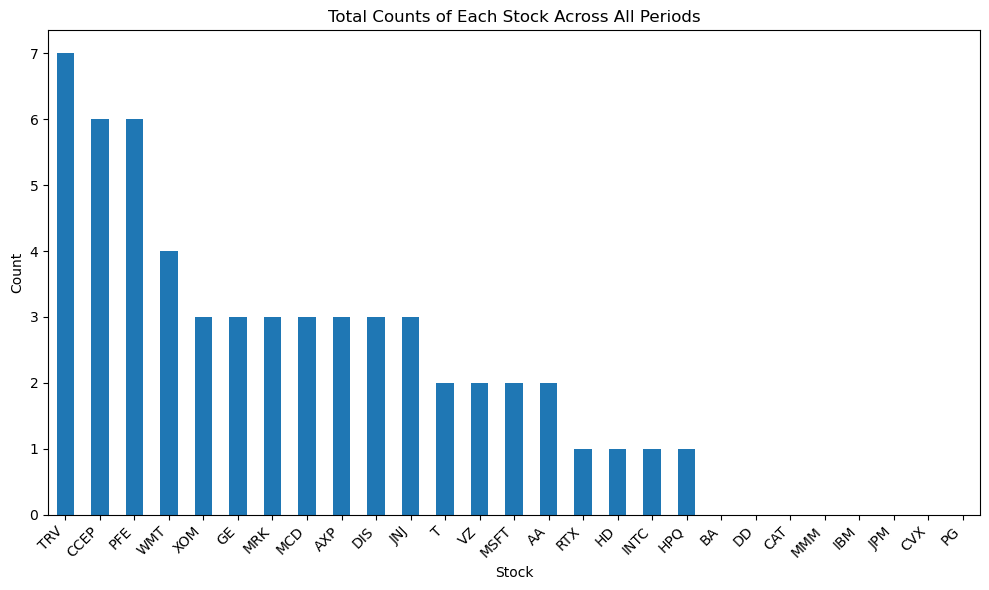

In [32]:
count_of_stocks(result_df_kmeans,custom_tickers)

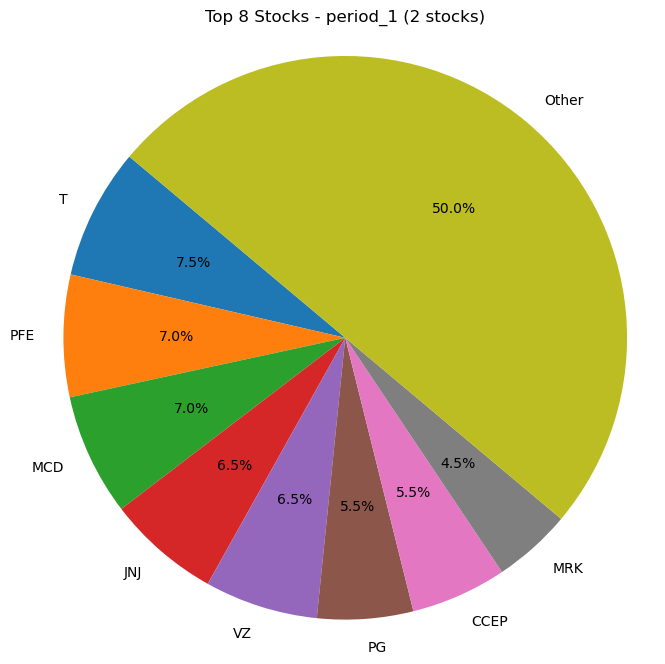

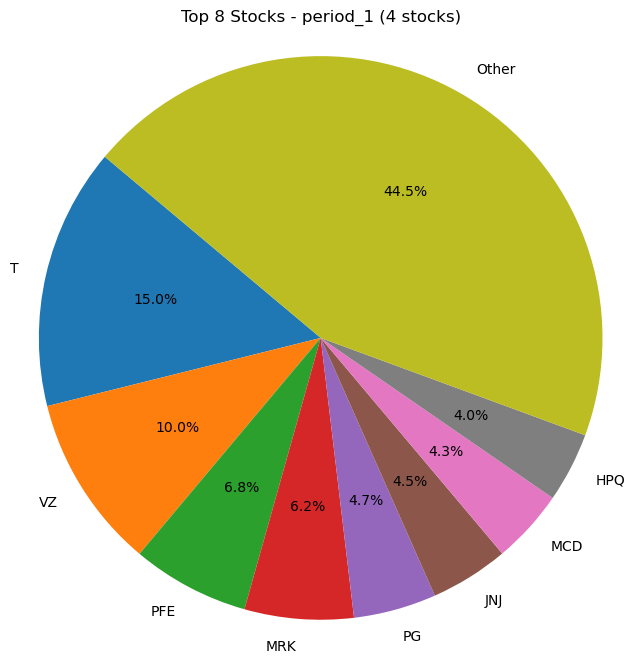

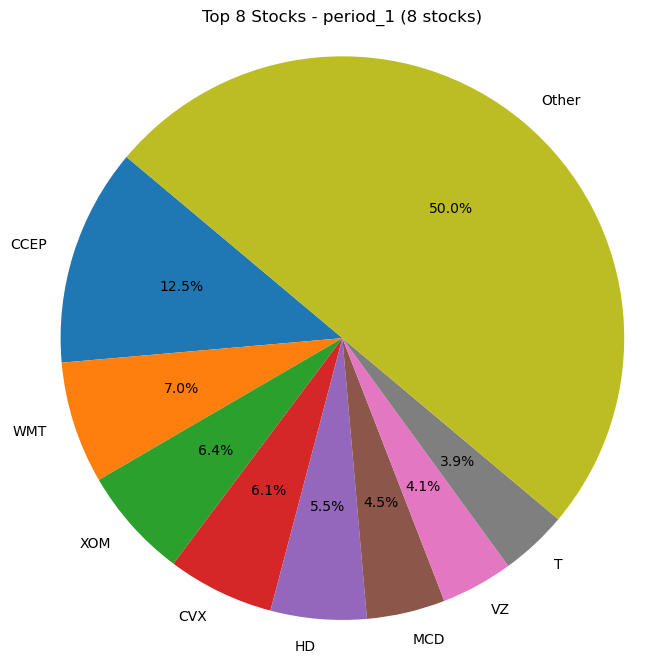

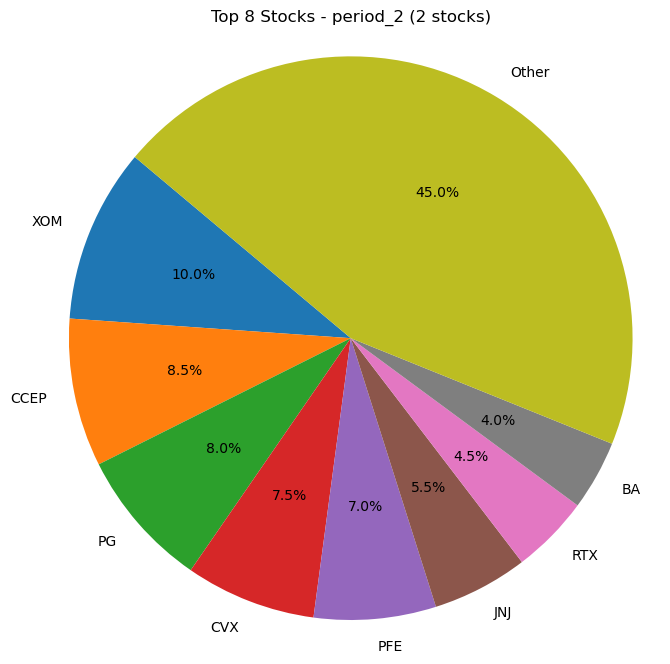

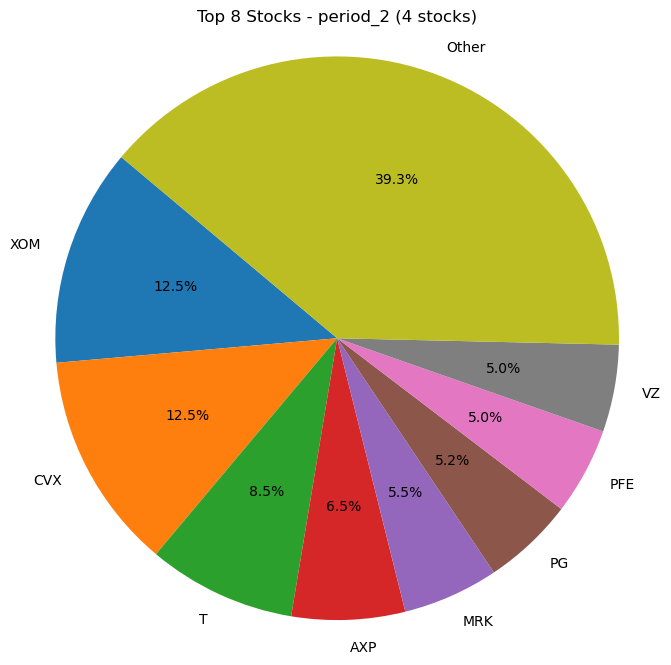

...

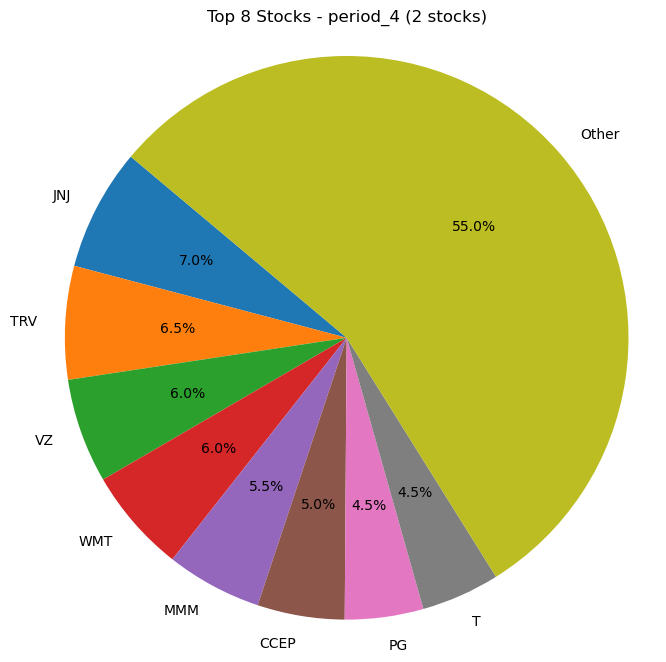

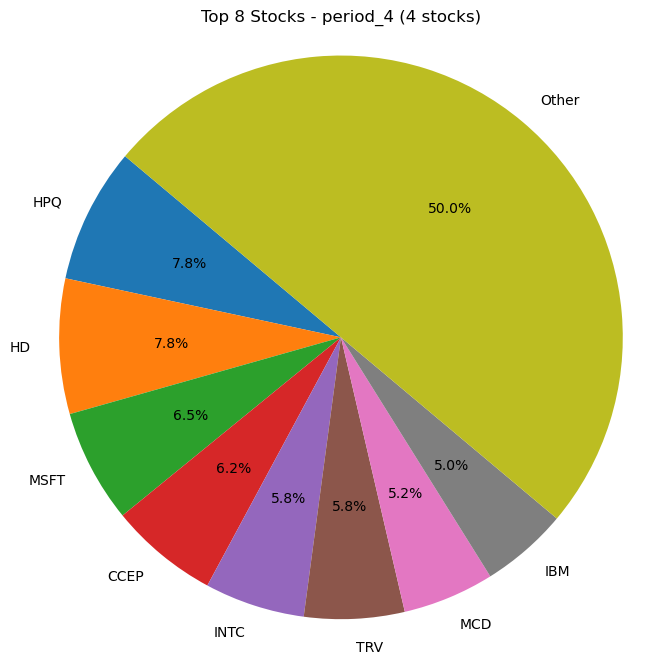

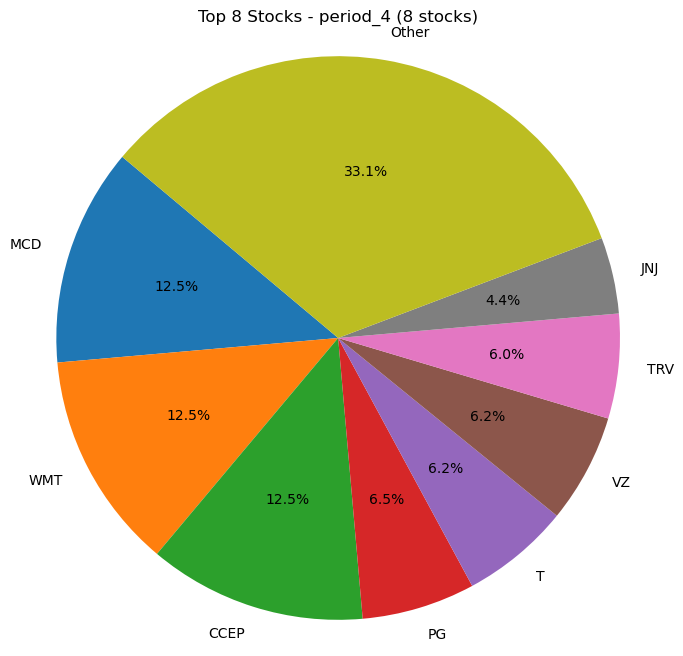

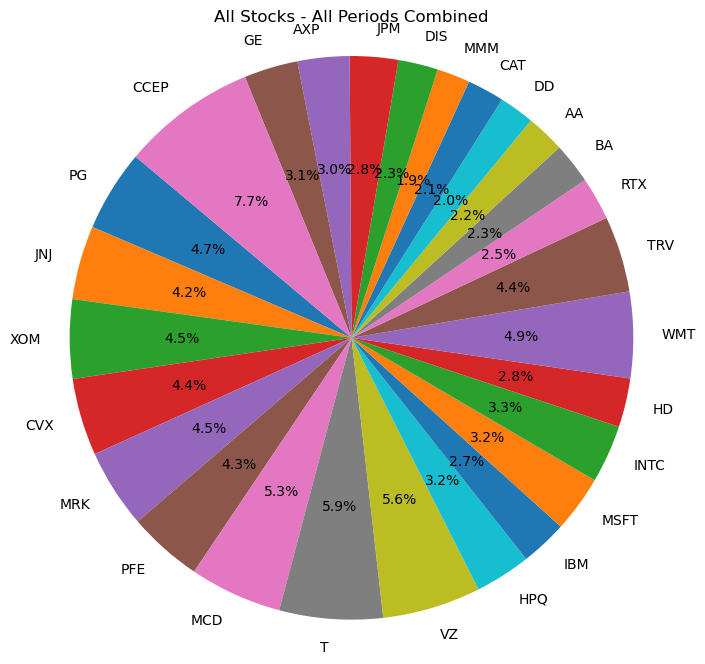

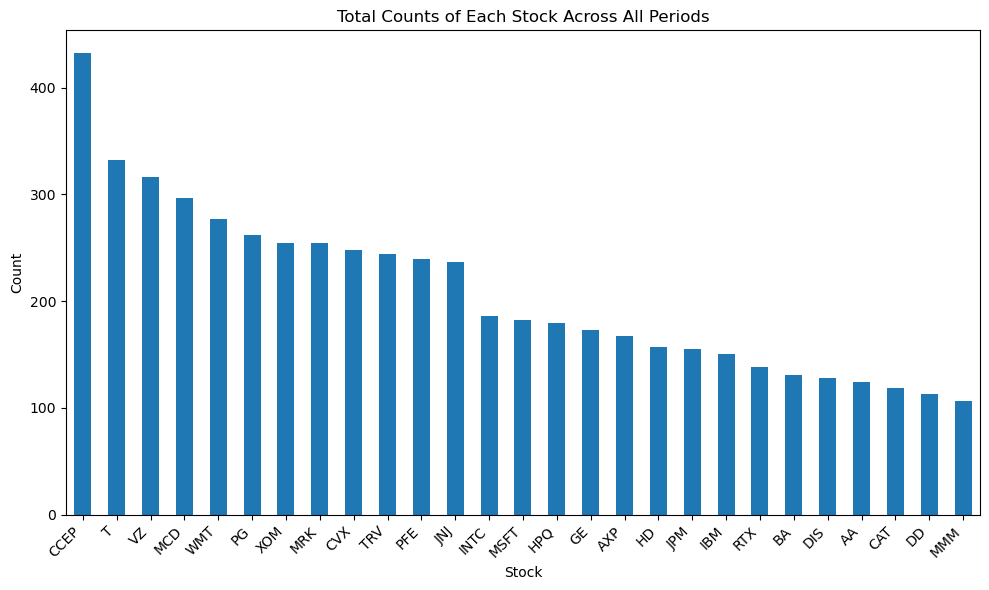

In [33]:
count_of_stocks(result_df_kmeans_rand,custom_tickers)

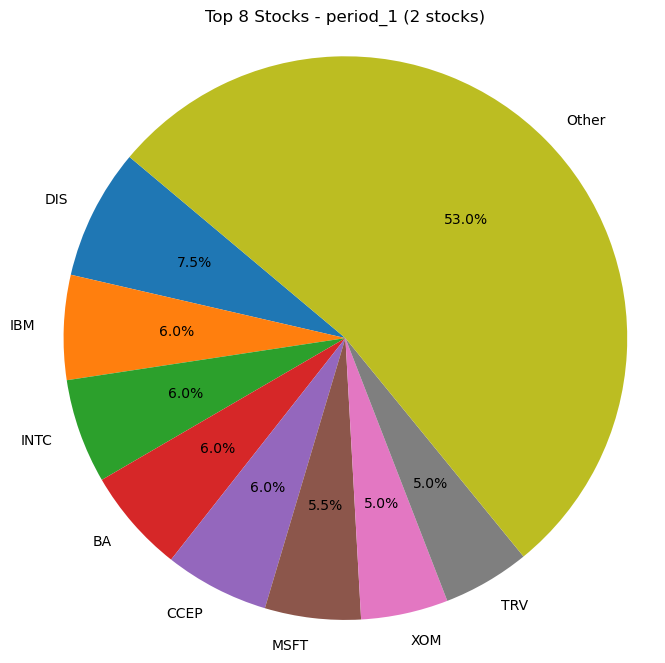

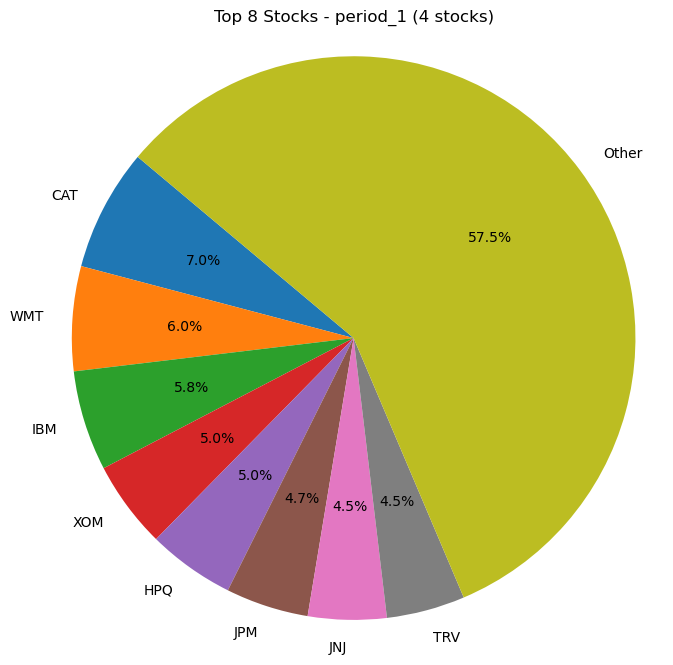

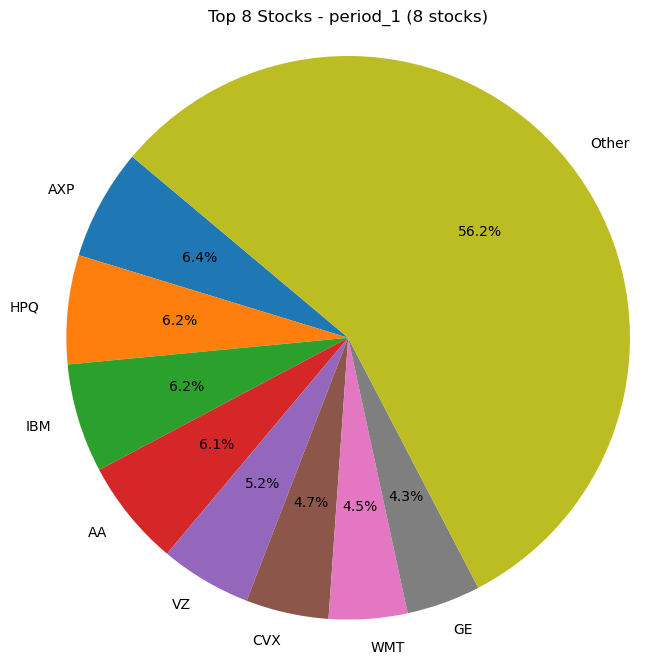

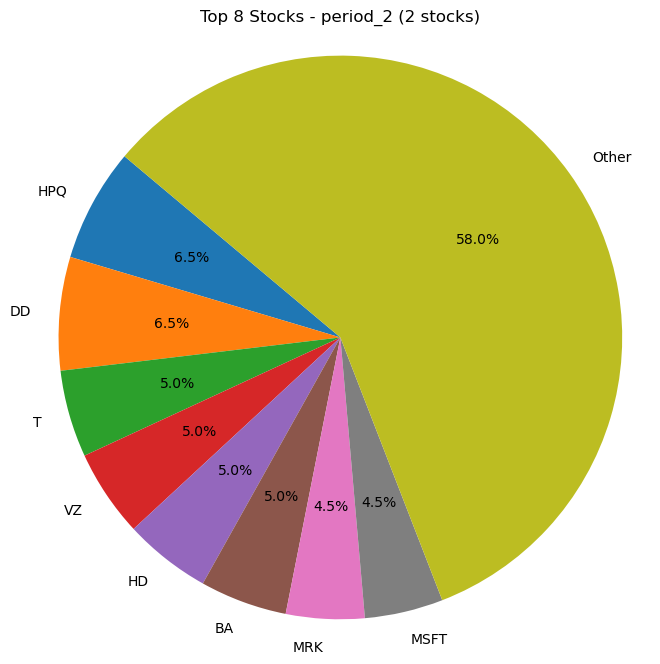

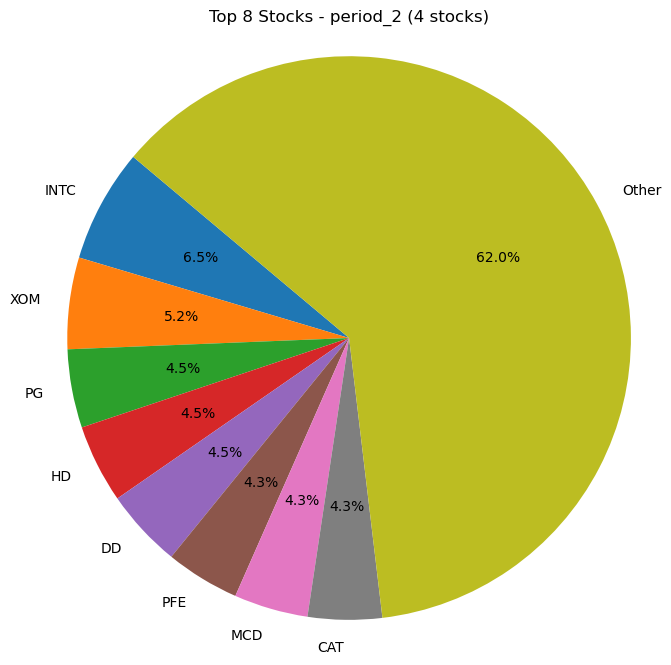

...

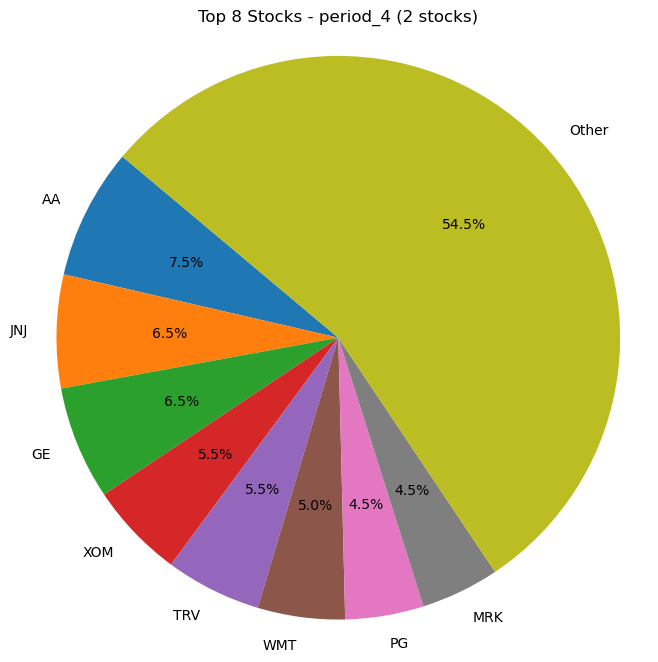

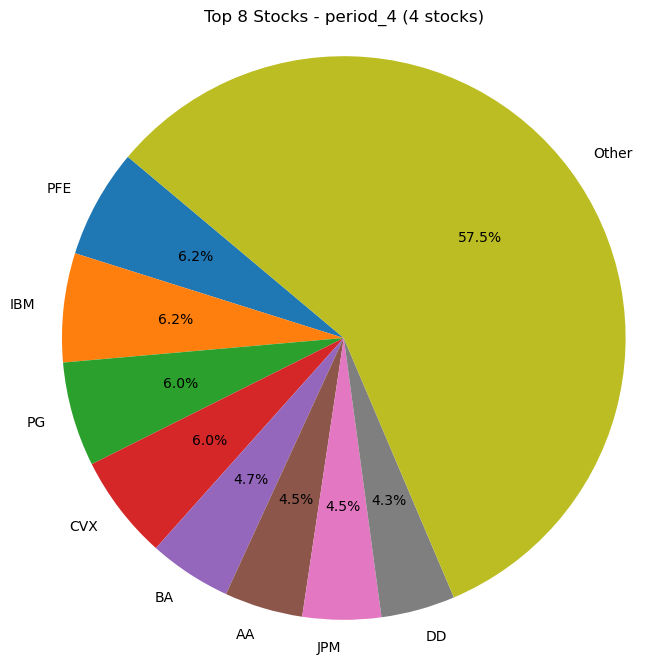

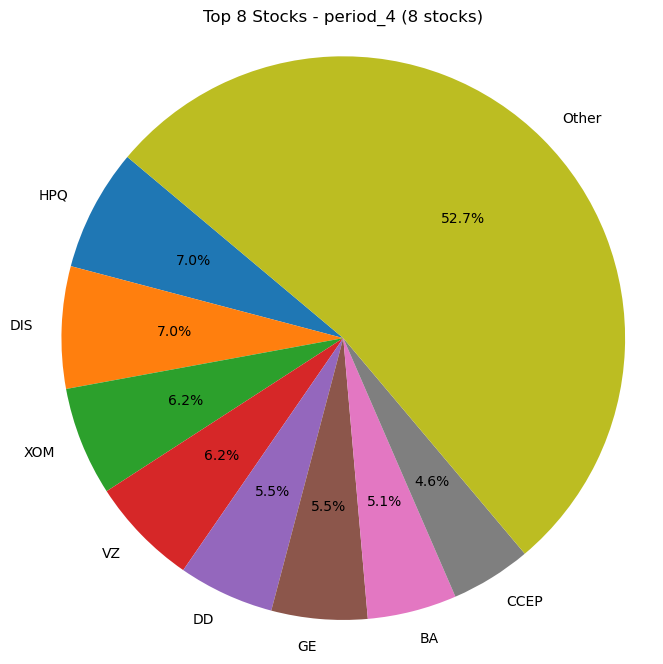

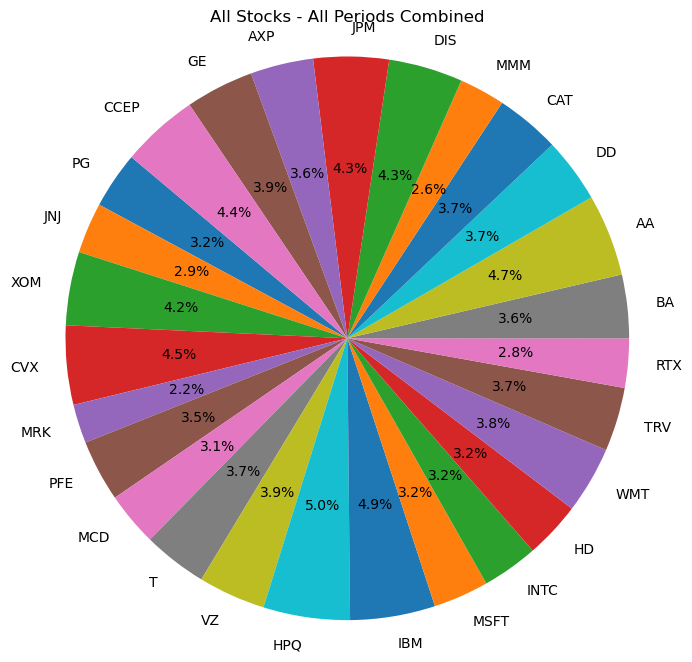

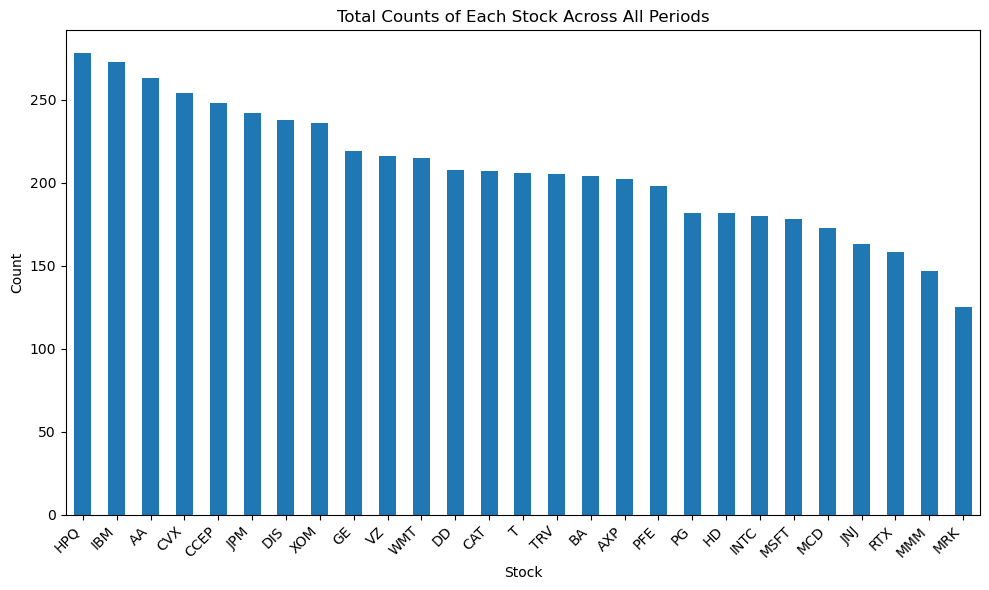

In [175]:
count_of_stocks(result_df_MST,custom_tickers)

In [267]:
def plot_metric(metric_name, result_df_random, result_df_HCT, result_df_kmeans_rand, result_df_MST):
    labels = list(result_df_random.index)
    
    random_values = [result_df_random.loc[label][metric_name] for label in labels]
    HCT_values = [result_df_HCT.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    MST_values = [result_df_MST.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.2  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width * 1.5, random_values, width, label='Random')
    rects2 = ax.bar(x - width * 0.5, HCT_values, width, label='HCT')
    rects3 = ax.bar(x + width * 0.5, kmeans_rand_values, width, label='K-means Random')  # Adjusted position
    rects4 = ax.bar(x + width * 1.5, MST_values, width, label='MST')  # Adjusted position
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of Random Values:", np.mean(random_values))
    print("Total Average " + metric_name + " of Cluster Values:", np.mean(HCT_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print("Total Average " + metric_name + " of MST Values:", np.mean(MST_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of Random Values:", np.mean(random_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of Cluster Values:", np.mean(HCT_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of MST:", np.mean(MST_values[(period_num - 1) * 3:period_num * 3]))

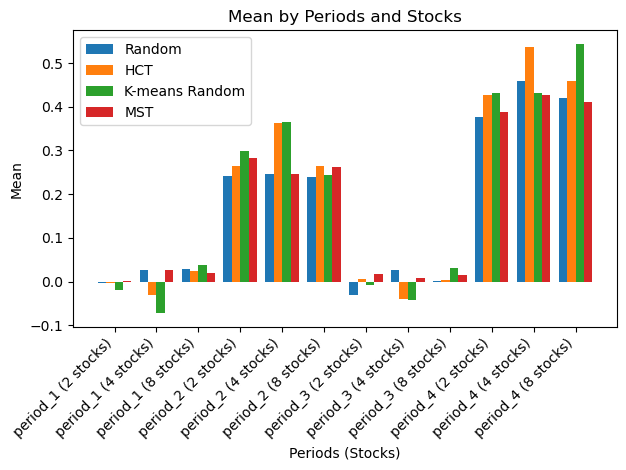

Total Average Mean of Random Values: 0.16927702608085135
Total Average Mean of Cluster Values: 0.1893184706984421
Total Average Mean of K-means Random Values: 0.1867336661334317
Total Average Mean of MST Values: 0.17541676777179693

Period 1 Average Mean of Random Values: 0.017641280337465887
Period 1 Average Mean of Cluster Values: -0.0032325739534077107
Period 1 Average Mean of K-means Random Values: -0.01795014612864771
Period 1 Average Mean of MST: 0.016124230190989918
Period 2 Average Mean of Random Values: 0.2417293914565952
Period 2 Average Mean of Cluster Values: 0.29728649770472443
Period 2 Average Mean of K-means Random Values: 0.30223251592298317
Period 2 Average Mean of MST: 0.26310764157246386
Period 3 Average Mean of Random Values: -0.0011268157739780197
Period 3 Average Mean of Cluster Values: -0.010725809472989858
Period 3 Average Mean of K-means Random Values: -0.006037609892592951
Period 3 Average Mean of MST: 0.013517180297364614


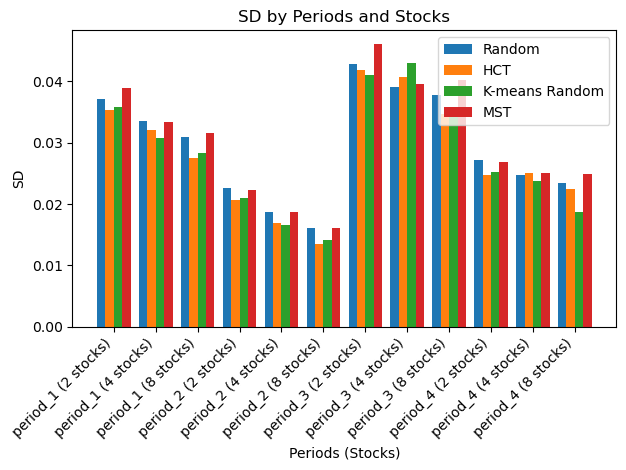

Total Average SD of Random Values: 0.029501343267004876
Total Average SD of Cluster Values: 0.027955291284209562
Total Average SD of K-means Random Values: 0.027782941079724205
Total Average SD of MST Values: 0.030292491009447014

Period 1 Average SD of Random Values: 0.033869828087089576
Period 1 Average SD of Cluster Values: 0.03161036683415365
Period 1 Average SD of K-means Random Values: 0.03163661290273539
Period 1 Average SD of MST: 0.03463850804371426
Period 2 Average SD of Random Values: 0.01913602314289672
Period 2 Average SD of Cluster Values: 0.017086839819164895
Period 2 Average SD of K-means Random Values: 0.017220210844797922
Period 2 Average SD of MST: 0.019017018241842064
Period 3 Average SD of Random Values: 0.039896601570638866
Period 3 Average SD of Cluster Values: 0.03905391682490744
Period 3 Average SD of K-means Random Values: 0.03975427778534607
Period 3 Average SD of MST: 0.04190626313282563


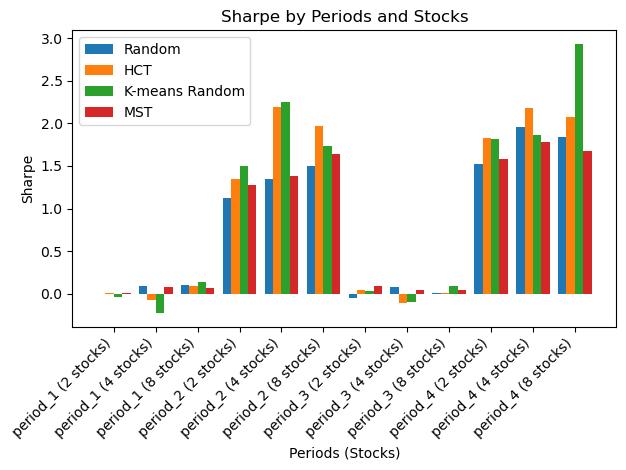

Total Average Sharpe of Random Values: 0.7932702871679506
Total Average Sharpe of Cluster Values: 0.963381301334576
Total Average Sharpe of K-means Random Values: 0.9988364265799574
Total Average Sharpe of MST Values: 0.8064663163064923

Period 1 Average Sharpe of Random Values: 0.06283707962506595
Period 1 Average Sharpe of Cluster Values: 0.00764386557235346
Period 1 Average Sharpe of K-means Random Values: -0.04368419510923766
Period 1 Average Sharpe of MST: 0.0518669681887266
Period 2 Average Sharpe of Random Values: 1.3223506196300756
Period 2 Average Sharpe of Cluster Values: 1.8375059191247274
Period 2 Average Sharpe of K-means Random Values: 1.8262454491513607
Period 2 Average Sharpe of MST: 1.4336713067381612
Period 3 Average Sharpe of Random Values: 0.011529026935590542
Period 3 Average Sharpe of Cluster Values: -0.018603967947405858
Period 3 Average Sharpe of K-means Random Values: 0.00701999367930603
Period 3 Average Sharpe of MST: 0.058554758817105174


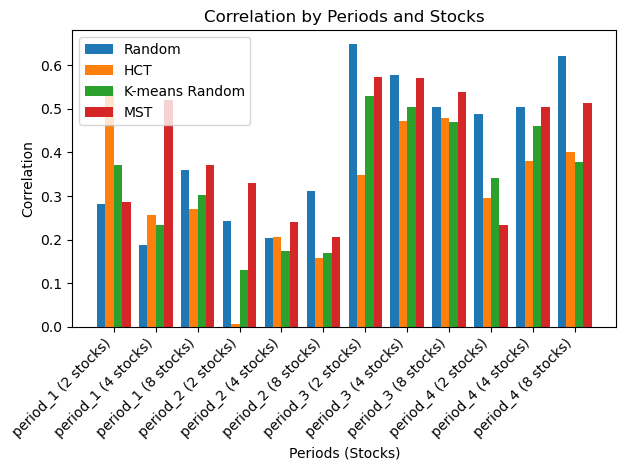

Total Average Correlation of Random Values: 0.41088868305297405
Total Average Correlation of Cluster Values: 0.3182525792761042
Total Average Correlation of K-means Random Values: 0.3388090181117034
Total Average Correlation of MST Values: 0.4073940231353159

Period 1 Average Correlation of Random Values: 0.276814465143637
Period 1 Average Correlation of Cluster Values: 0.35733137486284927
Period 1 Average Correlation of K-means Random Values: 0.3031137521707008
Period 1 Average Correlation of MST: 0.39274934854450433
Period 2 Average Correlation of Random Values: 0.25272174265262504
Period 2 Average Correlation of Cluster Values: 0.12353925164904515
Period 2 Average Correlation of K-means Random Values: 0.15759384886261948
Period 2 Average Correlation of MST: 0.259074335859598
Period 3 Average Correlation of Random Values: 0.5766240054874946
Period 3 Average Correlation of Cluster Values: 0.4330394933865584
Period 3 Average Correlation of K-means Random Values: 0.5002967164731839
Peri

In [268]:
# Plotting Mean
plot_metric('Mean',result_df_random,result_df_HCT,result_df_kmeans_rand,result_df_MST)

# Plotting SD
plot_metric('SD',result_df_random,result_df_HCT,result_df_kmeans_rand,result_df_MST)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random,result_df_HCT,result_df_kmeans_rand,result_df_MST)

# Plotting Correlation
plot_metric('Correlation',result_df_random,result_df_HCT,result_df_kmeans_rand,result_df_MST)

In [37]:
def plot_metric_kmeans(metric_name,result_df_kmeans,result_df_kmeans_rand):
    labels = list(result_df_kmeans.index)
    
    kmeans_values = [result_df_kmeans.loc[label][metric_name] for label in labels]
    kmeans_rand_values = [result_df_kmeans_rand.loc[label][metric_name] for label in labels]
    
    x = np.arange(len(labels))  # Use numpy's arange for better precision
    width = 0.35  # Adjust width for better spacing between bars

    fig, ax = plt.subplots()
    rects3 = ax.bar(x - width/2, kmeans_values, width, label='K-means Centroid')
    rects4 = ax.bar(x + width/2, kmeans_rand_values, width, label='K-means Random')
    
    ax.set_xlabel('Periods (Stocks)')
    ax.set_ylabel(metric_name)
    ax.set_title(f'{metric_name} by Periods and Stocks')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend()

    fig.tight_layout()

    plt.show()

    print("Total Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values))
    print("Total Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values))
    print()
    periods = ["Period 1", "Period 2", "Period 3"]  # Update with your periods
    for period_num, period_label in enumerate(periods, start=1):
        print(period_label + " Average " + metric_name + " of K-means Centroid Values:", np.mean(kmeans_values[(period_num - 1) * 3:period_num * 3]))
        print(period_label + " Average " + metric_name + " of K-means Random Values:", np.mean(kmeans_rand_values[(period_num - 1) * 3:period_num * 3]))

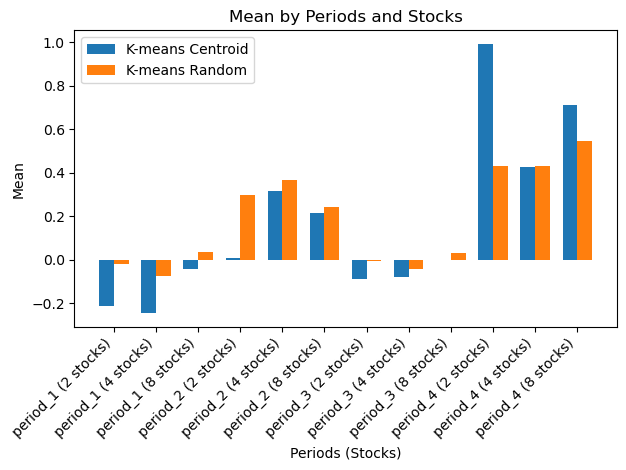

Total Average Mean of K-means Centroid Values: 0.16634418360591702
Total Average Mean of K-means Random Values: 0.1867336661334317

Period 1 Average Mean of K-means Centroid Values: -0.16706388922607085
Period 1 Average Mean of K-means Random Values: -0.01795014612864771
Period 2 Average Mean of K-means Centroid Values: 0.17973617180046078
Period 2 Average Mean of K-means Random Values: 0.30223251592298317
Period 3 Average Mean of K-means Centroid Values: -0.05728251256063255
Period 3 Average Mean of K-means Random Values: -0.006037609892592951


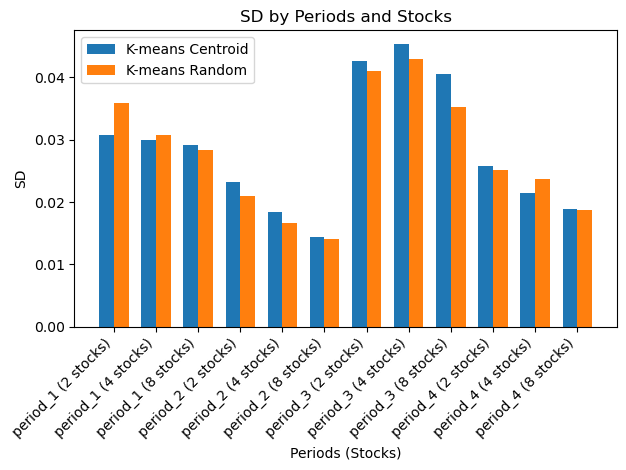

Total Average SD of K-means Centroid Values: 0.028363434811431987
Total Average SD of K-means Random Values: 0.027782941079724205

Period 1 Average SD of K-means Centroid Values: 0.029957216112643386
Period 1 Average SD of K-means Random Values: 0.03163661290273539
Period 2 Average SD of K-means Centroid Values: 0.018629723203041484
Period 2 Average SD of K-means Random Values: 0.017220210844797922
Period 3 Average SD of K-means Centroid Values: 0.042818020510232
Period 3 Average SD of K-means Random Values: 0.03975427778534607


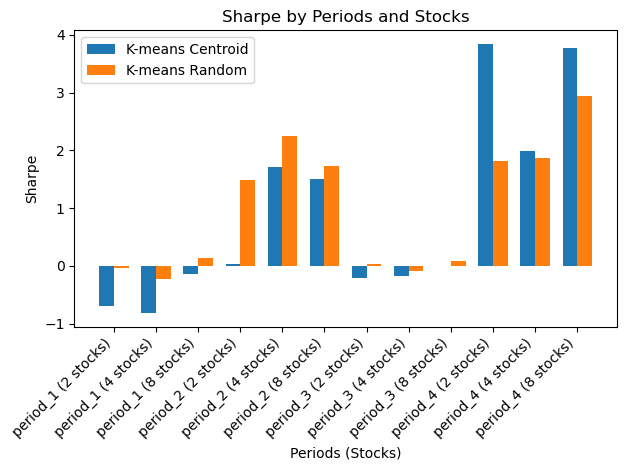

Total Average Sharpe of K-means Centroid Values: 0.9005525090119185
Total Average Sharpe of K-means Random Values: 0.9988364265799574

Period 1 Average Sharpe of K-means Centroid Values: -0.5523303544267423
Period 1 Average Sharpe of K-means Random Values: -0.04368419510923766
Period 2 Average Sharpe of K-means Centroid Values: 1.0865117425940223
Period 2 Average Sharpe of K-means Random Values: 1.8262454491513607
Period 3 Average Sharpe of K-means Centroid Values: -0.13090643458740603
Period 3 Average Sharpe of K-means Random Values: 0.00701999367930603


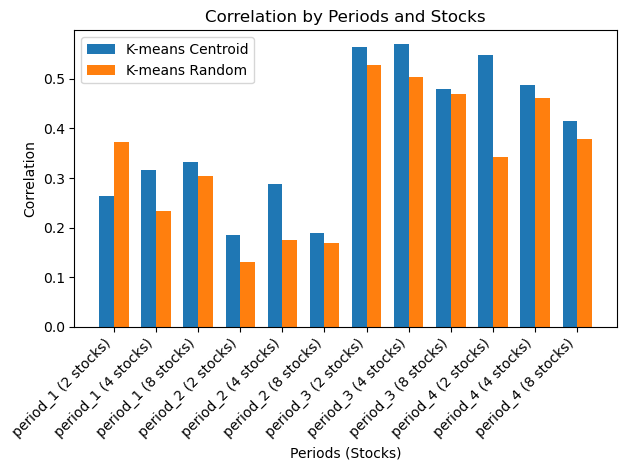

Total Average Correlation of K-means Centroid Values: 0.3864442595090281
Total Average Correlation of K-means Random Values: 0.3388090181117034

Period 1 Average Correlation of K-means Centroid Values: 0.30408620892662597
Period 1 Average Correlation of K-means Random Values: 0.3031137521707008
Period 2 Average Correlation of K-means Centroid Values: 0.2210112792040545
Period 2 Average Correlation of K-means Random Values: 0.15759384886261948
Period 3 Average Correlation of K-means Centroid Values: 0.5376039065254092
Period 3 Average Correlation of K-means Random Values: 0.5002967164731839


In [38]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans,result_df_kmeans_rand)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans,result_df_kmeans_rand)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans,result_df_kmeans_rand)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans,result_df_kmeans_rand)

In [39]:
############# Out of sampling testing: other stocks ##############

In [245]:
custom_tickers_test = [
    "AAPL", "MSFT", "AMZN", "INTC", "ORCL", "CSCO",
    "AMGN", "GILD", "BIIB", "EBAY", 
    "ADBE", "NVDA", "ISRG", "MNST", "ILMN", 
    "ORLY", "MAR", "ROST", "ADI", "ADP", "CTSH", "EA", "FAST", "INCY", "INTU",
    "JBHT", "MAT", "MCHP", "NTAP", "PCAR", "TXN", 
    "SIRI", "VRTX", "LRCX", "KLAC", "CSX", "VOD", "PAYX", 
    "REGN", "SHPG", "SRCL", "TSCO", "VRSN", "WBA", "XRAY"
    #"NFLX", "MDLZ" #IPO during period_1 so omit
]

In [246]:
period_dfs_test, correlation_matrices_test, distance_matrices_test = data_prep(custom_tickers_test, study_periods)

In [247]:
result_df_random_test = calculate_metrics_for_random_selection(period_dfs_test, num_stocks_list)
result_df_random_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.922799,0.059673,1.822706,0.300566,"[EBAY, BIIB, SRCL, ORCL, FAST, ADP, CTSH, CSCO, TXN, SRCL, CTSH, MAR, GILD, NVDA, CTSH, NTAP, FAST, PAYX, ISRG, AAPL, AMZN, SHPG, MSFT, ORCL, AMZN, CSX, MNST, MAT, CSCO, AMZN, TSCO, ROST, NTAP, VRSN, MSFT, PAYX, NTAP, MCHP, AAPL, SHPG, GILD, PCAR, EA, REGN, ADBE, MSFT, MAT, EBAY, SIRI, MNST, ORCL, KLAC, TXN, ROST, INTC, SHPG, INTU, FAST, CSCO, KLAC, AMGN, MAR, MNST, XRAY, BIIB, VRSN, VRTX, ROST, MCHP, XRAY, AMGN, JBHT, WBA, ISRG, MNST, WBA, GILD, MAT, AAPL, NVDA, EBAY, ADI, EBAY, VRSN, REGN, INCY, MCHP, MNST, INTU, MNST, TXN, NTAP, KLAC, CSX, TSCO, AMGN, MCHP, INCY, VRTX, AMGN, ...]"
period_1 (4 stocks),0.762487,0.051845,1.572841,0.383526,"[TSCO, ADP, EA, ADBE, CSCO, TXN, INTC, EA, REGN, GILD, EA, MSFT, INCY, ADI, AMZN, CSX, ROST, TSCO, VRTX, MSFT, MCHP, ADI, EA, SIRI, LRCX, MSFT, SRCL, ORCL, SRCL, VRSN, GILD, NVDA, REGN, ISRG, MNST, AAPL, GILD, AMZN, INTU, INCY, MNST, MAT, INTU, EBAY, ROST, INCY, PAYX, ORCL, EBAY, PCAR, AAPL, REGN, XRAY, VOD, CSCO, INTC, WBA, ROST, ISRG, INTC, MSFT, EA, VOD, ISRG, ISRG, AAPL, INCY, MSFT, ADI, XRAY, VRSN, MCHP, BIIB, PCAR, INCY, MAT, PAYX, ILMN, AMZN, ADP, KLAC, JBHT, ILMN, VRTX, SHPG, ISRG, ORCL, SIRI, INCY, BIIB, CSCO, ISRG, EA, MCHP, GILD, KLAC, SIRI, GILD, ADP, SRCL, ...]"
period_1 (8 stocks),0.719097,0.044920,1.659080,0.235366,"[ADBE, MCHP, VOD, ADP, VRSN, FAST, CSX, GILD, ADBE, GILD, EBAY, ADP, REGN, ORCL, MAT, ILMN, MSFT, ADP, XRAY, ORCL, ROST, KLAC, LRCX, WBA, MAT, ORLY, VOD, CTSH, AMZN, AMGN, TSCO, ROST, GILD, ORCL, AAPL, VRTX, CSCO, MSFT, EA, KLAC, CSX, INTU, EA, VOD, INCY, MNST, TXN, ADBE, MSFT, NTAP, FAST, VOD, EA, LRCX, ADI, KLAC, BIIB, ADBE, JBHT, AAPL, PAYX, VRSN, ISRG, MSFT, TXN, ADBE, INCY, ORCL, MNST, VRSN, ROST, MCHP, AAPL, MSFT, MAT, CSCO, VRSN, AMZN, JBHT, CSX, PCAR, CSCO, NTAP, ADI, CSX, PAYX, BIIB, ORCL, ISRG, VOD, SRCL, CTSH, KLAC, ORCL, AMGN, EA, EBAY, FAST, ADBE, ADP, ...]"
period_2 (2 stocks),1.199917,0.037213,2.584561,0.369747,"[XRAY, PAYX, XRAY, ADI, NTAP, ADBE, SIRI, PAYX, MAR, CSX, FAST, SIRI, FAST, INCY, NTAP, PAYX, MCHP, ORCL, MNST, AAPL, ORLY, SRCL, INTC, MAR, MAR, CSCO, VOD, PCAR, JBHT, ORLY, MAT, REGN, CSCO, ISRG, LRCX, KLAC, CSX, VOD, ROST, CTSH, NTAP, PAYX, VRTX, MNST, TXN, VRTX, ADP, XRAY, MNST, ISRG, AMGN, TSCO, PCAR, NVDA, CSX, MSFT, EBAY, FAST, CSX, TXN, ILMN, MSFT, TSCO, MNST, REGN, CTSH, SHPG, AAPL, NTAP, SRCL, AMZN, NVDA, EA, REGN, AMZN, MCHP, INCY, CSX, NTAP, EBAY, CSCO, MSFT, BIIB, AAPL, GILD, EBAY, PCAR, MAT, VRSN, FAST, NVDA, ORLY, EA, ADP, JBHT, EBAY, ORLY, SIRI, LRCX, REGN, ...]"
period_2 (4 stocks),1.071127,0.031368,3.292480,0.115301,"[ADP, GILD, REGN, VRSN, ORCL, AAPL, ROST, JBHT, BIIB, MNST, PCAR, ADBE, WBA, ORCL, AAPL, NVDA, MAR, EBAY, ROST, WBA, REGN, ORCL, CTSH, ORLY, AAPL, SRCL, TXN, EA, XRAY, PCAR, GILD, JBHT, ILMN, SIRI, ISRG, SHPG, TSCO, FAST, ISRG, ORCL, CTSH, VOD, MAR, REGN, NTAP, INTU, ILMN, CTSH, PCAR, ISRG, ADI, AAPL, MCHP, SIRI, INCY, NVDA, ORCL, INTC, VRSN, MAT, PCAR, AMZN, ISRG, MAR, MCHP, SRCL, JBHT, MNST, ROST, INCY, EA, MSFT, SHPG, KLAC, INTC, AAPL, AAPL, ADBE, TSCO, VRSN, EBAY, SIRI, GILD, MSFT, CSCO, NVDA, WBA, VRSN, AAPL, SIRI, INCY, REGN, VRSN, BIIB, JBHT, PCAR, JBHT, SRCL, CTSH, SHPG, ...]"
period_2 (8 stocks),0.812988,0.027233,2.953079,0.140511,"[ROST, AAPL, GILD, INTU, MCHP, NVDA, AMGN, TSCO, SIRI, ORLY, MCHP, CSX, AAPL, AMGN, BIIB, TXN, SIRI, REGN, GILD, VRTX, VRSN, ORLY, ADP, KLAC, FAST, SRCL, ADI, XRAY, ADP, SHPG, WBA, ISRG, VOD, CTSH, LRCX, REGN, SHPG, EBAY, AAPL, ADI, KLAC, GILD, NTAP, TXN, EBAY, PAYX, FAST, MSFT, NTAP, GILD, EA, TXN, PCAR, AMZN, INTU, ISRG, CSX, CSCO, PCAR, MCHP, AMZN, SIRI, ADBE, CTSH, PAYX, KLAC, TSCO, MAT, SRCL, MSFT, INTU, EBAY, TSCO, MAT, ORLY, WBA, SIRI, TXN, MSFT, NVDA, PAYX, BIIB, AMZN, MCHP, SIRI, TXN, EBAY, MAR, VRTX, INCY, EA, TXN, WBA, TSCO, XRAY, INTU, EA, AMGN, INTC, TXN, ...]"
period_3 (2 stocks),0.214186,0.050114,0.412252,0.479904,"[REGN, NVDA, MAR, LRCX, SIRI, XRAY, VRTX, JBHT, FAST, IN

/var/folders/m7/j4dcn39d2w53ww84yjmrzn2r0000gn/T/ipykernel_63778/3077549457.py:9: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = linkage(distance_matrix, method='ward') #'ward'
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/scipy/cluster/hierarchy.py:446: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  return linkage(y, method='average', metric='euclidean')


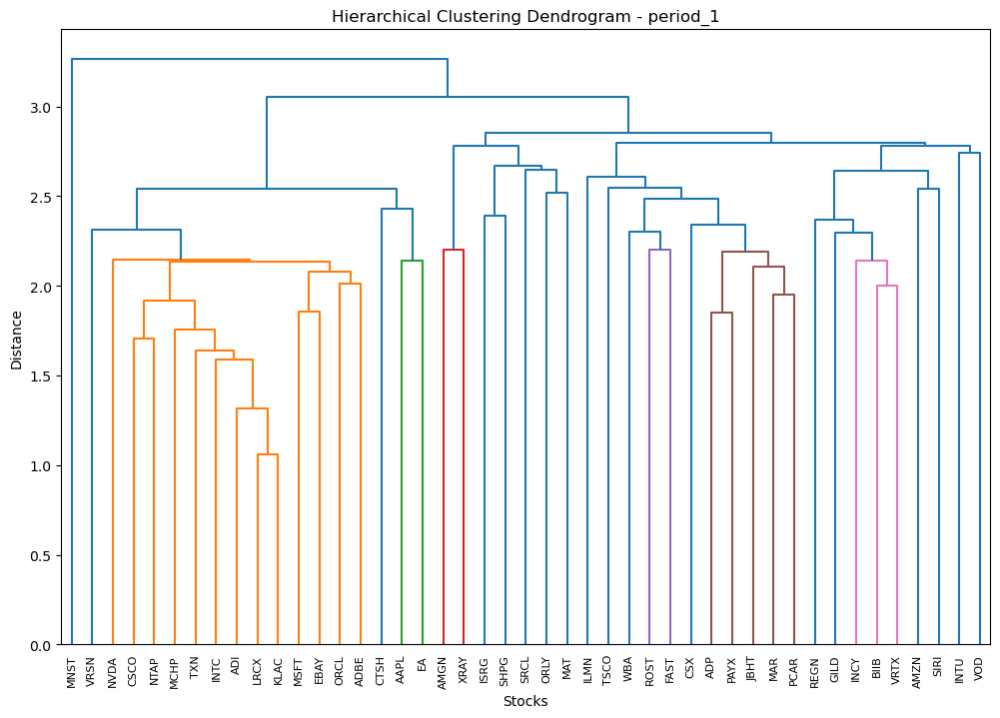

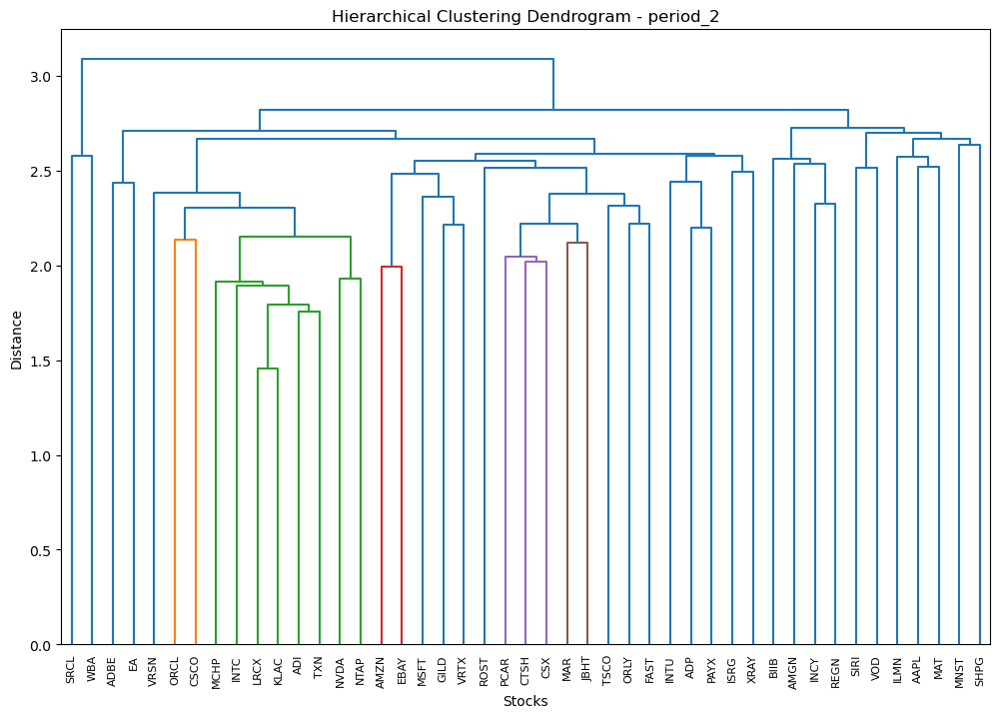

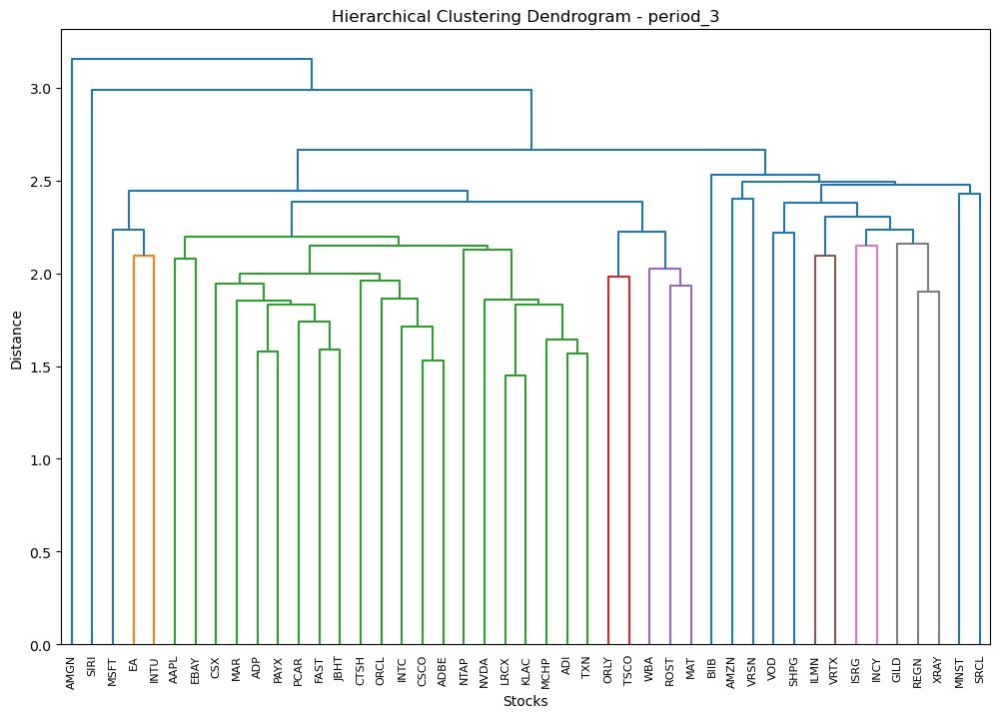

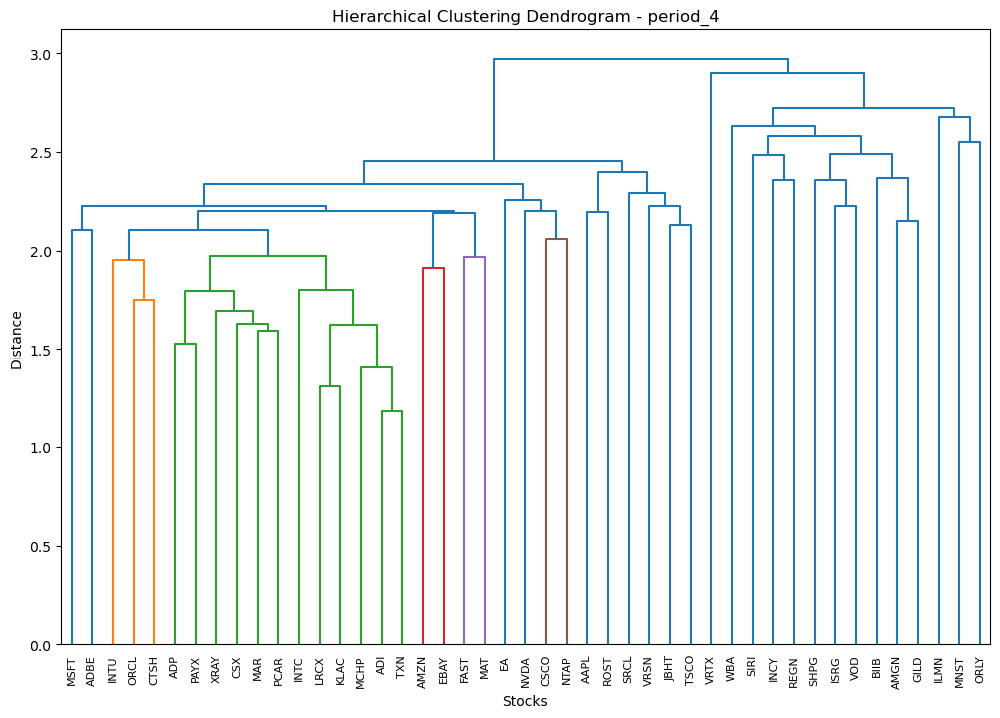

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.693281,0.060131,1.186547,0.359080,"[ISRG, ORCL, ROST, TXN, XRAY, KLAC, REGN, NTAP, AAPL, MSFT, INTU, ADI, AMGN, MSFT, REGN, KLAC, BIIB, EBAY, SHPG, LRCX, ILMN, INTC, EA, LRCX, SRCL, ADI, WBA, TXN, INTU, KLAC, CSX, EBAY, ORLY, MCHP, WBA, LRCX, PAYX, EBAY, TSCO, LRCX, MAR, NVDA, MAR, MSFT, ISRG, MSFT, WBA, MCHP, REGN, ORCL, INCY, VRSN, JBHT, MCHP, AMGN, LRCX, ISRG, NVDA, PAYX, LRCX, ORLY, ADBE, AMZN, ADI, AMZN, INTC, VOD, MCHP, AMZN, ADI, TSCO, ADBE, INCY, MCHP, ORLY, TXN, SIRI, EBAY, BIIB, EBAY, VOD, LRCX, VOD, MSFT, PCAR, TXN, ORLY, CSCO, MAR, EBAY, ORLY, NTAP, INCY, EBAY, TSCO, MCHP, EA, MSFT, GILD, CSCO, ...]"
period_1 (4 stocks),0.672564,0.048296,1.460357,0.271899,"[AAPL, EBAY, MAT, CSX, SIRI, MSFT, ISRG, JBHT, AAPL, INTC, ILMN, JBHT, AMZN, MSFT, ILMN, ADP, AMZN, TXN, MAT, JBHT, INTU, TXN, ILMN, PAYX, REGN, KLAC, SRCL, PCAR, VOD, VRSN, ISRG, PCAR, BIIB, ADBE, AMGN, ADP, REGN, VRSN, ILMN, ADP, CTSH, NVDA, WBA, MAR, INTU, ORCL, MAT, PAYX, INCY, ADBE, WBA, CSX, VOD, INTC, ILMN, ADP, INTU, EBAY, MAT, CSX, VRTX, VRSN, XRAY, PAYX, GILD, CSCO, ILMN, MAR, BIIB, EBAY, MAT, PCAR, AAPL, ADBE, ORLY, MAR, CTSH, NVDA, ILMN, PCAR, BIIB, EBAY, XRAY, PCAR, SIRI, ADI, ROST, PCAR, INCY, EBAY, ORLY, PAYX, GILD, MSFT, TSCO, JBHT, BIIB, ADBE, WBA, PCAR, ...]"
period_1 (8 stocks),0.782624,0.042026,1.889808,0.226930,"[CTSH, NTAP, LRCX, AMGN, INCY, SRCL, TSCO, PCAR, CTSH, VRSN, INTC, XRAY, BIIB, MNST, WBA, JBHT, VOD, VRSN, LRCX, AMGN, REGN, ORLY, FAST, JBHT, CTSH, CSCO, INTC, XRAY, BIIB, ISRG, WBA, MAR, VOD, NVDA, INTC, AMGN, GILD, SHPG, ROST, JBHT, EA, ORCL, TXN, XRAY, VRTX, MNST, ILMN, CSX, CTSH, ADBE, ADI, AMGN, INCY, ORLY, FAST, CSX, VOD, ORCL, LRCX, XRAY, VRTX, ISRG, WBA, PAYX, AMZN, CSCO, ADI, AMGN, REGN, ORLY, TSCO, ADP, SIRI, VRSN, TXN, XRAY, REGN, ORLY, ROST, PCAR, SIRI, NTAP, INTC, XRAY, GILD, ORLY, WBA, MAR, AAPL, ADBE, LRCX, XRAY, VRTX, MNST, FAST, MAR, AMZN, ADBE, TXN, XRAY, ...]"
period_2 (2 stocks),0.755091,0.037039,1.706731,0.348406,"[EA, MCHP, FAST, VRSN, INTU, NVDA, WBA, MCHP, ROST, KLAC, ADBE, INTC, CTSH, NVDA, ORLY, CSCO, ORLY, INTC, INTU, ORCL, EBAY, NVDA, VRTX, VRSN, ORLY, KLAC, ADP, CSCO, ILMN, ORCL, XRAY, TXN, XRAY, VRSN, AAPL, KLAC, INCY, TXN, MAT, ADI, REGN, ADI, ADP, TXN, ORLY, INTC, VRTX, NVDA, SHPG, TXN, PAYX, KLAC, GILD, MCHP, TSCO, NTAP, AMZN, CSCO, INCY, NVDA, ADP, ORCL, AMGN, ADI, PCAR, TXN, XRAY, VRSN, VRTX, NTAP, MSFT, INTC, MNST, KLAC, INTU, TXN, ADBE, MCHP, AMGN, INTC, XRAY, ADI, AAPL, TXN, EA, NTAP, JBHT, VRSN, AAPL, VRSN, VOD, ORCL, SHPG, ADI, ILMN, NTAP, EA, CSCO, SIRI, ADI, ...]"
period_2 (4 stocks),1.033292,0.032276,2.992473,0.215781,"[MAT, AMZN, ORCL, AMGN, WBA, AMZN, TXN, BIIB, SHPG, ORLY, VRSN, GILD, MNST, ISRG, TXN, INCY, MNST, EBAY, ORCL, AMGN, MNST, MAR, INTC, VRTX, WBA, PAYX, ORCL, REGN, SHPG, XRAY, ORCL, INCY, SHPG, INTU, CSCO, AMGN, AAPL, MSFT, LRCX, AMGN, AAPL, ORLY, INTC, REGN, ILMN, ORLY, KLAC, GILD, VOD, XRAY, CSCO, REGN, SIRI, ADBE, INTC, BIIB, SIRI, MSFT, LRCX, GILD, MNST, EBAY, CSCO, GILD, MAT, ORLY, CSCO, INCY, MAT, ADP, KLAC, AMGN, ILMN, CSX, CSCO, GILD, MAT, EBAY, LRCX, VRTX, SRCL, FAST, LRCX, VRTX, MNST, FAST, NTAP, GILD, ILMN, EBAY, LRCX, AMGN, AAPL, EA, CSCO, BIIB, AAPL, EBAY, TXN, BIIB, ...]"
period_2 (8 stocks),0.892791,0.024035,3.626171,0.203714,"[VOD, MSFT, NVDA, INCY, ADBE, ORLY, CSX, SRCL, SIRI, EBAY, VRSN, VRTX, EA, XRAY, MAR, SRCL, AAPL, INTU, ORCL, BIIB, EA, XRAY, JBHT, WBA, ILMN, PAYX, KLAC, VRTX, ADBE, TSCO, JBHT, SRCL, ILMN, EBAY, NVDA, BIIB, EA, ISRG, PCAR, WBA, AAPL, ADP, TXN, REGN, ADBE, ORLY, MAR, WBA, ILMN, MSFT, ORCL, BIIB, EA, TSCO, CSX, WBA, ILMN, ADP, LRCX, BIIB, EA, XRAY, CSX, SRCL, MAT, ADP, INTC, VRTX, ADBE, XRAY, JBHT, WBA, VOD, EBAY, MCHP, BIIB, EA, ISRG, PCAR, WBA, MNST, EBAY, MCHP, INCY, ADBE, ORLY, MAR, WBA, SHPG, ADP, NVDA, AMGN, EA, FAST, JBHT, SRCL, SIRI, INTU, CSCO, VRTX, ...]"
period_3 (2 stocks),0.306059,0.050831,0.576799,0.196227,"[ROST, VRSN, NVDA, INCY, ADI, ISRG, CTSH, MNST, MAR, REGN, NTAP,

In [248]:
all_cluster_stocks_HCT_test = HCT(distance_matrices_test)
result_df_HCT_test = calculate_metrics_for_all_clusters(all_cluster_stocks_HCT_test, period_dfs_test)
result_df_HCT_test

In [249]:
all_cluster_stocks_kmeans_test, centroid_vectors_test = generate_clusters_and_centroids(periods, distance_matrices_test,custom_tickers_test)

/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warnings.warn(
/Users/kellymi/opt/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['tuple']. An error will be raised in 1.2.
  warning

In [250]:
print_kmeans_clusters(all_cluster_stocks_kmeans_test,'period_4')

period_4


Stock
Cluster Label                                                                                                                                                            
2       1                                                      [AMGN, GILD, BIIB, ISRG, MNST, ILMN, ORLY, ROST, INCY, SIRI, VRTX, VOD, REGN, SHPG, SRCL, TSCO, VRSN, WBA]
        2      [AAPL, MSFT, AMZN, INTC, ORCL, CSCO, EBAY, ADBE, NVDA, MAR, ADI, ADP, CTSH, EA, FAST, INTU, JBHT, MAT, MCHP, NTAP, PCAR, TXN, LRCX, KLAC, CSX, PAYX, XRAY]
4       1                                                                                               [AMGN, GILD, MNST, ILMN, ORLY, INCY, SIRI, VRTX, REGN, SHPG, WBA]
        2                                                                          [AAPL, CSCO, BIIB, EBAY, NVDA, ISRG, ROST, EA, FAST, MAT, NTAP, VOD, SRCL, TSCO, VRSN]
        3                                                                                                                              [INTC, ADI, MCHP, TXN, LRCX, KLAC]
        4                                                                                     [MSFT, AMZN, ORCL, ADBE, MAR, ADP, CTSH, INTU, JBHT, PCAR, CSX, PAYX, XRAY]
8       1                                                                                [MSFT, AMZN, ORCL, MAR, ADP, CTSH, FAST, INTU, JBHT, MAT, PCAR, CSX, PAYX, XRAY]
        2                                                                                                                                               [SIRI, SHPG, WBA]
        3                                                                                                                              [INTC, ADI, MCHP, TXN, LRCX, KLAC]
        4                                                                                                                   [CSCO, EBAY, ADBE, NVDA, EA, NTAP, VOD, VRSN]
        5                                                                                                                                  [AAPL, ISRG, ROST, SRCL, TSCO]
        6                                                                                                                                              [AMGN, GILD, BIIB]
        7                                                                                                                                                    [ILMN, ORLY]
        8                                                                                                                                        [MNST, INCY, VRTX, REGN]

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


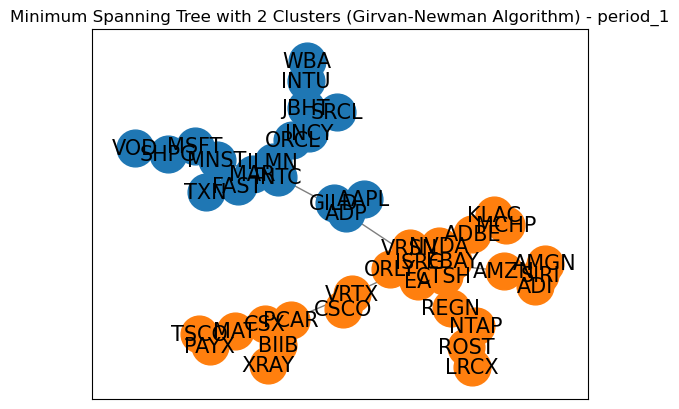

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

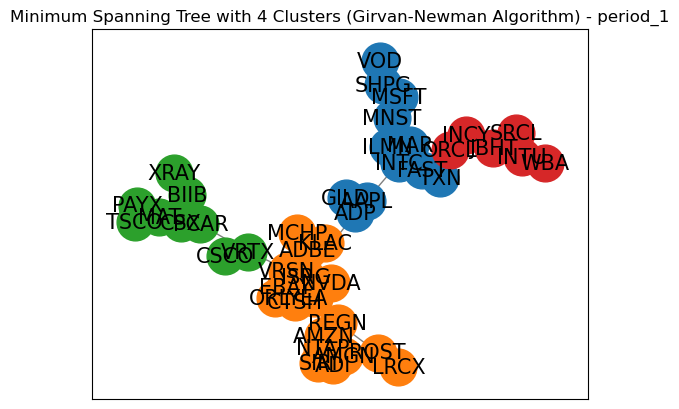

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

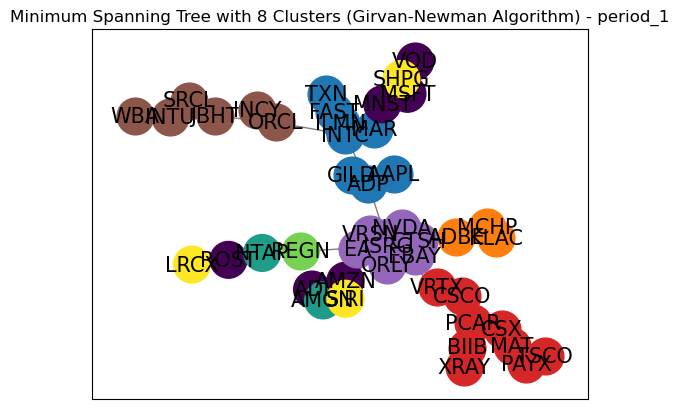

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


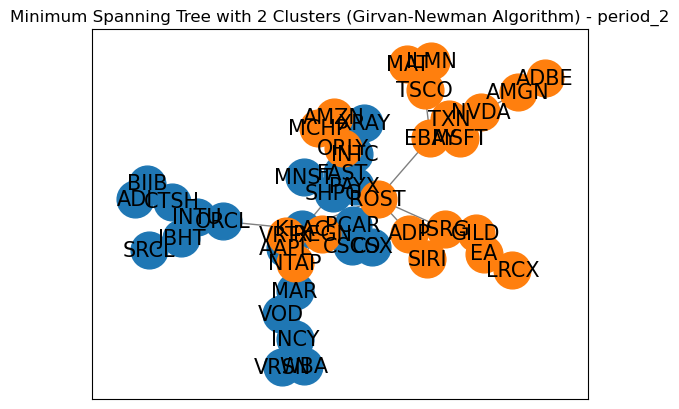

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

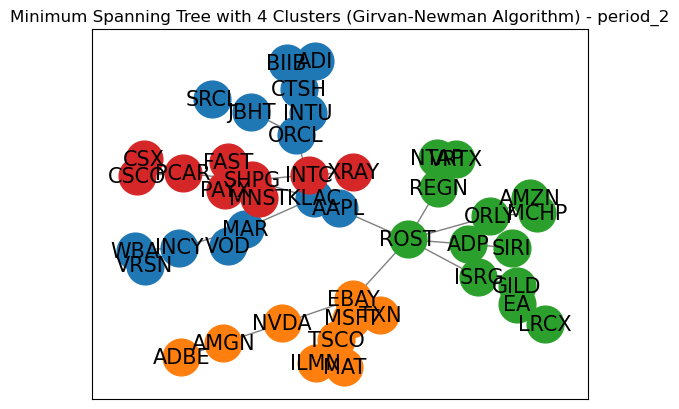

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

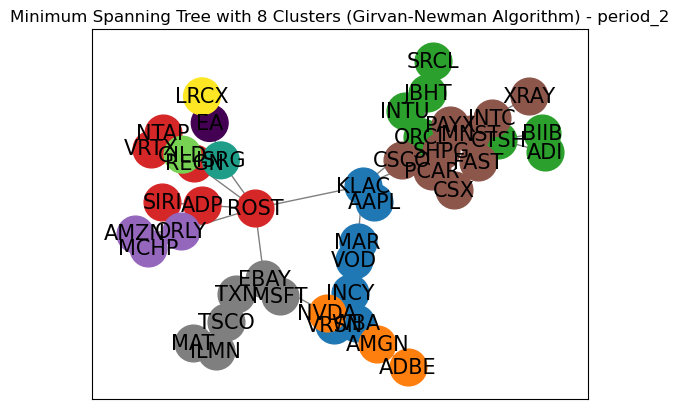

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


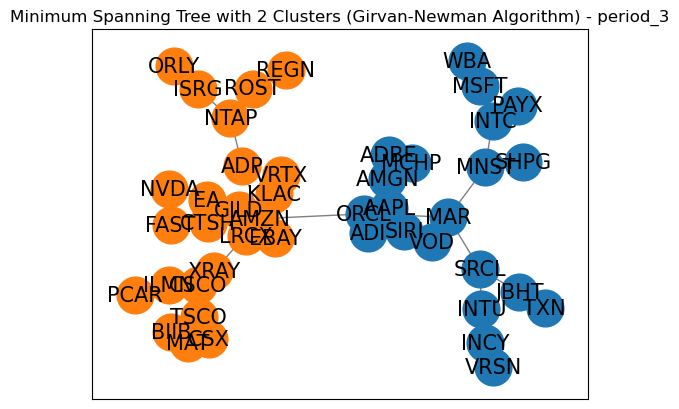

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

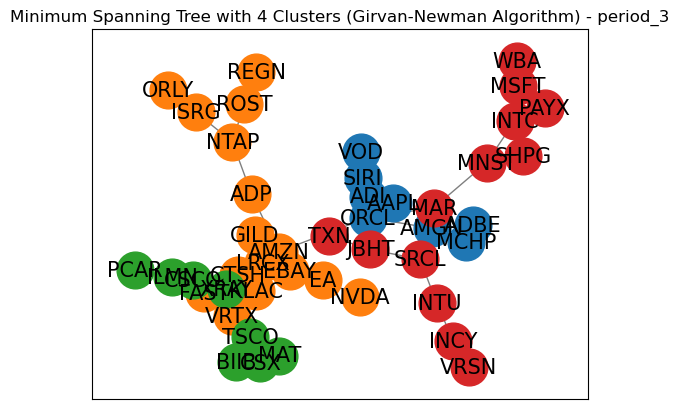

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

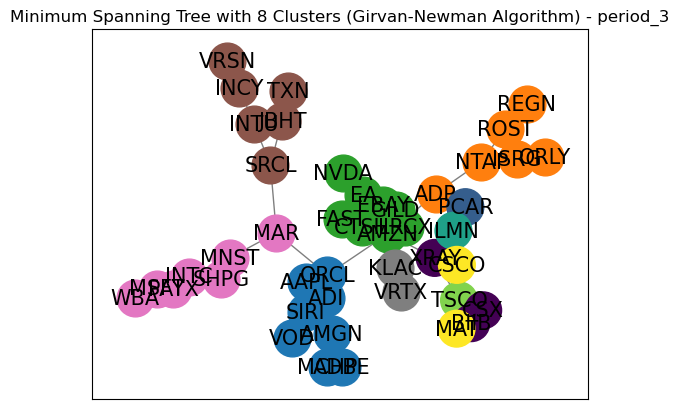

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.


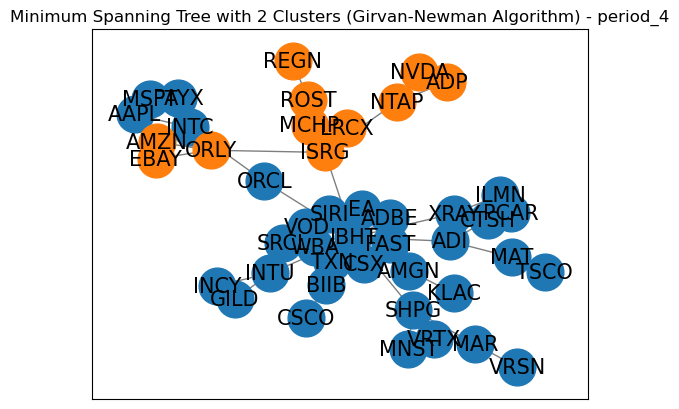

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

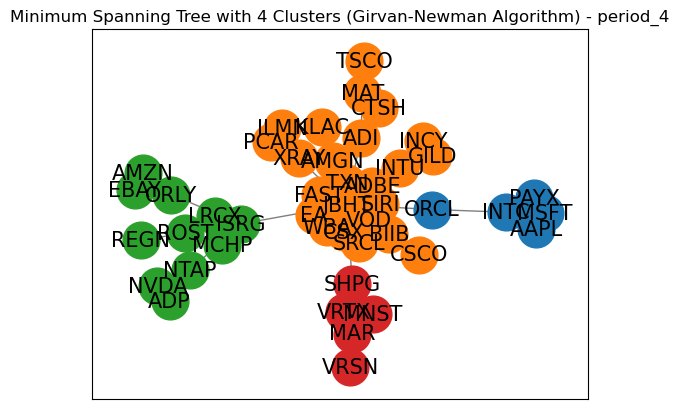

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

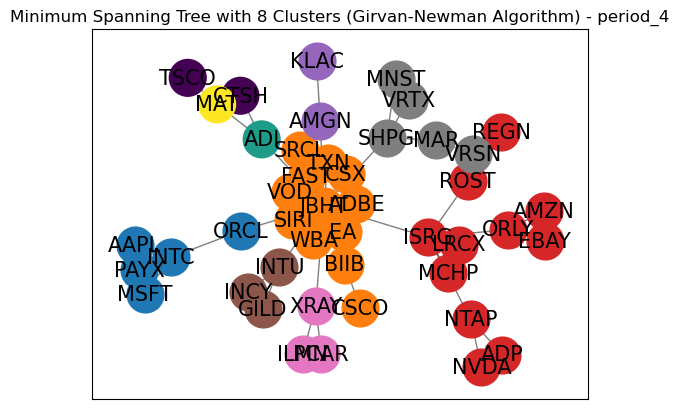

In [253]:
all_cluster_stocks_MST_test = MST(distance_matrices_test, custom_tickers_test)

In [254]:
result_df_MST_test = calculate_metrics_for_all_clusters(all_cluster_stocks_MST_test, period_dfs_test)
result_df_MST_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.452256,0.060080,0.978606,0.358765,"[MAR, ROST, ADP, REGN, FAST, VRSN, INCY, VRTX, SRCL, TSCO, ADP, NVDA, INTC, CSCO, SRCL, VRSN, SRCL, XRAY, MSFT, PAYX, INTC, ADI, FAST, KLAC, MAR, CSX, MSFT, XRAY, INTC, TSCO, WBA, VRSN, VOD, NVDA, VOD, MAT, WBA, PCAR, JBHT, NTAP, WBA, ROST, VOD, ISRG, INTC, MCHP, ILMN, NVDA, MSFT, PAYX, SHPG, ADBE, AAPL, ADI, ORCL, NTAP, AAPL, SIRI, SHPG, ISRG, TXN, NTAP, SHPG, EBAY, ORCL, VRTX, TXN, SIRI, FAST, EA, MAR, SIRI, MNST, VRSN, TXN, VRTX, AAPL, VRSN, MAR, ADI, INTU, PCAR, ILMN, MCHP, GILD, ADBE, MAR, BIIB, INCY, ISRG, MNST, VRTX, AAPL, BIIB, AAPL, PAYX, GILD, ADI, MNST, ADBE, ...]"
period_1 (4 stocks),0.673013,0.050903,1.472010,0.310590,"[MAR, LRCX, PAYX, INCY, SHPG, NTAP, PAYX, SRCL, MNST, LRCX, PAYX, WBA, ILMN, NTAP, PCAR, INCY, GILD, EBAY, PAYX, SRCL, AAPL, ADBE, CSX, INTU, ADP, AMZN, BIIB, SRCL, MNST, EA, XRAY, INTU, MNST, EA, CSCO, INTU, SHPG, ADI, TSCO, SRCL, TXN, SIRI, PCAR, WBA, SHPG, ADI, CSCO, WBA, MNST, SIRI, VRTX, INTU, TXN, EA, PCAR, SRCL, ILMN, ROST, XRAY, WBA, AAPL, AMGN, MAT, ORCL, MNST, SIRI, PCAR, ORCL, GILD, VRSN, PCAR, JBHT, SHPG, AMGN, BIIB, ORCL, ILMN, NVDA, XRAY, ORCL, GILD, ADBE, MAT, WBA, FAST, SIRI, CSX, INTU, INTC, ISRG, PCAR, SRCL, FAST, LRCX, BIIB, JBHT, GILD, SIRI, TSCO, JBHT, ...]"
period_1 (8 stocks),0.622155,0.048897,1.333682,0.283840,"[TXN, ADBE, SIRI, MAT, CTSH, JBHT, LRCX, MNST, TXN, ADBE, ADI, PAYX, ISRG, INTU, NTAP, SHPG, ILMN, ADBE, SIRI, MAT, VRSN, INCY, NTAP, VOD, MAR, MCHP, AMZN, MAT, NVDA, JBHT, LRCX, MNST, GILD, MCHP, ADI, VRTX, ORLY, ORCL, REGN, MSFT, FAST, ADBE, ADI, CSCO, ORLY, WBA, NTAP, SHPG, MAR, KLAC, SIRI, VRTX, EA, ORCL, ROST, MSFT, TXN, KLAC, SIRI, CSCO, VRSN, JBHT, REGN, MNST, ILMN, KLAC, SIRI, CSCO, ORLY, INTU, LRCX, VOD, AAPL, KLAC, ADI, MAT, CTSH, INTU, LRCX, MSFT, AAPL, ADBE, AMZN, VRTX, EBAY, JBHT, LRCX, MSFT, TXN, MCHP, SIRI, PAYX, EBAY, ORCL, ROST, SHPG, AAPL, KLAC, ADI, CSX, ...]"
period_2 (2 stocks),0.805487,0.037631,1.980672,0.425908,"[VOD, NTAP, VRSN, MAT, ORCL, TSCO, BIIB, ISRG, INTC, MSFT, CSCO, GILD, AAPL, MAT, ADI, MAT, PAYX, EA, AAPL, AMZN, MNST, AMZN, INCY, NVDA, CTSH, AMGN, ADI, MSFT, MNST, TXN, FAST, AMZN, WBA, GILD, FAST, ROST, CSCO, REGN, SRCL, TXN, INTC, ISRG, SHPG, LRCX, MAR, GILD, INTU, AMGN, KLAC, TSCO, VRSN, NVDA, INCY, ISRG, CSCO, AMGN, INTC, ROST, CTSH, AMZN, INCY, EBAY, XRAY, TXN, INTC, ISRG, INTC, REGN, WBA, REGN, ORCL, ILMN, ORCL, LRCX, MAR, ORLY, INCY, ADBE, CTSH, EBAY, JBHT, AMZN, FAST, MCHP, VOD, EBAY, SHPG, ADBE, MAR, NVDA, INTU, MAT, AAPL, AMGN, KLAC, AMGN, KLAC, ISRG, INCY, AMZN, ...]"
period_2 (4 stocks),0.983024,0.030669,2.912667,0.305133,"[JBHT, ILMN, VRTX, XRAY, BIIB, TSCO, ROST, PCAR, AAPL, MAT, ORLY, FAST, BIIB, NVDA, GILD, PAYX, JBHT, AMGN, LRCX, PAYX, AAPL, TSCO, REGN, CSCO, BIIB, ADBE, SIRI, SHPG, VOD, NVDA, REGN, PAYX, SRCL, ILMN, EA, CSX, INTU, ADBE, AMZN, MNST, MAR, EBAY, ROST, CSX, AAPL, EBAY, LRCX, INTC, ADI, ILMN, EA, PCAR, CTSH, ILMN, SIRI, FAST, AAPL, NVDA, VRTX, MNST, ORCL, ILMN, GILD, FAST, SRCL, TSCO, NTAP, FAST, WBA, MSFT, REGN, CSX, VRSN, MAT, ADP, PCAR, VRSN, MSFT, ADP, FAST, SRCL, NVDA, EA, INTC, SRCL, TSCO, SIRI, PAYX, SRCL, EBAY, LRCX, MNST, MAR, ADBE, MCHP, CSX, MAR, NVDA, ADP, CSX, ...]"
period_2 (8 stocks),0.828123,0.027412,2.985355,0.217707,"[INCY, ADBE, SRCL, VRTX, MCHP, CSX, LRCX, MSFT, VOD, AMGN, BIIB, ROST, ORLY, PAYX, LRCX, TXN, WBA, NVDA, ORCL, REGN, MCHP, CSCO, EA, MAT, WBA, NVDA, JBHT, NTAP, AMZN, CSX, LRCX, MAT, VRSN, AMGN, ADI, VRTX, MCHP, XRAY, ISRG, EBAY, WBA, AMGN, INTU, ADP, AMZN, XRAY, LRCX, MSFT, VRSN, AMGN, CTSH, VRTX, MCHP, CSCO, LRCX, MAT, MAR, NVDA, JBHT, VRTX, MCHP, MNST, ISRG, TXN, AAPL, NVDA, INTU, VRTX, ORLY, PAYX, EA, TSCO, KLAC, ADBE, SRCL, VRTX, AMZN, MNST, ISRG, TSCO, VRSN, ADBE, ADI, ROST, AMZN, PAYX, GILD, TXN, WBA, AMGN, JBHT, ADP, AMZN, CSCO, LRCX, MSFT, MAR, NVDA, ORCL, SIRI, ...]"
period_3 (2 stocks),0.179090,0.048950,0.355746,0.373193,"[INTU, EBAY, MCHP, ADP, PAYX, GILD, INTC, GILD, MCHP,

In [46]:
result_df_kmeans_rand_test = calculate_metrics_for_all_clusters(all_cluster_stocks_kmeans_test, period_dfs_test)
result_df_kmeans_rand_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.781012,0.061142,1.450384,0.401869,"[SHPG, ADI, ORLY, CSCO, MNST, NTAP, CTSH, NTAP, ADP, EBAY, AMGN, ADBE, SRCL, ADI, VOD, KLAC, JBHT, ORCL, VRTX, NVDA, REGN, ORCL, MAT, MCHP, INCY, TXN, SHPG, TSCO, SHPG, AAPL, SHPG, AAPL, VRSN, MSFT, CTSH, TSCO, MAT, MSFT, PAYX, ADI, REGN, KLAC, REGN, EBAY, FAST, LRCX, SRCL, MCHP, SRCL, LRCX, EA, AAPL, VRTX, ORCL, SHPG, MSFT, WBA, TXN, MAR, MCHP, ISRG, LRCX, SRCL, MSFT, EA, TSCO, MAT, NTAP, ROST, INTC, ADP, ADI, VRSN, ADBE, ADP, TSCO, FAST, CSCO, SHPG, NVDA, PCAR, LRCX, VOD, ORCL, PAYX, ORCL, VRTX, MCHP, WBA, KLAC, MNST, TSCO, GILD, NTAP, SIRI, ORCL, GILD, AAPL, ILMN, TXN, ...]"
period_1 (4 stocks),0.630905,0.050023,1.357023,0.219253,"[EBAY, ROST, GILD, SHPG, ADI, VRSN, EA, MNST, EBAY, PAYX, INTU, SHPG, NTAP, JBHT, GILD, AMGN, TXN, ILMN, INCY, WBA, INTC, CSX, CTSH, REGN, NVDA, PCAR, INTU, REGN, CSCO, ADP, CTSH, ORLY, TXN, CSX, AAPL, ISRG, NTAP, PAYX, SRCL, SHPG, MSFT, ADP, EA, MNST, ADI, ILMN, INTU, SHPG, LRCX, PCAR, CTSH, ORLY, CSCO, JBHT, SRCL, WBA, KLAC, CSX, INTU, ORLY, NVDA, VRSN, BIIB, MNST, ADBE, JBHT, GILD, AMGN, LRCX, MAR, VOD, REGN, TSCO, PCAR, VOD, SHPG, MCHP, FAST, BIIB, ISRG, MSFT, JBHT, AAPL, MAT, ORCL, JBHT, BIIB, ORLY, EBAY, MAR, EA, REGN, NTAP, CSX, SRCL, REGN, NTAP, MAR, INTU, ISRG, ...]"
period_1 (8 stocks),0.598652,0.043286,1.439711,0.253587,"[EA, TXN, ROST, INCY, SHPG, PAYX, MNST, EBAY, VOD, KLAC, VRSN, VRTX, ORLY, MAR, ISRG, ADBE, INTU, MCHP, WBA, VRTX, CSX, MAR, ISRG, CSCO, EA, MCHP, WBA, REGN, CSX, ILMN, MNST, CSCO, INTU, MCHP, VRSN, REGN, SHPG, FAST, MNST, AMZN, EA, INTC, WBA, REGN, SHPG, PCAR, ISRG, ORCL, EA, MCHP, WBA, BIIB, ORLY, JBHT, MNST, TSCO, INTU, ADI, ROST, REGN, CSX, PCAR, REGN, CTSH, AAPL, INTC, AMGN, BIIB, ORLY, PAYX, REGN, ORCL, EA, LRCX, ROST, VRTX, CSX, FAST, REGN, CTSH, EA, LRCX, AMGN, SIRI, ORLY, ADP, MNST, NVDA, AAPL, INTC, VRSN, REGN, MAT, FAST, MNST, ADBE, EA, MCHP, SRCL, VRTX, ...]"
period_2 (2 stocks),0.766987,0.037749,1.853321,0.383979,"[NTAP, BIIB, CSX, ISRG, PCAR, MNST, TXN, SHPG, CSCO, PAYX, LRCX, EBAY, INTC, INCY, TXN, EA, MCHP, REGN, CSX, SRCL, ORCL, VOD, NVDA, MSFT, CSCO, MAR, LRCX, BIIB, MCHP, ORLY, MCHP, ISRG, ORCL, ORLY, ORCL, VRSN, TSCO, ROST, KLAC, SRCL, CTSH, PAYX, ADI, ILMN, ORCL, ISRG, NTAP, MNST, TXN, AMGN, NTAP, ROST, TSCO, ROST, CSCO, MAR, NTAP, ROST, NVDA, WBA, CSX, SRCL, MCHP, AAPL, NVDA, MAT, KLAC, INTU, NVDA, REGN, CTSH, FAST, TSCO, GILD, LRCX, REGN, CTSH, ADP, ADI, SHPG, ORCL, REGN, PCAR, VRSN, CSX, ISRG, CTSH, REGN, NTAP, EBAY, KLAC, GILD, PCAR, INCY, ORCL, EBAY, NVDA, SIRI, ORCL, AMZN, ...]"
period_2 (4 stocks),0.908690,0.032128,2.738671,0.222971,"[INCY, NTAP, JBHT, MNST, AAPL, INTC, ORLY, VRSN, BIIB, LRCX, PAYX, ISRG, MSFT, CSCO, PCAR, VRSN, MAT, NVDA, SRCL, VRSN, ILMN, LRCX, CSX, VOD, BIIB, NTAP, MAR, VRSN, REGN, MCHP, CTSH, VOD, VRTX, ADI, EBAY, SHPG, INCY, INTC, SRCL, VOD, GILD, LRCX, FAST, SHPG, INTU, INTC, CTSH, VOD, INTU, NVDA, CTSH, VRSN, WBA, KLAC, PCAR, VRSN, VRTX, MCHP, TSCO, VOD, AMGN, ADI, MAR, VOD, EA, LRCX, ROST, VRSN, SIRI, MCHP, MAR, VRSN, AMZN, LRCX, FAST, REGN, GILD, NTAP, CSX, MNST, INCY, KLAC, TSCO, MNST, AAPL, KLAC, PCAR, VRSN, MSFT, MCHP, TSCO, VOD, GILD, INTC, CSX, ISRG, MSFT, KLAC, MAR, ISRG, ...]"
period_2 (8 stocks),0.936892,0.028095,3.274599,0.166451,"[BIIB, CSCO, MSFT, MAT, SRCL, LRCX, MNST, CSX, AMGN, CSCO, EBAY, AAPL, ISRG, KLAC, VRSN, ADP, AMGN, NTAP, PAYX, ILMN, ISRG, LRCX, VOD, MAR, INCY, CSCO, AMZN, AAPL, ROST, TXN, SHPG, WBA, AMGN, ORCL, EA, AAPL, SRCL, TSCO, VOD, GILD, AMGN, INTU, AMZN, MAT, ROST, INTC, VOD, PCAR, INCY, NTAP, PAYX, AAPL, SRCL, TXN, MNST, GILD, AMGN, NTAP, VRTX, MAT, ORLY, MCHP, VRSN, CTSH, INCY, NTAP, VRTX, AAPL, ORLY, KLAC, SHPG, MAR, INCY, INTU, AMZN, AAPL, ISRG, KLAC, REGN, CTSH, INCY, CSCO, AMZN, MAT, ORLY, TSCO, SHPG, ADP, INCY, ORCL, SIRI, MAT, REGN, KLAC, MNST, MAR, AMGN, CSCO, PAYX, ILMN, ...]"
period_3 (2 stocks),0.193508,0.051468,0.387968,0.414143,"[REGN, PCAR, EA, PCAR, ORLY, TXN, SRCL, JBHT, SIRI, CTS

In [47]:
result_df_kmeans_test, stocks_by_period_kmeans_test = calculate_metrics_for_kmeans(all_cluster_stocks_kmeans_test, period_dfs_test, centroid_vectors_test,distance_matrices_test)
result_df_kmeans_test

,Mean,SD,Sharpe,Correlation,Stocks
period_1 (2 stocks),0.215358,0.081922,0.262882,0.300087,"[ILMN, MSFT]"
period_1 (4 stocks),0.463037,0.048472,0.955261,0.295580,"[MSFT, JBHT, INCY, ORLY]"
period_1 (8 stocks),1.080974,0.043665,2.475615,0.258011,"[INTU, INTC, ROST, INCY, ORLY, JBHT, ISRG, CTSH]"
period_2 (2 stocks),0.461856,0.024392,1.893503,0.429638,"[PCAR, ADP]"
period_2 (4 stocks),0.615460,0.030105,2.044378,0.239863,"[MAT, NVDA, FAST, VOD]"
period_2 (8 stocks),0.433616,0.032107,1.350535,0.251786,"[INCY, NVDA, MSFT, MAT, REGN, TSCO, VOD, FAST]"
period_3 (2 stocks),0.616200,0.053408,1.153767,0.453722,"[ILMN, ROST]"
period_3 (4 stocks),0.168136,0.039094,0.430084,0.416709,"[EBAY, ILMN, ADP, INTU]"
period_3 (8 stocks),0.322131,0.049042,0.656849,0.351292,"[EBAY, VRTX, NVDA, INTU, REGN, ISRG, SIRI, ROST]"
period_4 (2 stocks),0.863361,0.031137,2.772755,0.354952,"[SHPG, AMZN]"


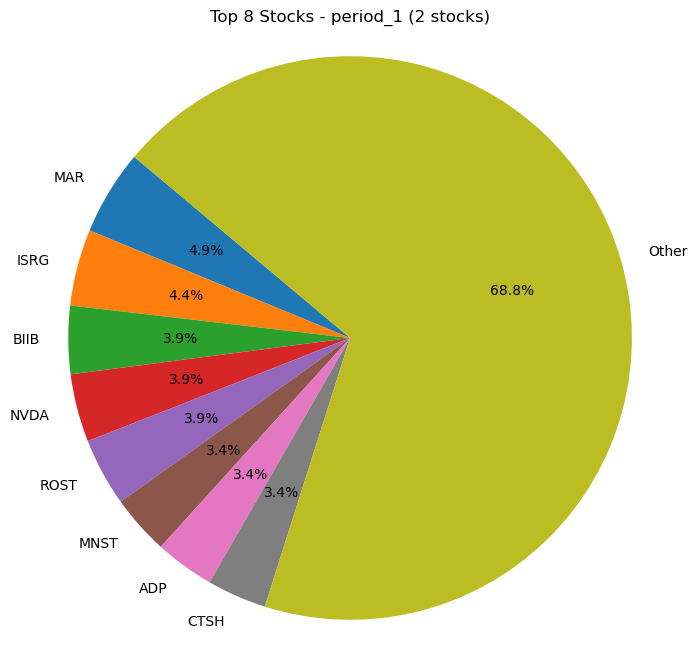

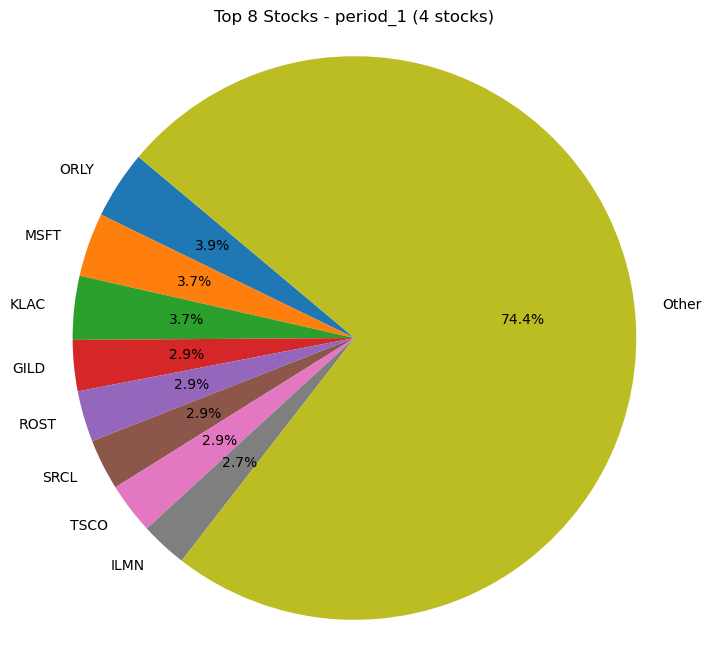

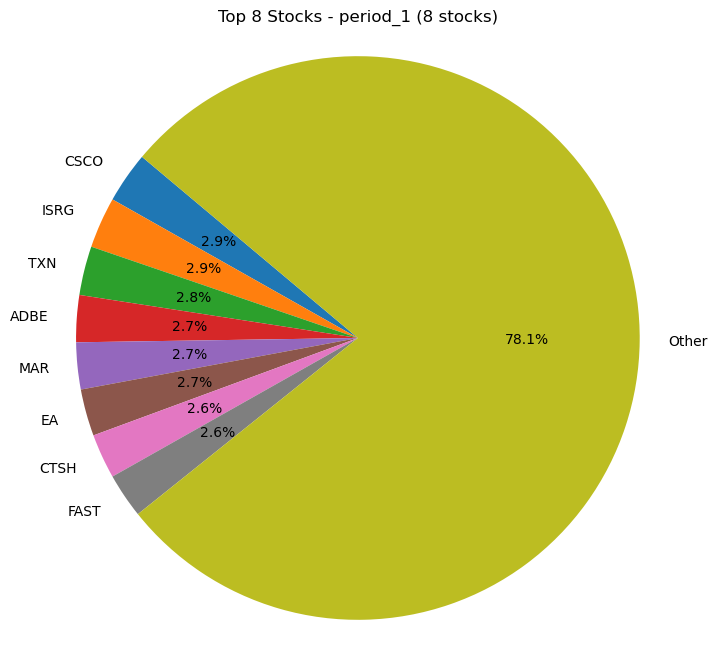

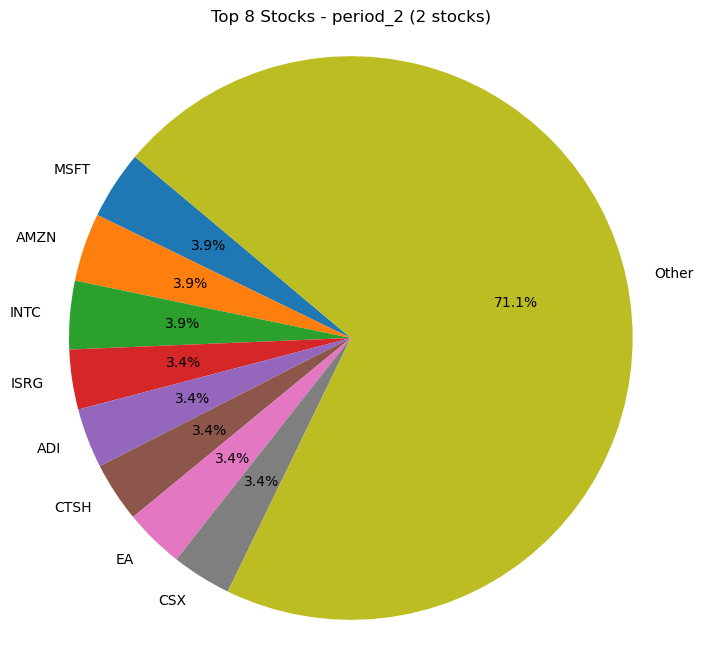

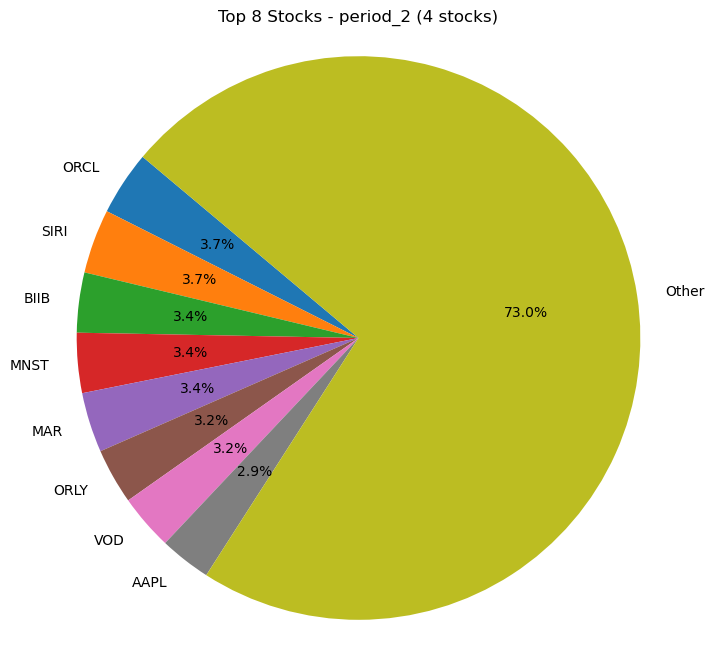

...

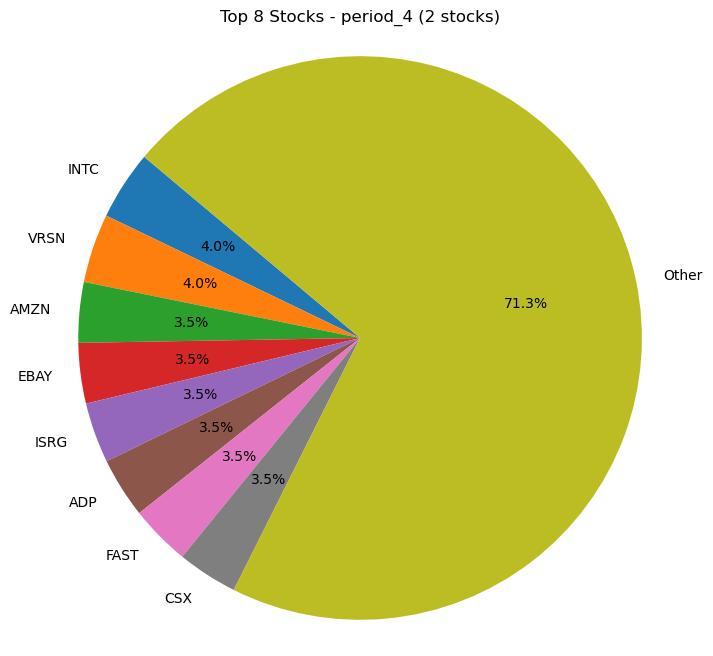

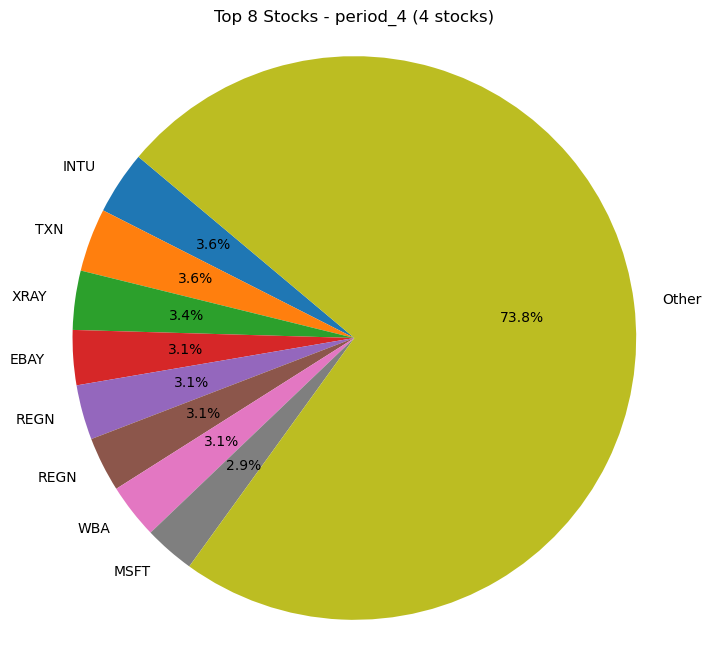

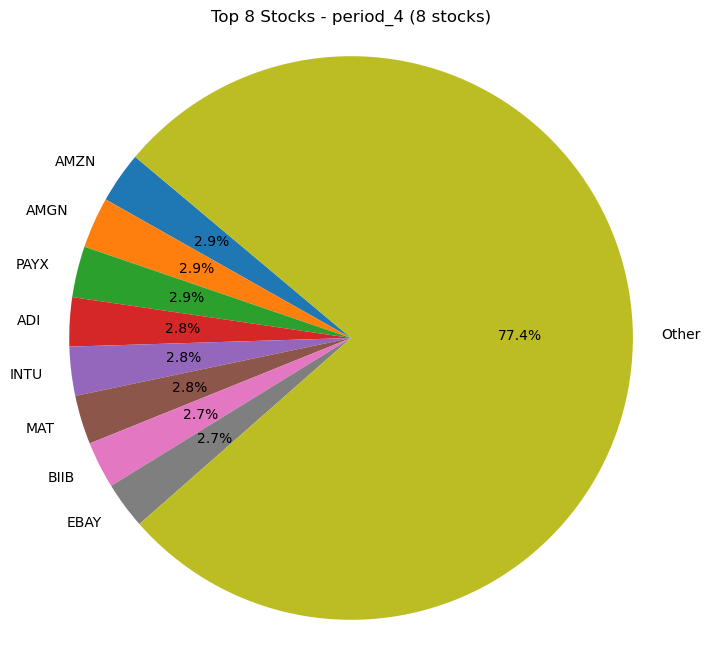

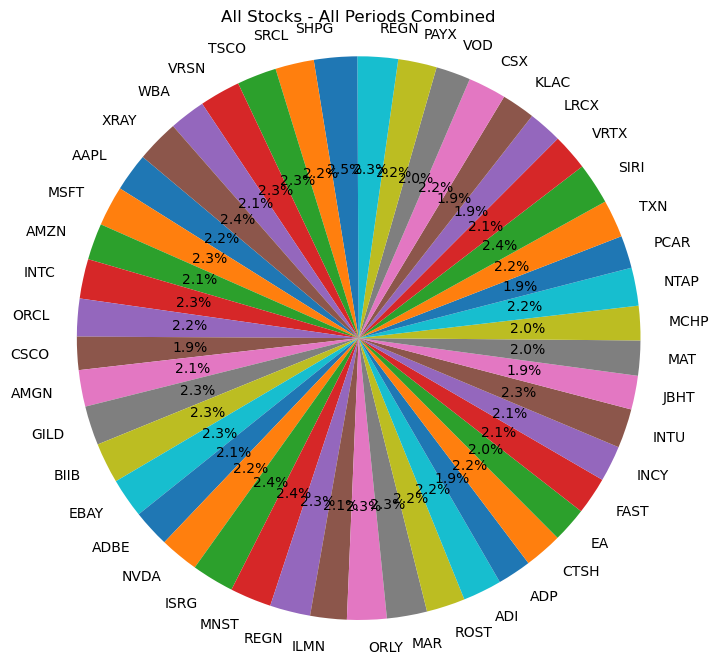

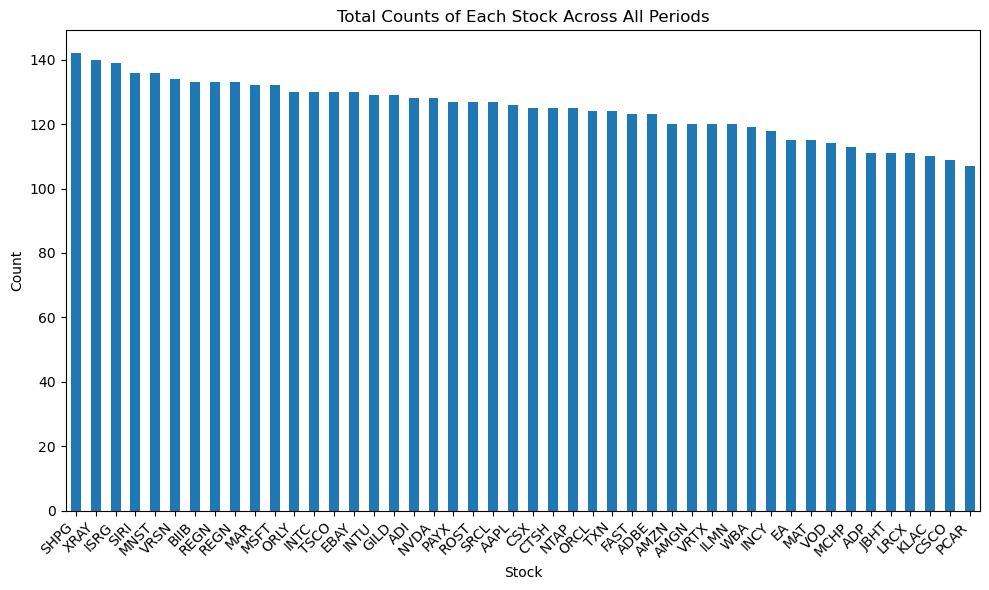

In [48]:
count_of_stocks(result_df_random_test,custom_tickers_test)

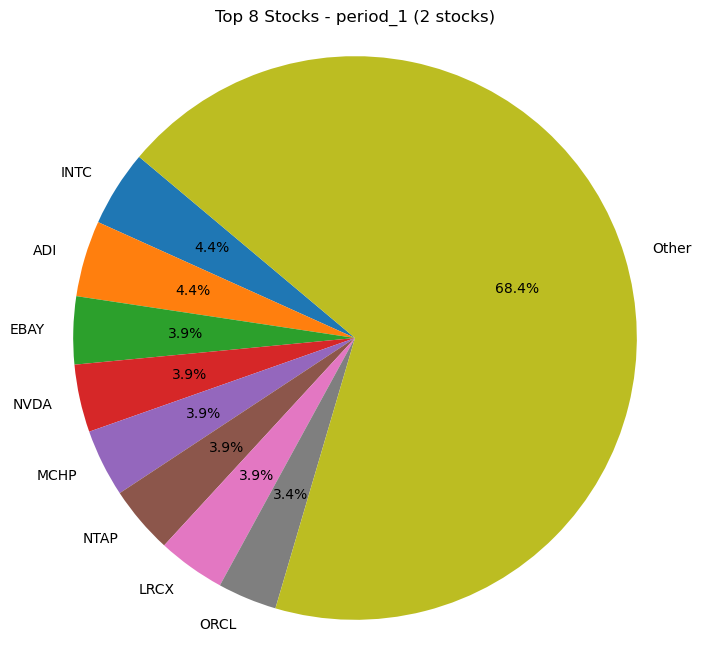

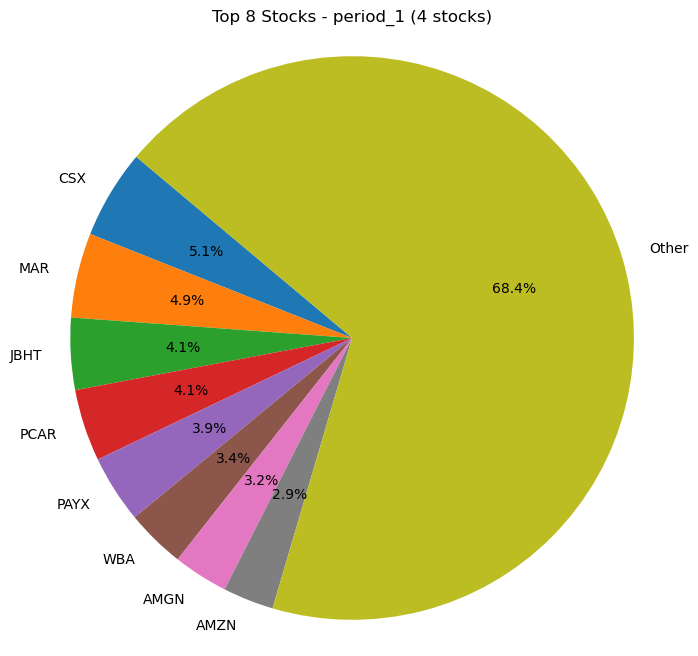

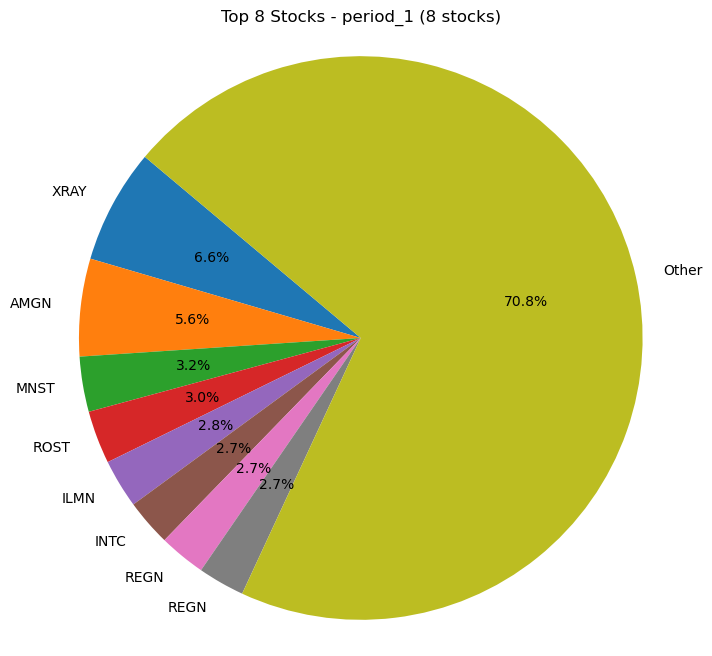

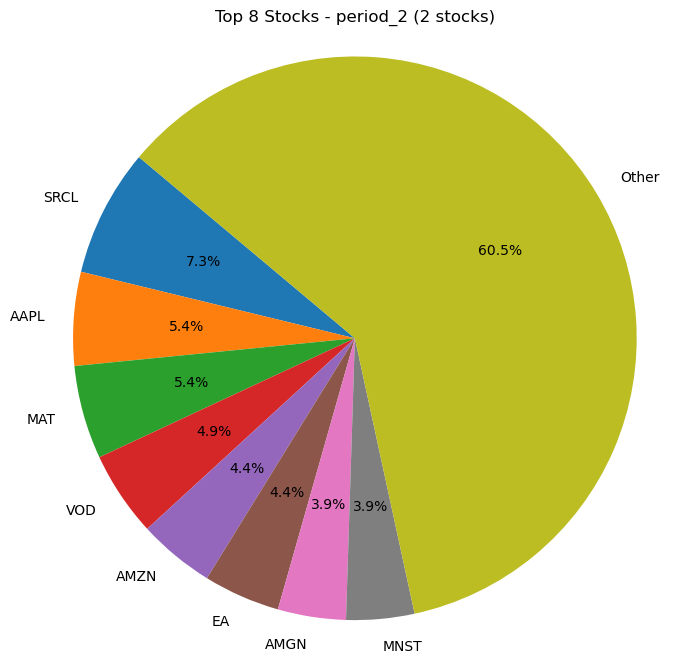

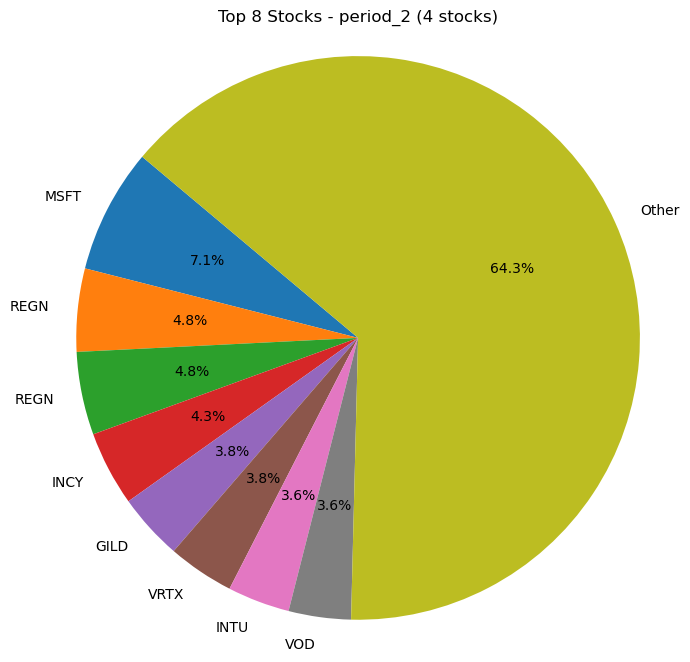

...

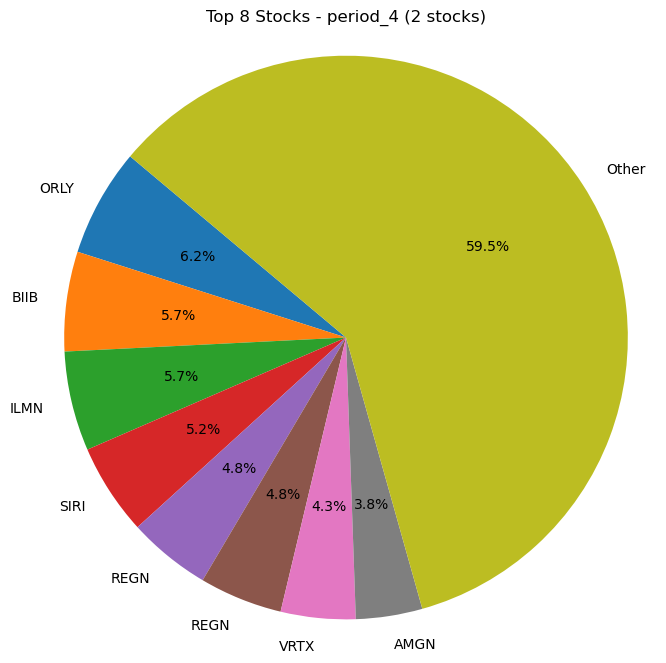

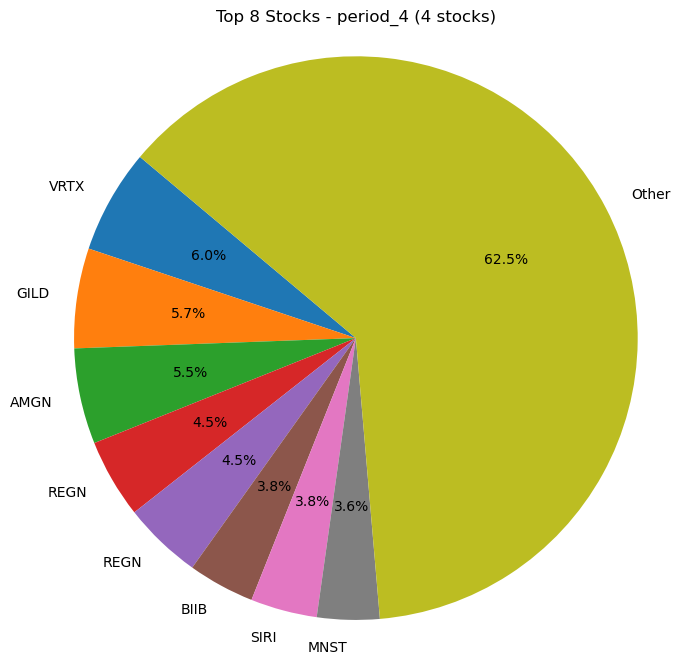

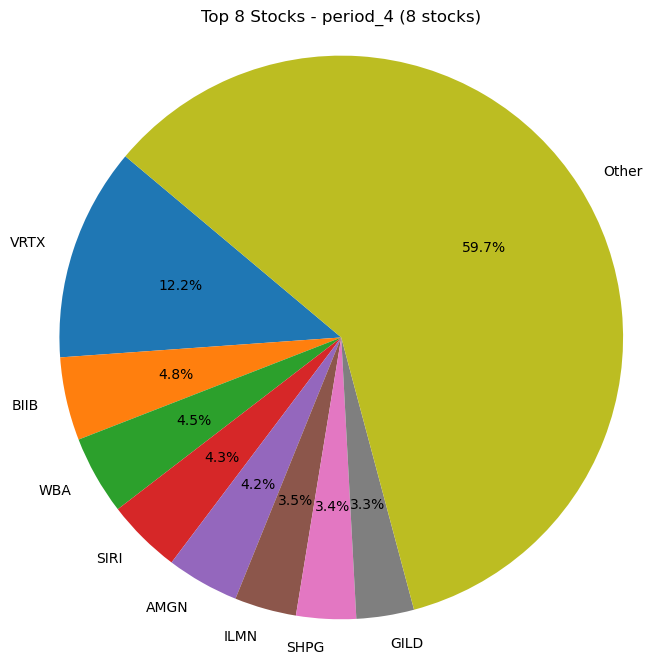

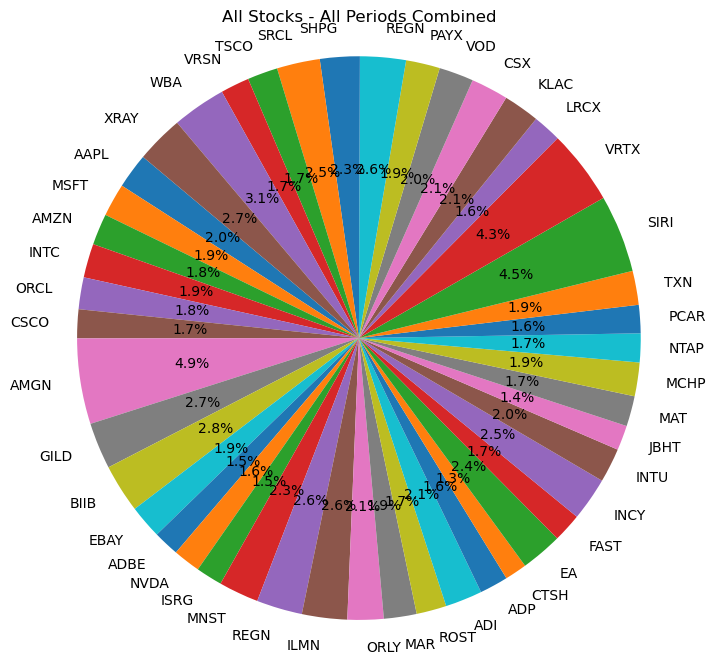

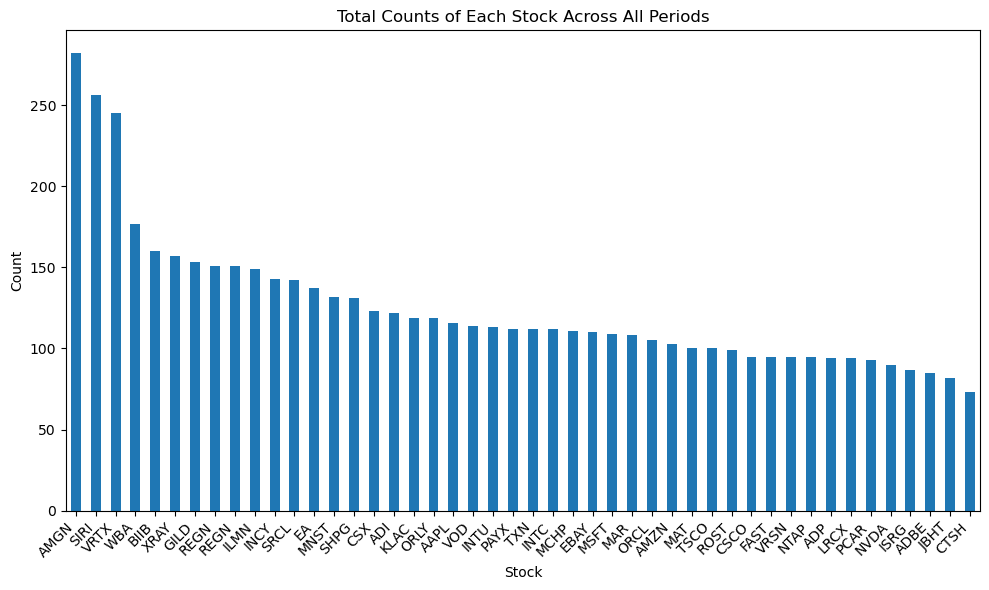

In [49]:
count_of_stocks(result_df_HCT_test,custom_tickers_test)

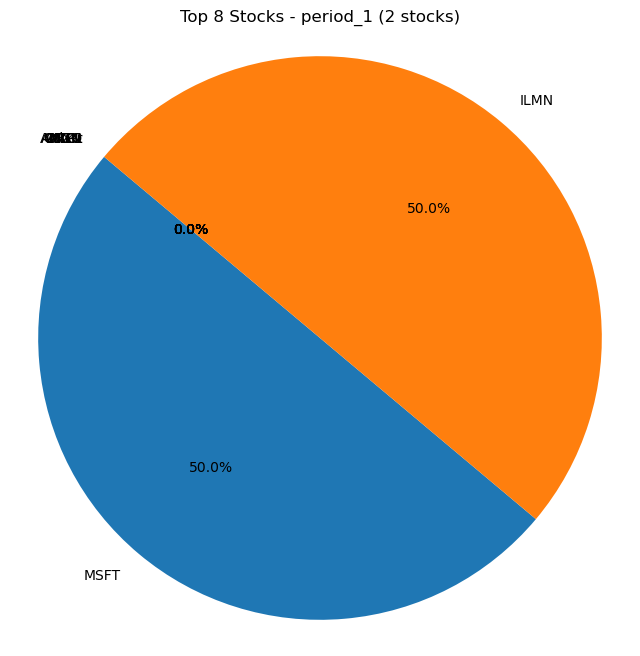

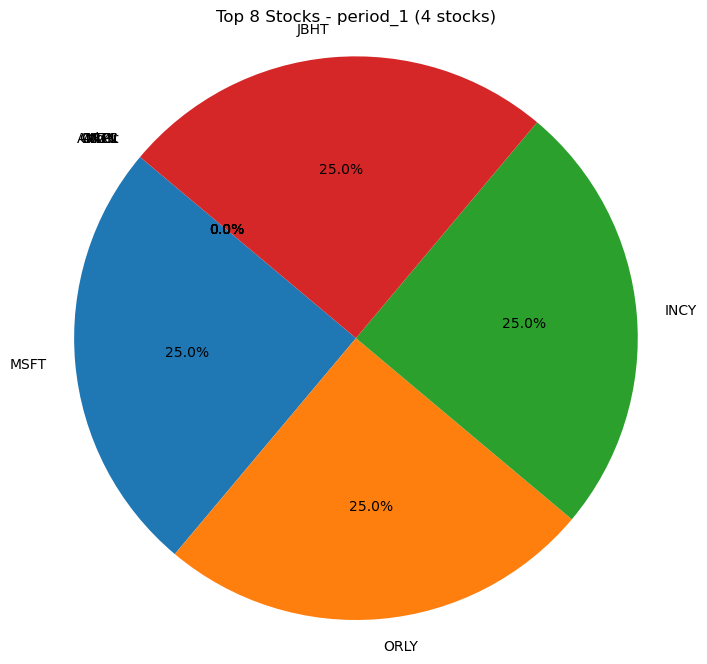

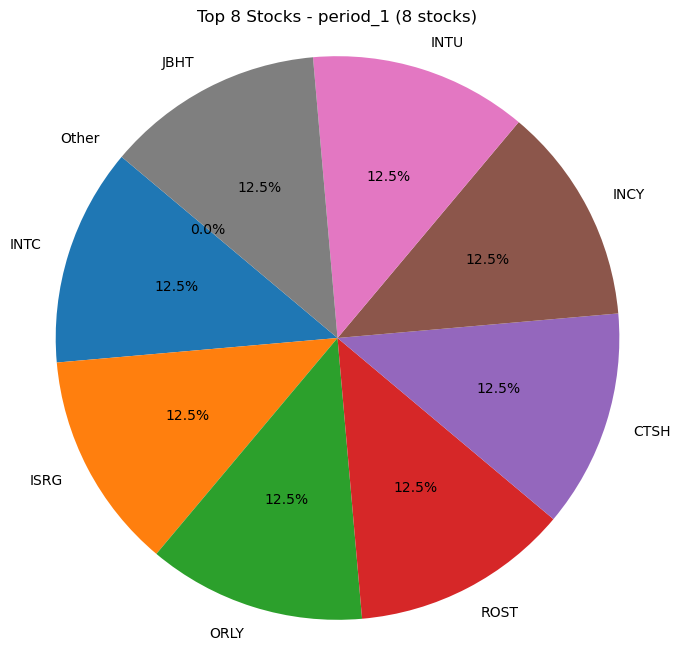

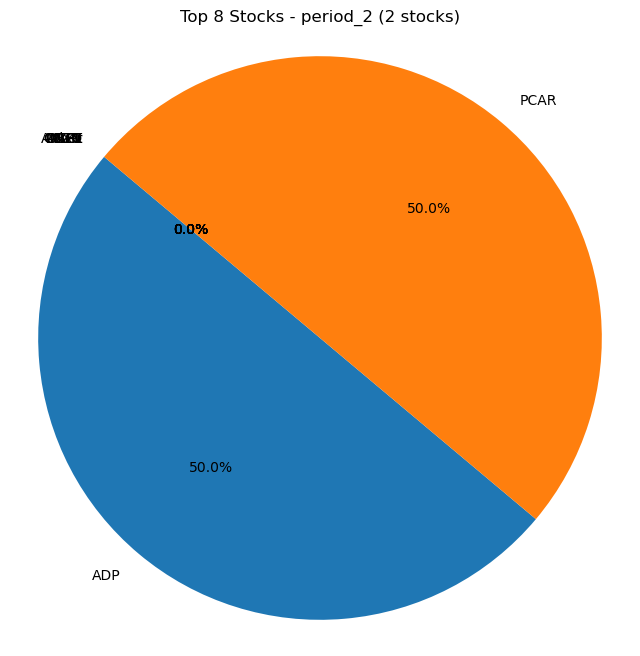

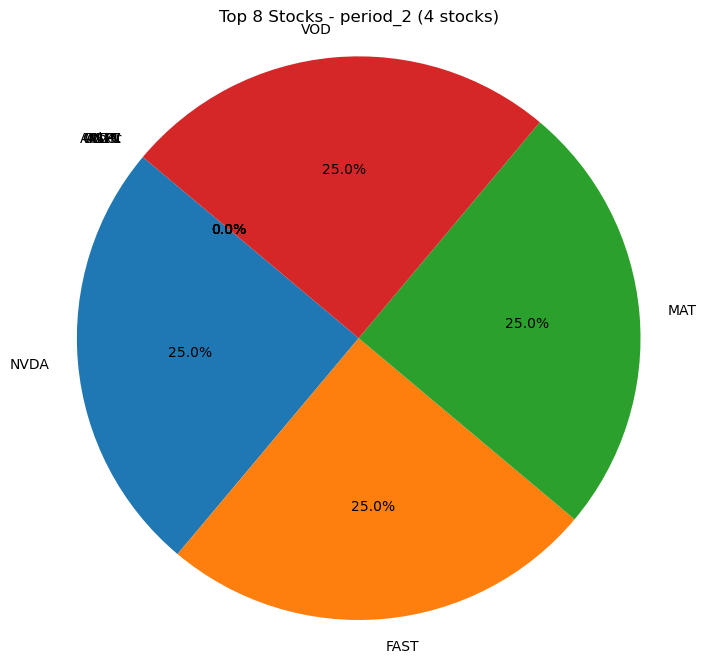

...

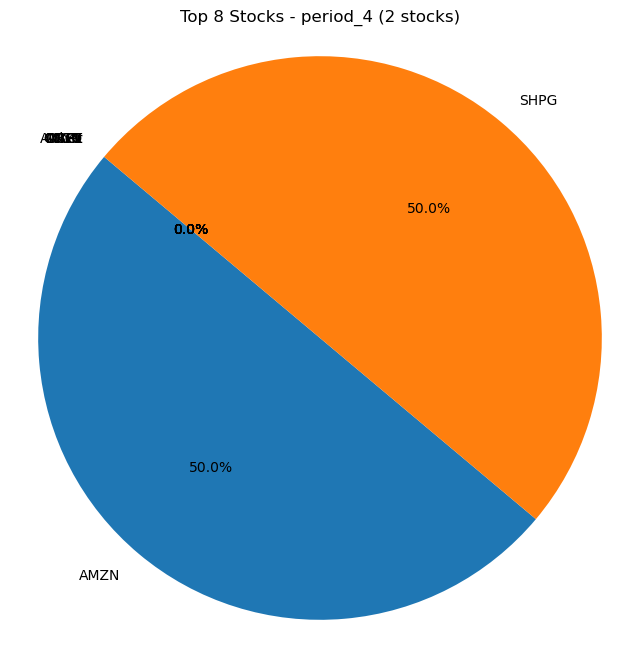

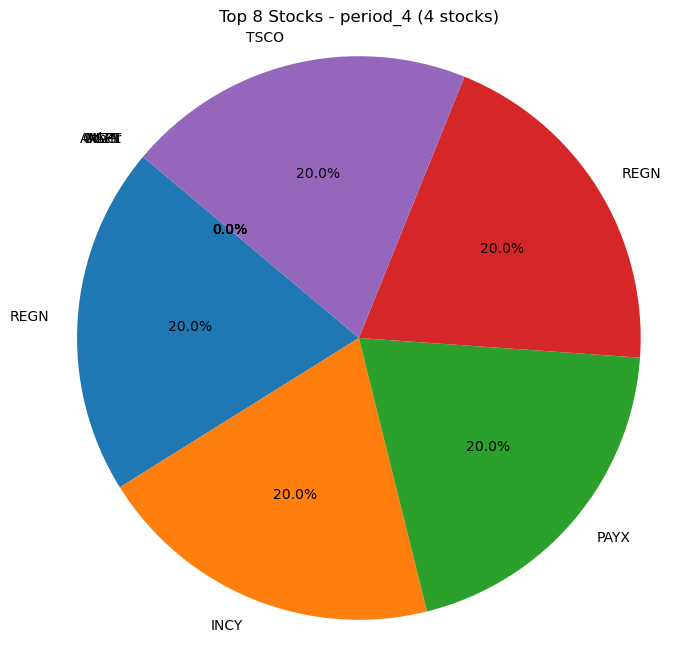

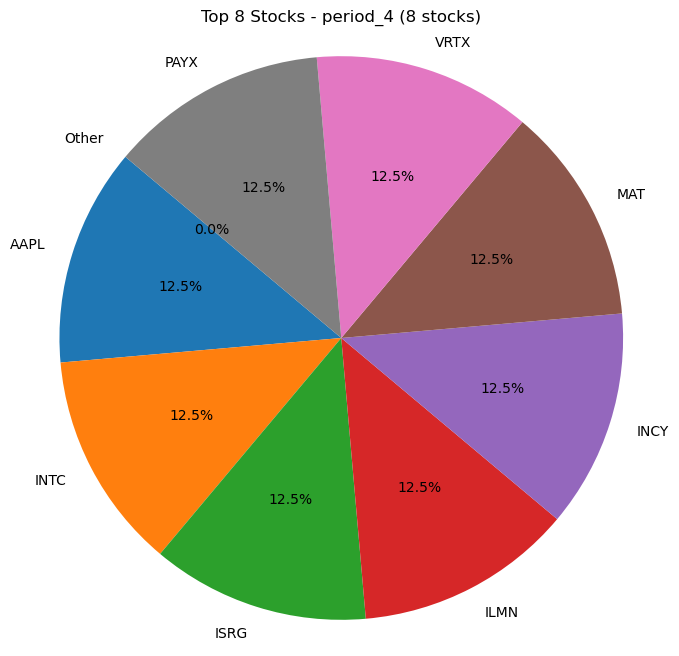

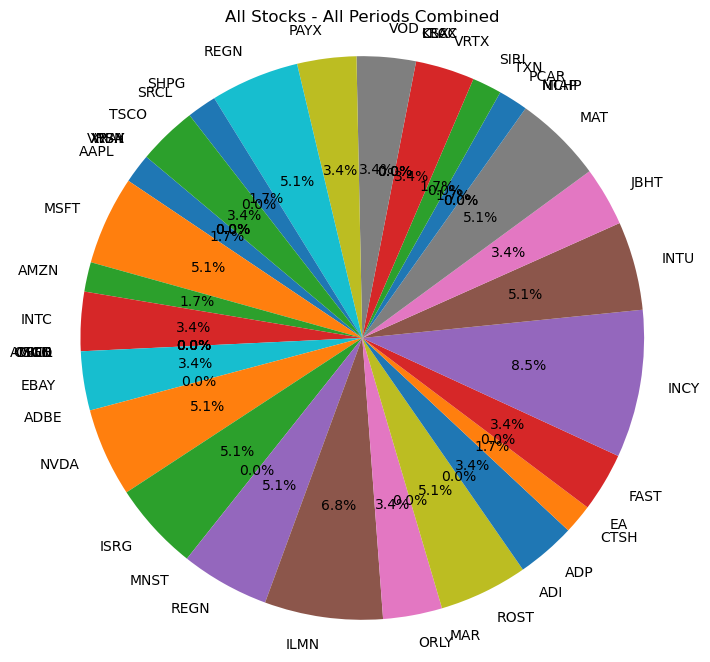

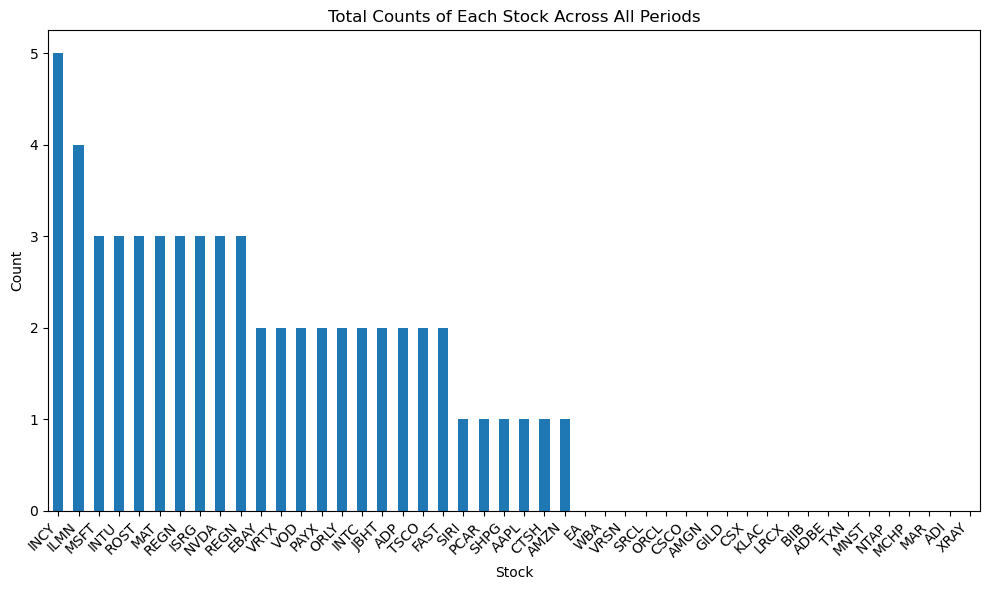

In [50]:
count_of_stocks(result_df_kmeans_test,custom_tickers_test)

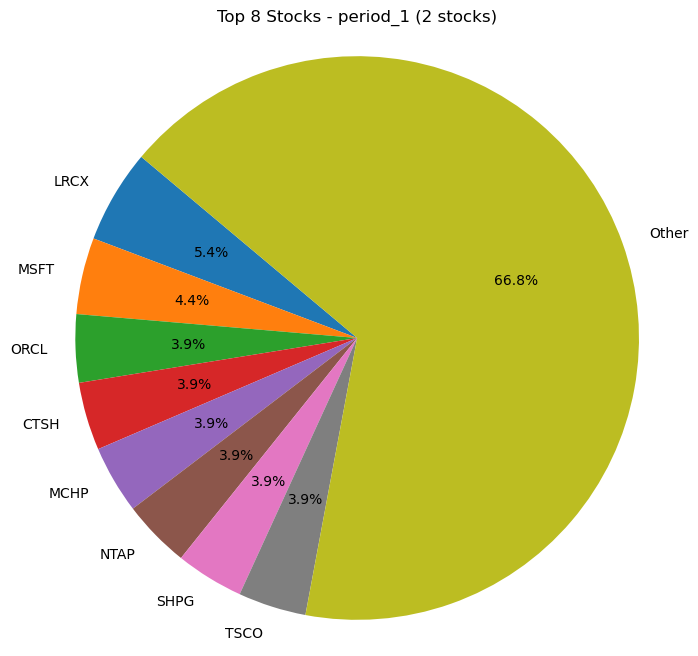

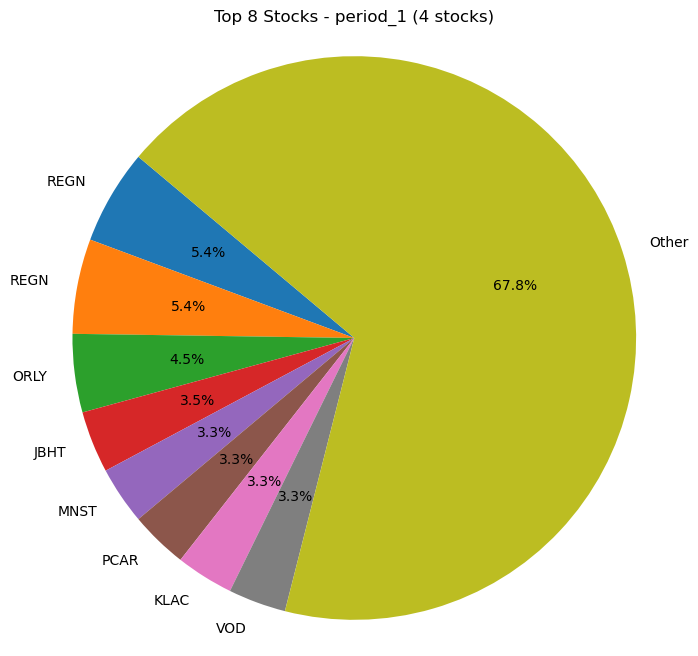

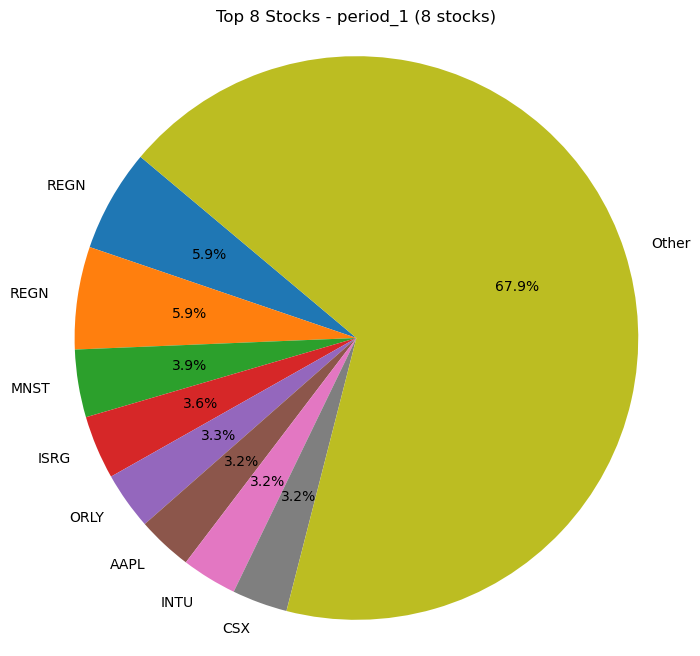

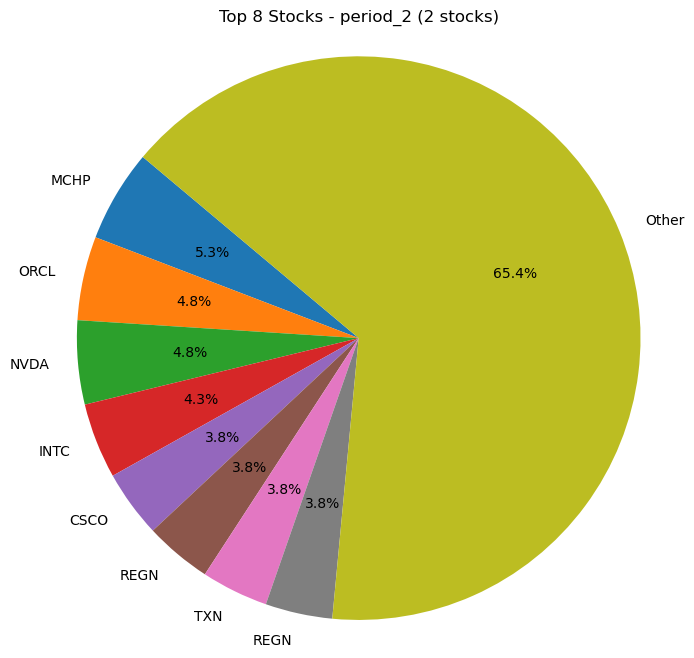

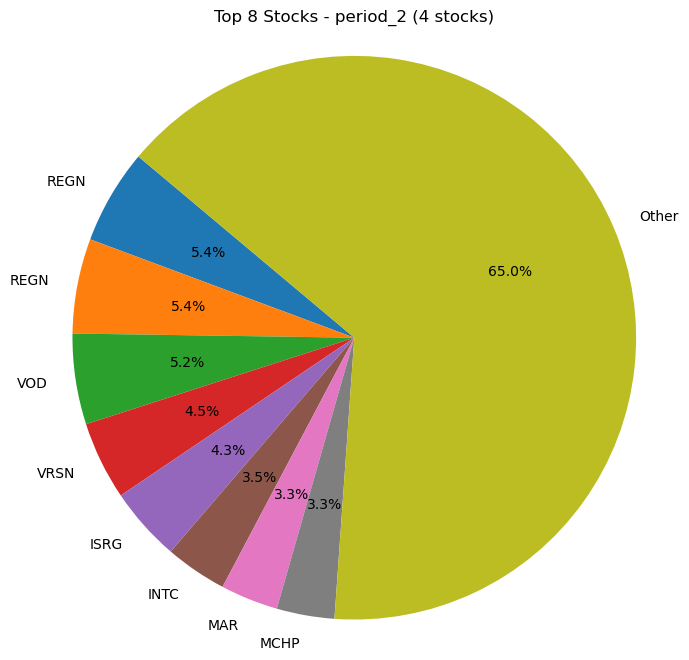

...

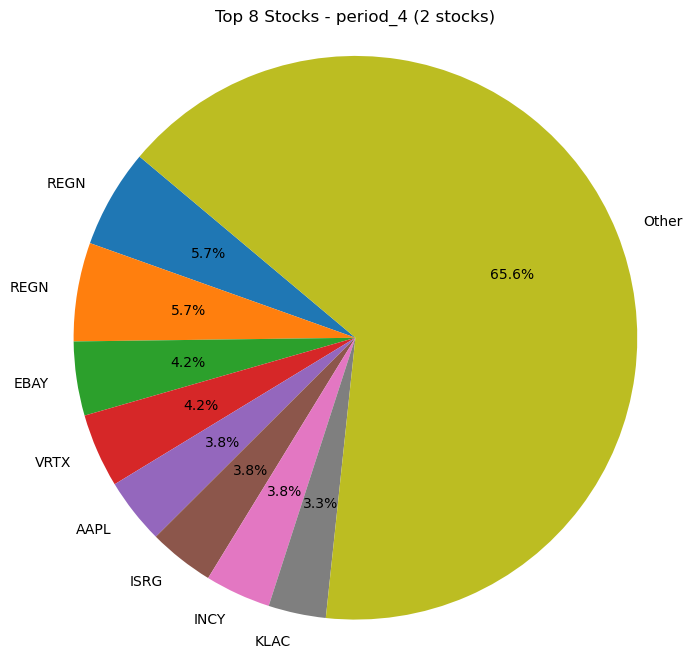

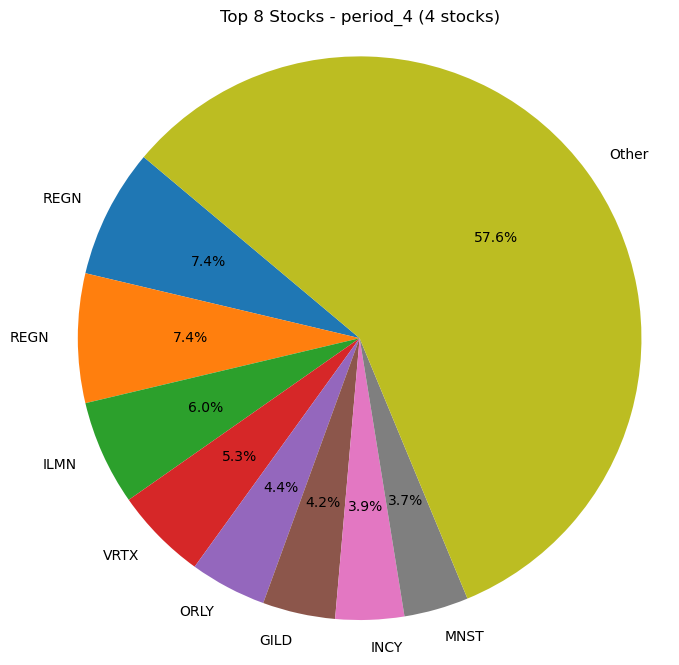

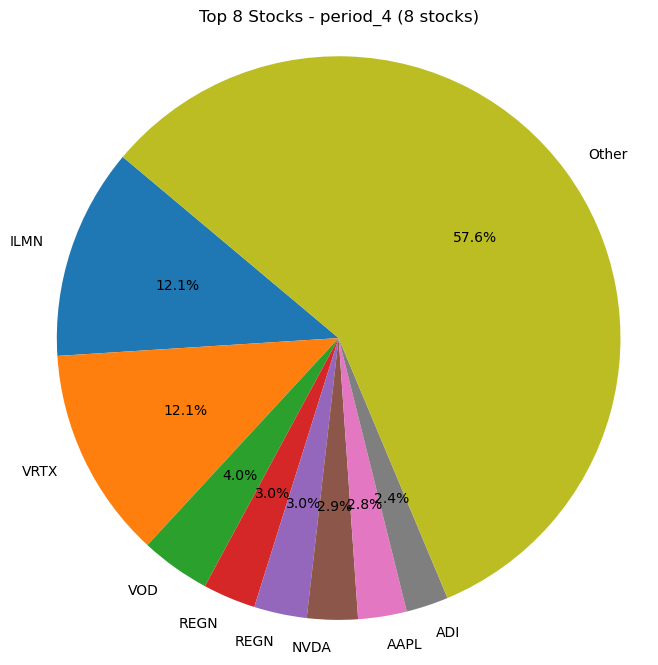

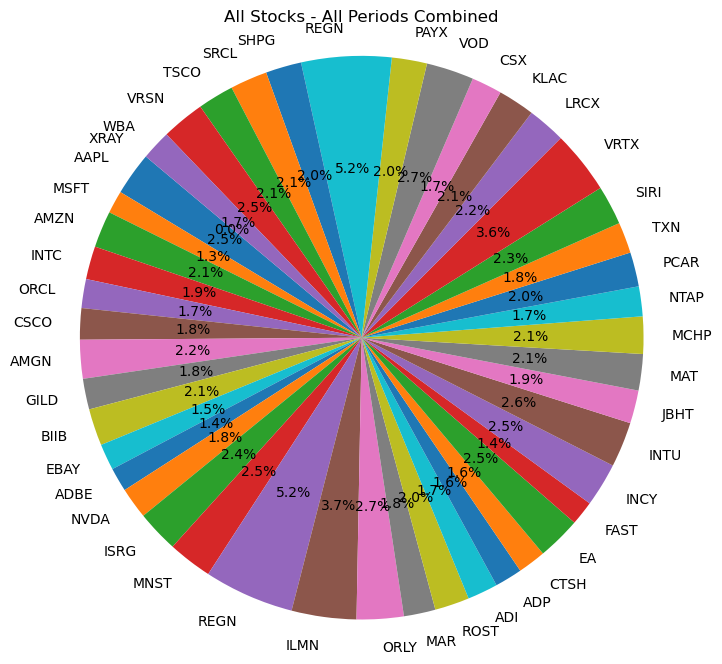

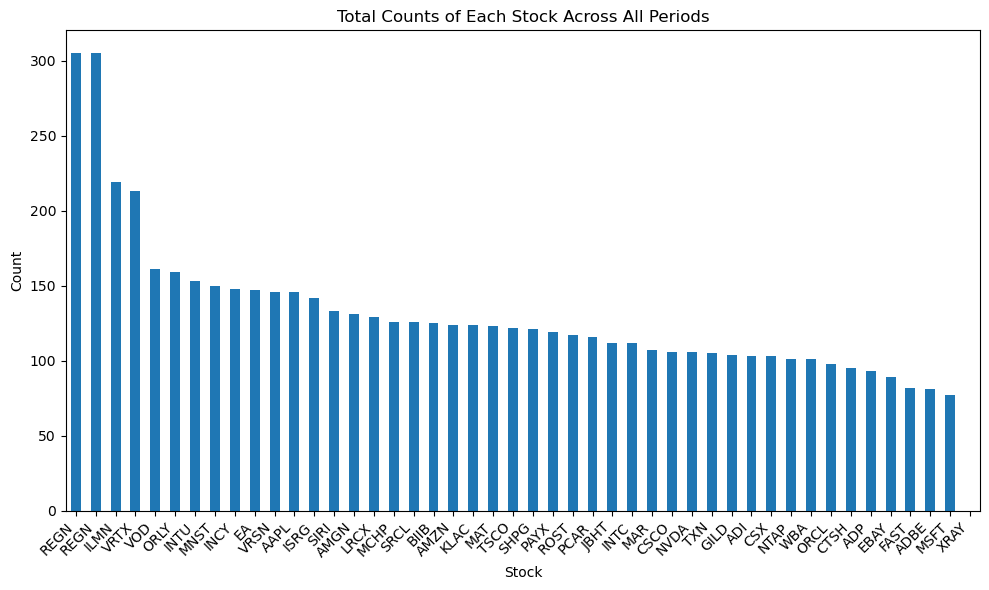

In [51]:
count_of_stocks(result_df_kmeans_rand_test,custom_tickers_test)

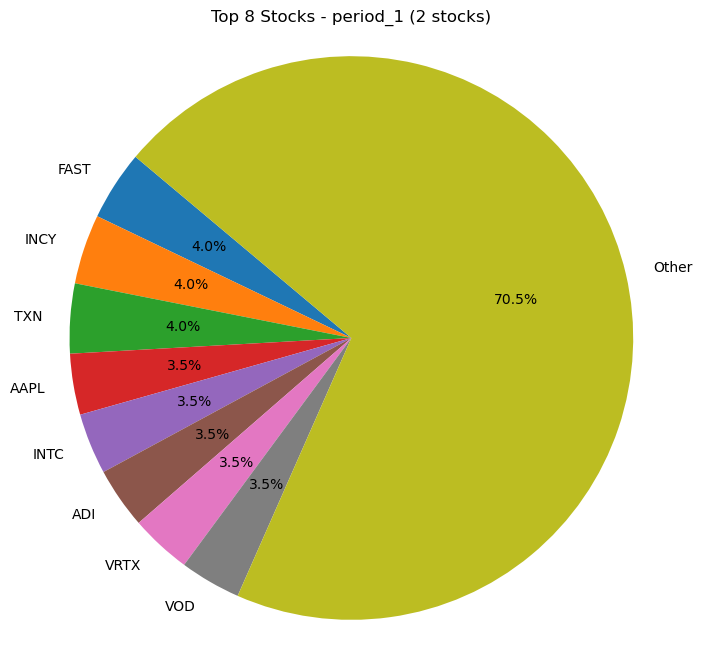

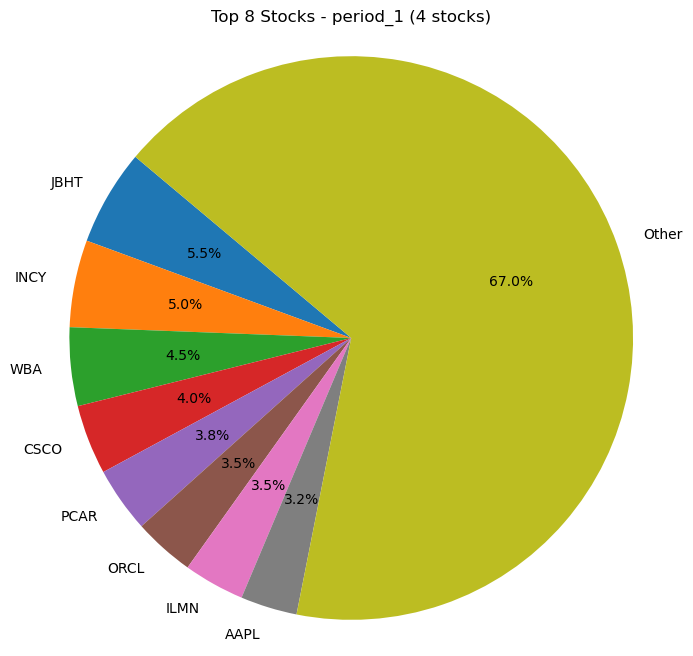

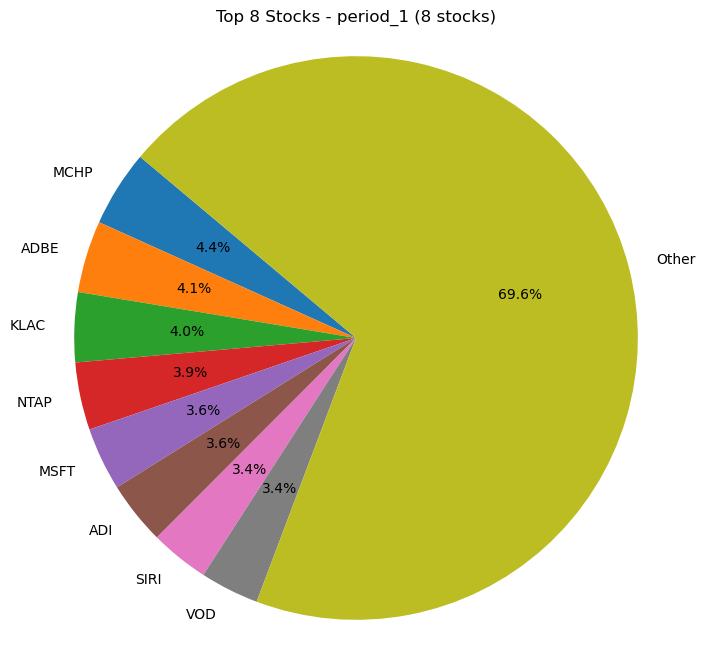

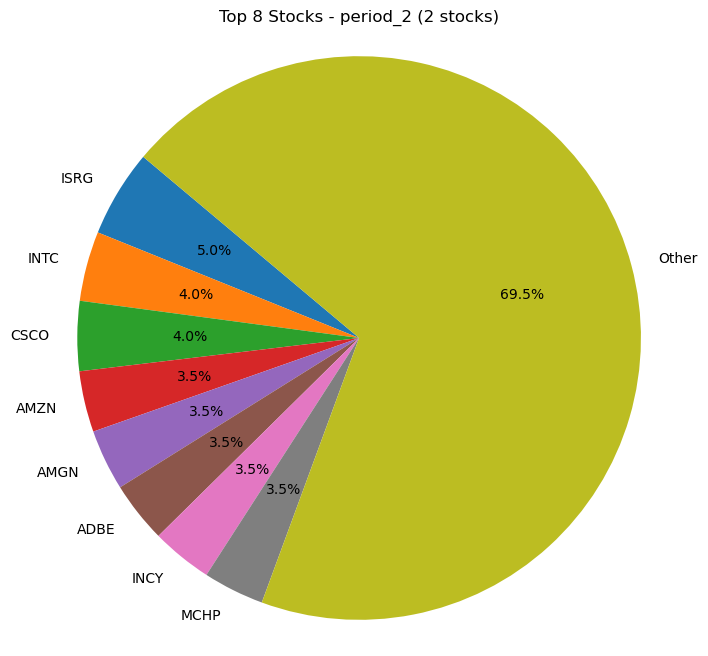

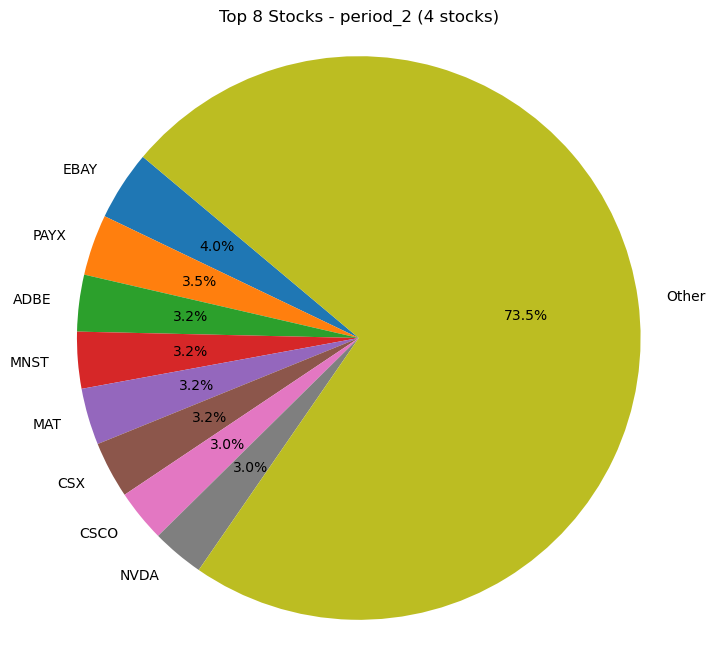

...

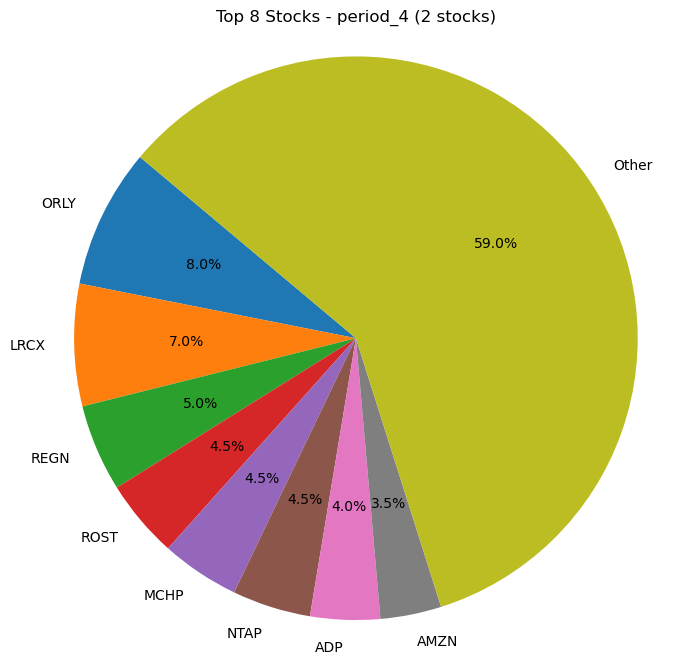

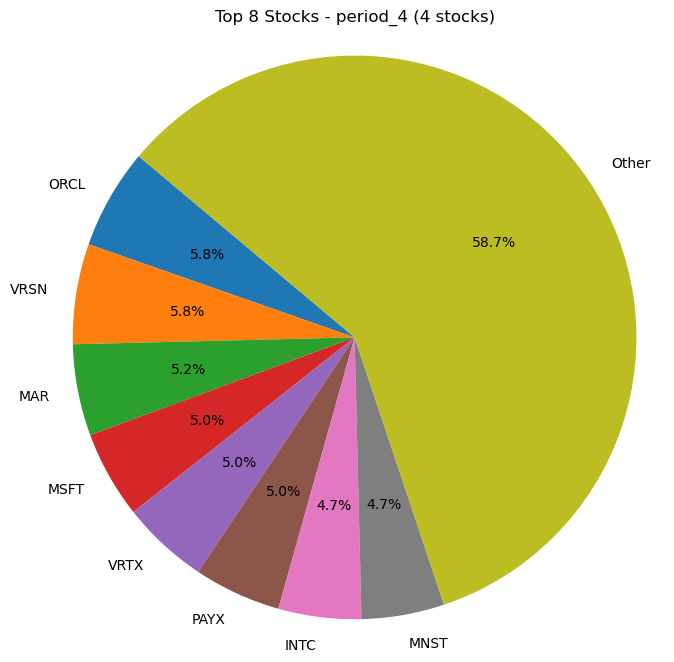

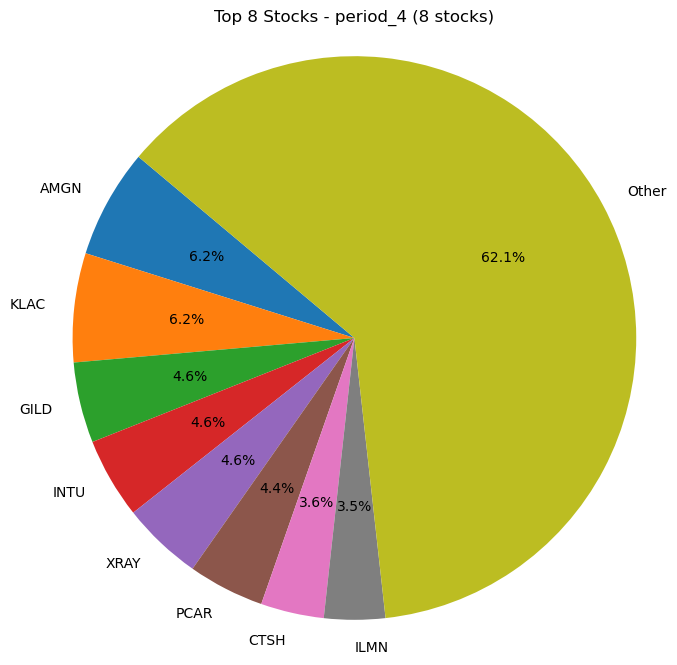

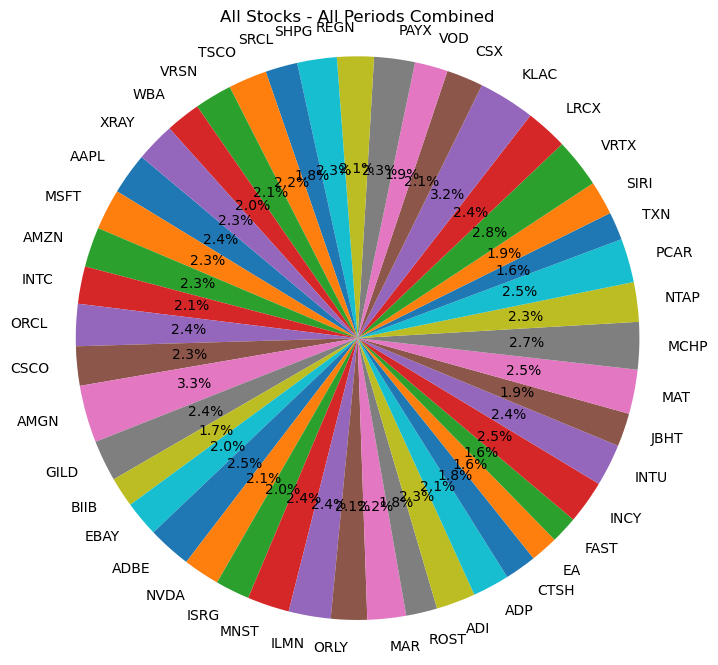

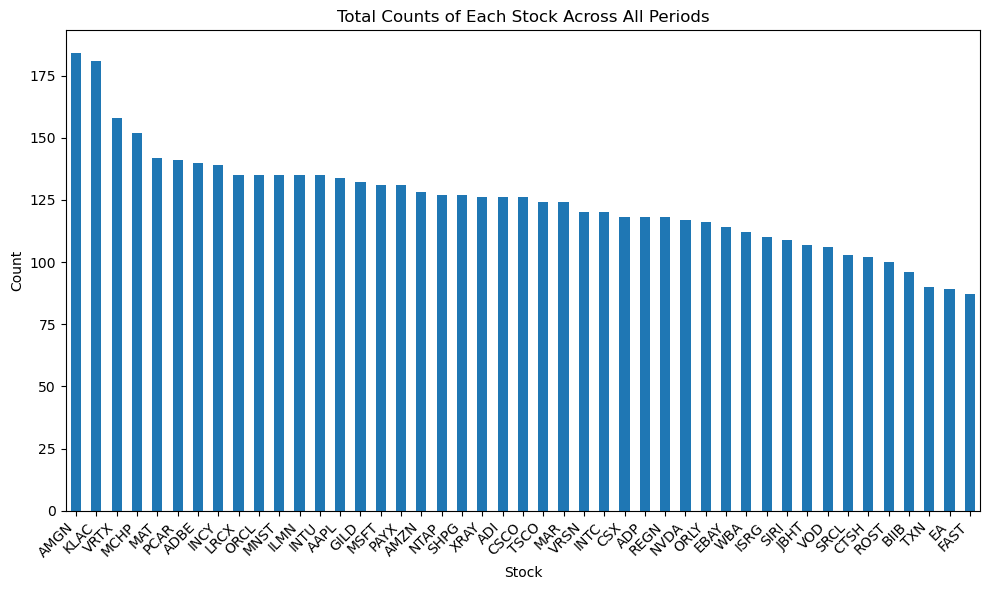

In [255]:
count_of_stocks(result_df_MST_test,custom_tickers_test)

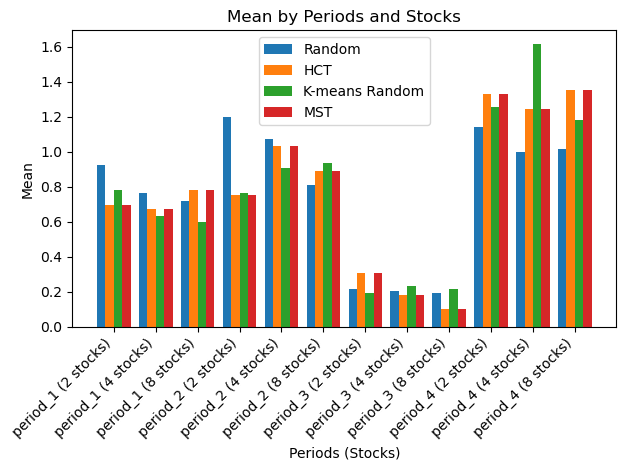

Total Average Mean of Random Values: 0.7717202417059722
Total Average Mean of Cluster Values: 0.7792981368164007
Total Average Mean of K-means Random Values: 0.7759996658522165
Total Average Mean of MST Values: 0.7792981368164007

Period 1 Average Mean of Random Values: 0.80146059153251
Period 1 Average Mean of Cluster Values: 0.7161567920381171
Period 1 Average Mean of K-means Random Values: 0.6701898643454086
Period 1 Average Mean of MST: 0.7161567920381171
Period 2 Average Mean of Random Values: 1.0280108074477619
Period 2 Average Mean of Cluster Values: 0.8937246482947345
Period 2 Average Mean of K-means Random Values: 0.8708563343488418
Period 2 Average Mean of MST: 0.8937246482947345
Period 3 Average Mean of Random Values: 0.20523311185564216
Period 3 Average Mean of Cluster Values: 0.19802628377732143
Period 3 Average Mean of K-means Random Values: 0.21318422072047527
Period 3 Average Mean of MST: 0.19802628377732143


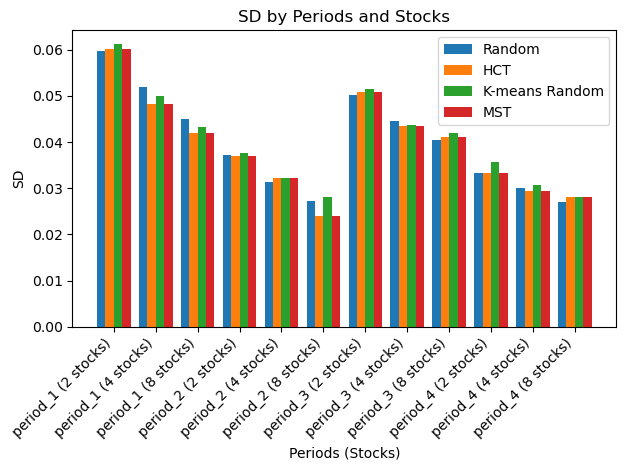

Total Average SD of Random Values: 0.039800567319783764
Total Average SD of Cluster Values: 0.03916784305419491
Total Average SD of K-means Random Values: 0.040357858760806026
Total Average SD of MST Values: 0.03916784305419491

Period 1 Average SD of Random Values: 0.05214580683810654
Period 1 Average SD of Cluster Values: 0.05015083689332766
Period 1 Average SD of K-means Random Values: 0.0514835627062681
Period 1 Average SD of MST: 0.05015083689332766
Period 2 Average SD of Random Values: 0.031938058877988326
Period 2 Average SD of Cluster Values: 0.031116754228158242
Period 2 Average SD of K-means Random Values: 0.032657566808310494
Period 2 Average SD of MST: 0.031116754228158242
Period 3 Average SD of Random Values: 0.0450464474294672
Period 3 Average SD of Cluster Values: 0.045169587942144214
Period 3 Average SD of K-means Random Values: 0.045718942333423766
Period 3 Average SD of MST: 0.045169587942144214


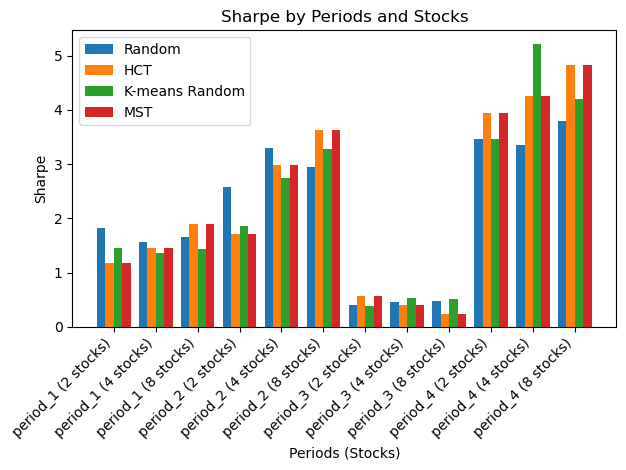

Total Average Sharpe of Random Values: 2.154144939452547
Total Average Sharpe of Cluster Values: 2.2606290136332987
Total Average Sharpe of K-means Random Values: 2.2034139537294237
Total Average Sharpe of MST Values: 2.2606290136332987

Period 1 Average Sharpe of Random Values: 1.6848757510840544
Period 1 Average Sharpe of Cluster Values: 1.512237147507431
Period 1 Average Sharpe of K-means Random Values: 1.4157060302728333
Period 1 Average Sharpe of MST: 1.512237147507431
Period 2 Average Sharpe of Random Values: 2.9433732854948516
Period 2 Average Sharpe of Cluster Values: 2.775125055962935
Period 2 Average Sharpe of K-means Random Values: 2.6221968925624326
Period 2 Average Sharpe of MST: 2.775125055962935
Period 3 Average Sharpe of Random Values: 0.4510855121170676
Period 3 Average Sharpe of Cluster Values: 0.4099515859434379
Period 3 Average Sharpe of K-means Random Values: 0.4781009197781056
Period 3 Average Sharpe of MST: 0.4099515859434379


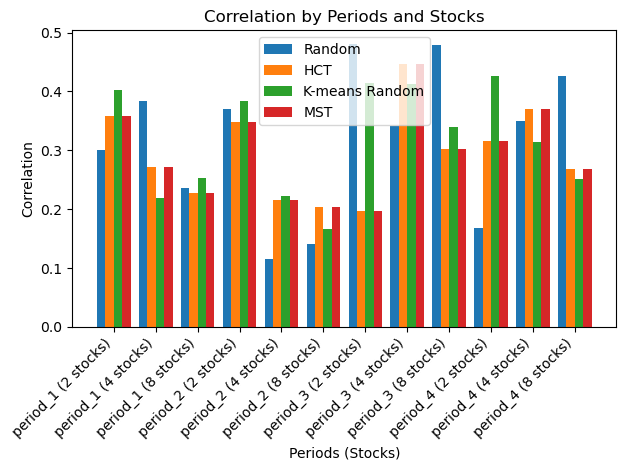

Total Average Correlation of Random Values: 0.31594762764430157
Total Average Correlation of Cluster Values: 0.29369414799801113
Total Average Correlation of K-means Random Values: 0.3170722871635885
Total Average Correlation of MST Values: 0.29369414799801113

Period 1 Average Correlation of Random Values: 0.3064860238245862
Period 1 Average Correlation of Cluster Values: 0.28596974786841217
Period 1 Average Correlation of K-means Random Values: 0.29156966547116053
Period 1 Average Correlation of MST: 0.28596974786841217
Period 2 Average Correlation of Random Values: 0.20851974909200424
Period 2 Average Correlation of Cluster Values: 0.2559672637655876
Period 2 Average Correlation of K-means Random Values: 0.25780007797952426
Period 2 Average Correlation of MST: 0.2559672637655876
Period 3 Average Correlation of Random Values: 0.4336913590192937
Period 3 Average Correlation of Cluster Values: 0.3148440114036779
Period 3 Average Correlation of K-means Random Values: 0.38830797735784367

In [270]:
# Plotting Mean
plot_metric('Mean',result_df_random_test,result_df_HCT_test,result_df_kmeans_rand_test,result_df_HCT_test)

# Plotting SD
plot_metric('SD',result_df_random_test,result_df_HCT_test,result_df_kmeans_rand_test,result_df_HCT_test)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test,result_df_HCT_test,result_df_kmeans_rand_test,result_df_HCT_test)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test,result_df_HCT_test,result_df_kmeans_rand_test,result_df_HCT_test)

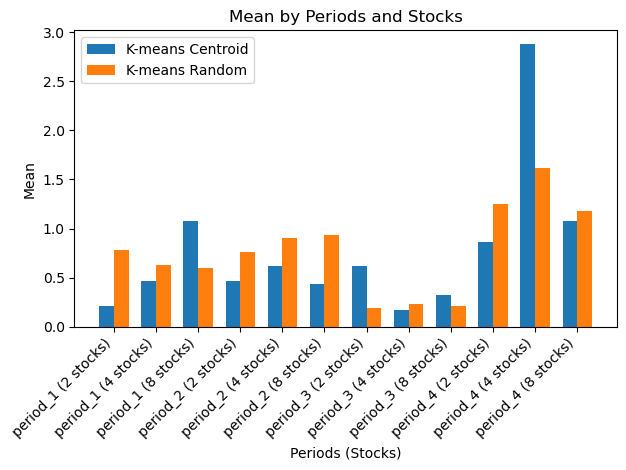

Total Average Mean of K-means Centroid Values: 0.766360856579967
Total Average Mean of K-means Random Values: 0.7759996658522165

Period 1 Average Mean of K-means Centroid Values: 0.5864562294827113
Period 1 Average Mean of K-means Random Values: 0.6701898643454086
Period 2 Average Mean of K-means Centroid Values: 0.5036440867608387
Period 2 Average Mean of K-means Random Values: 0.8708563343488418
Period 3 Average Mean of K-means Centroid Values: 0.36882229459384597
Period 3 Average Mean of K-means Random Values: 0.21318422072047527


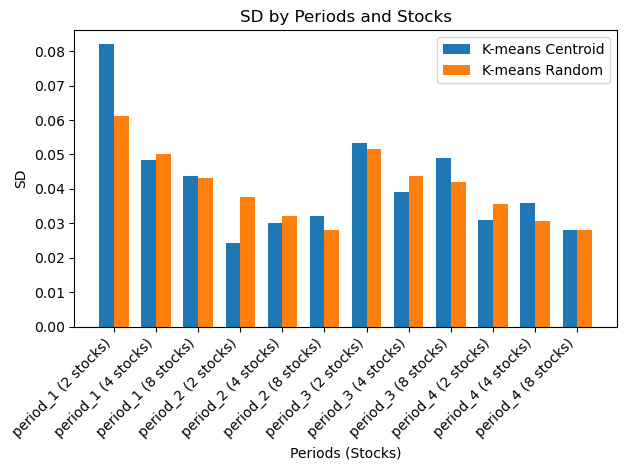

Total Average SD of K-means Centroid Values: 0.04144472877078721
Total Average SD of K-means Random Values: 0.040357858760806026

Period 1 Average SD of K-means Centroid Values: 0.05801966168342554
Period 1 Average SD of K-means Random Values: 0.0514835627062681
Period 2 Average SD of K-means Centroid Values: 0.028867874401873966
Period 2 Average SD of K-means Random Values: 0.032657566808310494
Period 3 Average SD of K-means Centroid Values: 0.04718111369541215
Period 3 Average SD of K-means Random Values: 0.045718942333423766


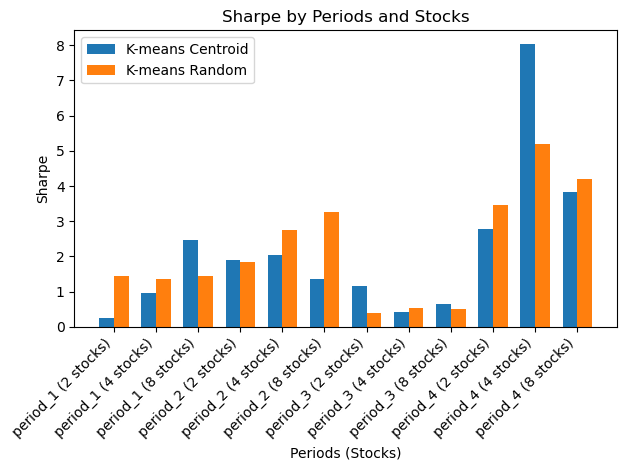

Total Average Sharpe of K-means Centroid Values: 2.1549523793057266
Total Average Sharpe of K-means Random Values: 2.2034139537294237

Period 1 Average Sharpe of K-means Centroid Values: 1.2312526618725907
Period 1 Average Sharpe of K-means Random Values: 1.4157060302728333
Period 2 Average Sharpe of K-means Centroid Values: 1.7628050941226145
Period 2 Average Sharpe of K-means Random Values: 2.6221968925624326
Period 3 Average Sharpe of K-means Centroid Values: 0.74689986992774
Period 3 Average Sharpe of K-means Random Values: 0.4781009197781056


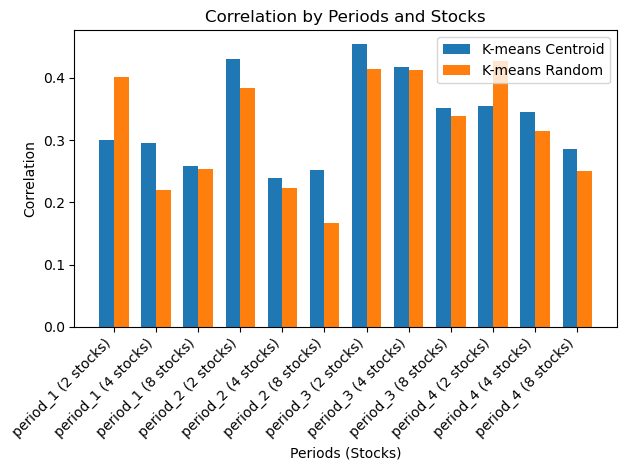

Total Average Correlation of K-means Centroid Values: 0.33177793839427433
Total Average Correlation of K-means Random Values: 0.3170722871635885

Period 1 Average Correlation of K-means Centroid Values: 0.28455962208033586
Period 1 Average Correlation of K-means Random Values: 0.29156966547116053
Period 2 Average Correlation of K-means Centroid Values: 0.3070957640219372
Period 2 Average Correlation of K-means Random Values: 0.25780007797952426
Period 3 Average Correlation of K-means Centroid Values: 0.40724109895319754
Period 3 Average Correlation of K-means Random Values: 0.38830797735784367


In [53]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test,result_df_kmeans_rand_test)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test,result_df_kmeans_rand_test)

In [54]:
############# Out of sampling testing: time ##############

In [257]:
def calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_stocks = {}
        
        for num_stocks in num_stocks_list:
            std_returns = []
            portfolio_returns = []
            correlations = []
            selected_stocks_list = {}

            for _ in range(num_portfolios):
                selected_stocks = np.random.choice(train_returns_data.columns, size=num_stocks, replace=False)
                
                try:
                    selected_stocks_list[num_stocks] = np.concatenate([selected_stocks_list[num_stocks], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_stocks] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)
            final_stocks_list = [list(i) for i in selected_stocks_list.values()]

            results_by_stocks[num_stocks] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}
        results_by_period[test_period] = results_by_stocks
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df_random = pd.concat(dfs)
    return result_df_random

In [258]:
num_stocks_list = [2, 4, 8]
result_df_random_test1 = calculate_metrics_for_random_selection_test(period_dfs, num_stocks_list)
result_df_random_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.249317,0.021904,1.208867,0.245976,"[TRV, CCEP, JPM, JNJ, INTC, BA, DD, DIS, MRK, T, INTC, HPQ, RTX, WMT, XOM, INTC, WMT, MSFT, DD, JNJ, AA, HD, MMM, CVX, MMM, VZ, CAT, JPM, IBM, CVX, AXP, IBM, WMT, AXP, DIS, PFE, DIS, JNJ, T, WMT, MRK, HPQ, DD, MCD, AA, BA, BA, CVX, BA, CAT, INTC, HD, CVX, JNJ, WMT, T, AA, JNJ, BA, VZ, JNJ, DIS, RTX, T, AA, WMT, MSFT, GE, CCEP, AA, CCEP, MCD, JNJ, HD, HD, TRV, TRV, AA, TRV, XOM, PG, AXP, T, MCD, JPM, MSFT, AXP, AA, INTC, XOM, CCEP, TRV, AXP, PFE, CAT, DD, INTC, MCD, JPM, MMM, ...]"
period_2 (4 stocks),0.257592,0.018262,1.447863,0.249453,"[CCEP, RTX, MCD, MSFT, CAT, BA, WMT, RTX, PFE, T, JNJ, MRK, CVX, INTC, GE, PFE, CCEP, PG, PFE, VZ, JPM, AXP, MCD, DD, WMT, RTX, BA, MCD, AXP, MMM, MRK, PG, IBM, CAT, CVX, PG, DD, INTC, HD, JPM, XOM, BA, AA, MRK, JNJ, CAT, RTX, MSFT, JPM, DIS, XOM, AXP, INTC, HPQ, GE, CVX, MSFT, JNJ, IBM, BA, T, GE, PFE, JPM, CVX, HD, JNJ, GE, DD, WMT, HPQ, AA, WMT, MSFT, JPM, IBM, MMM, VZ, AXP, MRK, WMT, RTX, JNJ, CAT, MCD, AXP, CVX, MRK, HPQ, MSFT, WMT, MCD, VZ, MCD, IBM, BA, DD, MMM, MSFT, CAT, ...]"
period_2 (8 stocks),0.255551,0.016063,1.606968,0.243986,"[WMT, AXP, RTX, CAT, MSFT, MCD, MRK, MMM, HD, PG, BA, AXP, INTC, GE, XOM, DIS, RTX, MSFT, CVX, BA, AXP, IBM, MRK, HD, MCD, WMT, MSFT, CAT, RTX, T, CVX, GE, INTC, DD, MCD, XOM, CAT, HD, JPM, VZ, CAT, MRK, VZ, MCD, HPQ, DD, GE, HD, CCEP, HPQ, BA, JNJ, HD, CAT, JPM, GE, CVX, CAT, VZ, XOM, JPM, HPQ, INTC, RTX, AA, XOM, CVX, MRK, DIS, CCEP, AXP, RTX, CAT, AA, PG, IBM, MMM, JPM, BA, CCEP, RTX, T, WMT, MSFT, DD, AXP, MMM, CAT, BA, CAT, MCD, AA, MRK, PFE, TRV, RTX, DIS, PG, BA, IBM, ...]"
period_3 (2 stocks),-0.025068,0.043569,-0.026044,0.504463,"[AXP, DIS, DIS, HPQ, DD, AA, AXP, TRV, HD, VZ, CAT, MRK, PFE, CAT, HD, DD, MSFT, DIS, MSFT, JNJ, HD, MSFT, GE, AA, AA, PG, MSFT, PFE, IBM, PG, DD, CCEP, GE, T, GE, CCEP, JPM, AXP, PG, AXP, MMM, MCD, DIS, CAT, CCEP, HD, DIS, JNJ, MCD, VZ, CCEP, GE, GE, IBM, TRV, XOM, DIS, JPM, CVX, HPQ, MMM, TRV, DD, PFE, MMM, MRK, INTC, WMT, PFE, CAT, BA, IBM, AXP, DIS, MMM, GE, INTC, PG, RTX, CVX, IBM, XOM, PG, T, MRK, MCD, AXP, WMT, PFE, MCD, MSFT, T, INTC, HD, WMT, PG, BA, IBM, TRV, JNJ, ...]"
period_3 (4 stocks),-0.004839,0.039659,0.003910,0.500444,"[DD, CCEP, CAT, AA, XOM, T, MSFT, INTC, AXP, DD, JNJ, DIS, IBM, MCD, HD, AA, AXP, HD, MMM, MCD, IBM, MMM, PFE, AXP, MMM, HD, INTC, IBM, INTC, DD, GE, MMM, TRV, T, BA, IBM, MSFT, MCD, AA, HD, AXP, MMM, CCEP, PFE, DD, BA, MMM, JPM, CAT, HPQ, VZ, GE, AA, HD, T, VZ, CAT, IBM, GE, XOM, CCEP, HD, INTC, T, PG, CAT, AA, BA, DD, INTC, AXP, CCEP, DIS, HPQ, RTX, MMM, CVX, GE, WMT, DIS, MMM, VZ, DIS, WMT, GE, VZ, XOM, DIS, HPQ, MMM, JNJ, MCD, CCEP, DD, AXP, GE, MRK, JPM, AXP, BA, ...]"
period_3 (8 stocks),0.008932,0.037738,0.028960,0.502880,"[JPM, CCEP, JNJ, IBM, MSFT, HPQ, MMM, PFE, RTX, TRV, MRK, GE, PG, T, MSFT, CCEP, MSFT, INTC, HD, CCEP, WMT, RTX, CVX, DIS, BA, MSFT, AXP, TRV, MCD, JPM, INTC, PFE, MMM, TRV, INTC, MSFT, BA, RTX, MRK, DIS, PG, T, WMT, MRK, MMM, JNJ, GE, DIS, CCEP, DD, T, AXP, JNJ, JPM, MCD, HD, MRK, HD, AA, BA, PFE, AXP, RTX, WMT, CVX, XOM, JNJ, AXP, MMM, CAT, DD, MCD, MMM, HD, MSFT, VZ, CAT, CVX, XOM, MCD, PFE, BA, RTX, MCD, DD, MMM, JNJ, VZ, BA, DIS, MRK, DD, IBM, CAT, VZ, TRV, T, DD, JPM, AXP, ...]"
period_4 (2 stocks),0.447583,0.027012,1.816892,0.486428,"[IBM, DD, JNJ, MRK, GE, AXP, IBM, XOM, HPQ, DIS, GE, WMT, DIS, MCD, BA, MRK, DD, CCEP, MSFT, AA, HPQ, CVX, PG, T, HD, BA, HD, MMM, JNJ, INTC, DD, DIS, INTC, WMT, CAT, CCEP, MMM, BA, HPQ, INTC, PFE, DD, CCEP, JNJ, AXP, MRK, MMM, TRV, MCD, JNJ, CAT, DIS, PG, CCEP, VZ, T, MMM, CCEP, HPQ, TRV, JPM, T, VZ, PG, AXP, CVX, BA, MCD, INTC, VZ, PG, BA, JPM, DD, AXP, VZ, BA, MCD, CCEP, CVX, PG, CAT, HD, INTC, MRK, TRV, BA, HD, RTX, GE, PG, XOM, IBM, MMM, MCD, T, WMT, HPQ, MCD, PFE, ...]"
period_4 (4 stocks),0.430603,0.024734,1.832911,0.485000,"[HD, XOM, PFE, HPQ, JNJ, INTC, MCD, WMT, BA, MCD, MSFT, WMT, CAT, VZ, TRV, GE, CVX, DD, JPM, MRK, CVX, RTX, 

In [57]:
def calculate_metrics_for_all_clusters_test(all_cluster_stocks, period_dfs):
    results_by_period = {}
    num_portfolios = 1000
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        selected_stocks_list = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlations = []
            
            for _ in range(num_portfolios):
                # First, choose stocks from each cluster
                selected_stocks = [np.random.choice(cluster_list, size=1)[0] for cluster_list in cluster_lists]

                try:
                    selected_stocks_list[num_clusters] = np.concatenate([selected_stocks_list[num_clusters], selected_stocks])
                except KeyError:
                    selected_stocks_list[num_clusters] = selected_stocks

                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)

                mean_std = portfolio_return_stocks.std()
                std_returns.append(mean_std)

                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlations.append(mean_correlation)

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            mean_correl = np.mean(correlations)

            final_stocks_list = [selected_stocks_list[num_clusters]]

            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correl, "Stocks": final_stocks_list}

        results_by_period[test_period] = results_by_cluster
    dfs = []
    for period, results_by_stocks in results_by_period.items():
        for num_stocks, metrics in results_by_stocks.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_stocks} stocks)"])
            dfs.append(df)
    result_df = pd.concat(dfs)
    return result_df

In [58]:
result_df_HCT_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_HCT, period_dfs)
result_df_HCT_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.233482,0.021126,1.179669,0.178504,"[MCD, IBM, MRK, MSFT, PFE, AXP, MCD, INTC, T, HD, MCD, BA, PFE, INTC, T, AA, T, CVX, JNJ, MSFT, PG, DIS, JNJ, IBM, CCEP, JPM, PG, BA, MRK, DD, PG, HPQ, MCD, HPQ, T, WMT, T, JPM, T, CVX, MCD, BA, VZ, DD, CCEP, WMT, MCD, HPQ, VZ, MSFT, T, BA, PFE, AXP, T, AA, MCD, IBM, MRK, AA, JNJ, WMT, T, INTC, PG, XOM, MCD, MSFT, VZ, MMM, MCD, IBM, VZ, DIS, MCD, DD, MCD, RTX, VZ, HD, PFE, XOM, MCD, RTX, MRK, INTC, MRK, JPM, PG, DD, JNJ, BA, MCD, AA, JNJ, BA, CCEP, GE, MRK, RTX, ...]"
period_2 (4 stocks),0.203712,0.017430,1.208066,0.186891,"[PG, AXP, T, MSFT, PG, MMM, T, IBM, PFE, AA, MCD, IBM, MRK, AXP, T, HPQ, PG, BA, VZ, MSFT, MRK, BA, T, INTC, JNJ, CAT, T, IBM, MRK, GE, MCD, HPQ, JNJ, XOM, CCEP, INTC, MRK, JPM, T, INTC, JNJ, MMM, T, MSFT, PG, GE, MCD, INTC, PFE, HD, T, IBM, JNJ, AA, VZ, MSFT, PG, CAT, MCD, MSFT, PFE, AA, CCEP, IBM, JNJ, AXP, CCEP, INTC, PFE, JPM, MCD, MSFT, MRK, HD, MCD, HPQ, JNJ, DIS, MCD, IBM, PFE, JPM, T, HPQ, JNJ, RTX, CCEP, HPQ, MRK, AXP, T, INTC, MRK, RTX, MCD, HPQ, MRK, XOM, T, HPQ, ...]"
period_2 (8 stocks),0.274481,0.014829,1.871413,0.195462,"[PFE, WMT, MCD, VZ, INTC, TRV, RTX, CCEP, MRK, XOM, MCD, VZ, INTC, DIS, CAT, CCEP, MRK, XOM, MCD, T, MSFT, GE, BA, CCEP, JNJ, WMT, MCD, VZ, INTC, GE, DD, CCEP, PFE, XOM, MCD, T, HPQ, GE, DD, CCEP, MRK, XOM, MCD, T, MSFT, JPM, CAT, CCEP, PG, WMT, MCD, T, IBM, AA, DD, CCEP, PG, XOM, MCD, T, IBM, JPM, RTX, CCEP, PG, CVX, MCD, T, IBM, GE, DD, CCEP, PG, WMT, MCD, T, INTC, AXP, DD, CCEP, PG, WMT, MCD, T, MSFT, GE, BA, CCEP, PFE, WMT, MCD, T, INTC, TRV, MMM, CCEP, PG, WMT, MCD, T, ...]"
period_3 (2 stocks),-0.023275,0.041239,-0.035591,0.479247,"[CVX, RTX, MRK, HD, XOM, TRV, XOM, GE, CCEP, MMM, CCEP, GE, MRK, INTC, PG, CAT, XOM, AA, PG, WMT, MRK, BA, MRK, MMM, MRK, MCD, PFE, TRV, CVX, GE, PG, RTX, XOM, GE, CCEP, IBM, MRK, T, PFE, CAT, CVX, GE, CVX, WMT, PFE, T, CVX, WMT, CCEP, JPM, XOM, WMT, XOM, JPM, MRK, GE, PG, MSFT, CCEP, WMT, JNJ, HD, JNJ, AA, MRK, RTX, JNJ, DIS, PFE, HPQ, CVX, AA, XOM, GE, JNJ, MSFT, JNJ, BA, JNJ, AXP, PG, INTC, MRK, DIS, MRK, WMT, PG, HD, MRK, MCD, PFE, DD, PFE, T, XOM, RTX, PFE, IBM, PFE, AA, ...]"
period_3 (4 stocks),0.019371,0.037232,0.062493,0.496935,"[PFE, CVX, CAT, GE, CCEP, CVX, CAT, MSFT, CCEP, CVX, MMM, VZ, PFE, CVX, DIS, HPQ, MRK, XOM, DIS, GE, PG, XOM, BA, MSFT, PFE, CVX, RTX, T, PG, XOM, DD, HPQ, PG, XOM, CAT, JPM, JNJ, XOM, MCD, GE, JNJ, CVX, WMT, HPQ, CCEP, CVX, BA, HPQ, PG, XOM, BA, MSFT, PFE, XOM, BA, HPQ, JNJ, XOM, BA, T, PG, CVX, DIS, JPM, MRK, CVX, TRV, HPQ, CCEP, CVX, BA, JPM, MRK, XOM, AA, VZ, CCEP, CVX, WMT, HPQ, PFE, XOM, RTX, IBM, CCEP, CVX, WMT, INTC, PFE, CVX, DIS, IBM, PG, XOM, HD, VZ, CCEP, XOM, WMT, VZ, ...]"
period_3 (8 stocks),0.034701,0.033960,0.106944,0.510263,"[PG, MRK, XOM, WMT, T, AXP, DD, CCEP, PG, JNJ, CVX, MCD, T, HPQ, RTX, CCEP, PG, MRK, XOM, MCD, VZ, AXP, RTX, CCEP, PG, MRK, XOM, MCD, VZ, MSFT, DD, CCEP, PG, PFE, CVX, DIS, VZ, INTC, TRV, CCEP, PG, PFE, CVX, WMT, VZ, JPM, RTX, CCEP, PG, JNJ, CVX, WMT, T, GE, TRV, CCEP, PG, MRK, CVX, WMT, VZ, AXP, RTX, CCEP, PG, JNJ, CVX, DIS, T, HPQ, RTX, CCEP, PG, MRK, CVX, WMT, T, INTC, TRV, CCEP, PG, JNJ, XOM, MCD, T, INTC, AA, CCEP, PG, JNJ, XOM, MCD, T, INTC, RTX, CCEP, PG, MRK, XOM, WMT, ...]"
period_4 (2 stocks),0.431600,0.026365,1.744996,0.456004,"[PG, CCEP, T, MMM, XOM, CCEP, T, BA, T, JPM, PG, AXP, MCD, MMM, WMT, INTC, MRK, AXP, T, HPQ, PFE, MMM, T, MMM, XOM, MMM, WMT, AA, JNJ, AXP, WMT, MMM, T, GE, TRV, DIS, PFE, CAT, TRV, DD, MSFT, DD, PFE, INTC, XOM, CCEP, T, CCEP, CVX, CAT, MSFT, HD, MSFT, RTX, VZ, DIS, PG, RTX, CVX, CCEP, PG, AA, CVX, RTX, JNJ, INTC, PG, JPM, PFE, HD, TRV, DD, CVX, CCEP, MRK, HD, XOM, MMM, JNJ, BA, TRV, AA, JNJ, MMM, T, AXP, PG, BA, JNJ, RTX, VZ, HD, T, IBM, VZ, GE, MSFT, GE, MSFT, INTC, ...]"
period_4 (4 stocks),0.399132,0.025238,1.628360,0.496174,"[PFE, CVX, MMM, GE, JNJ, T, INTC, GE, WMT, XOM, IBM, DD, JNJ, VZ, CAT, JPM, JNJ, CVX, CCEP, DD, MRK, VZ, RTX, GE, WMT,

In [59]:
result_df_kmeans_rand_test1 = calculate_metrics_for_all_clusters_test(all_cluster_stocks_kmeans, period_dfs)
result_df_kmeans_rand_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),0.224327,0.021017,1.144608,0.178777,"[AXP, JNJ, WMT, JNJ, CVX, CCEP, BA, JNJ, MSFT, VZ, CVX, MCD, MMM, CCEP, INTC, T, MSFT, T, AA, MCD, WMT, T, AXP, PG, CAT, PFE, WMT, T, CVX, MRK, CVX, MRK, DD, T, TRV, MRK, WMT, JNJ, BA, MCD, CAT, PG, WMT, JNJ, AXP, JNJ, HPQ, T, JPM, PFE, BA, T, AXP, PFE, HD, VZ, CVX, PG, JPM, CCEP, JPM, PG, RTX, MRK, CAT, PFE, HPQ, MRK, AXP, PFE, TRV, PG, HPQ, PFE, CVX, MRK, AA, T, AXP, CCEP, RTX, VZ, MMM, T, CAT, MRK, JPM, PG, AA, CCEP, DIS, PG, BA, PG, RTX, PFE, CVX, JNJ, AXP, JNJ, ...]"
period_2 (4 stocks),0.227374,0.017311,1.359676,0.206514,"[T, JPM, CAT, CCEP, VZ, IBM, BA, CCEP, T, JPM, CAT, PG, VZ, MCD, RTX, CCEP, VZ, JPM, MMM, MRK, T, INTC, TRV, CCEP, VZ, DIS, CAT, JNJ, T, MSFT, TRV, PFE, T, IBM, GE, PFE, VZ, HPQ, BA, JNJ, T, MCD, CAT, PFE, T, MSFT, WMT, CCEP, T, AXP, CAT, CCEP, VZ, IBM, XOM, CCEP, T, AA, RTX, PFE, T, DIS, CAT, JNJ, VZ, MCD, CVX, CCEP, T, INTC, DD, CCEP, T, JPM, CVX, MRK, VZ, MCD, CAT, JNJ, T, AXP, DD, MRK, T, IBM, DD, PFE, T, HPQ, HD, CCEP, VZ, JPM, GE, CCEP, T, INTC, CAT, MRK, ...]"
period_2 (8 stocks),0.243990,0.014787,1.665125,0.187976,"[HD, GE, IBM, PFE, MCD, BA, CCEP, CVX, HD, TRV, IBM, PG, MCD, MMM, CCEP, CVX, WMT, DIS, IBM, PFE, T, BA, CCEP, XOM, WMT, GE, HPQ, MRK, MCD, MMM, CCEP, CVX, WMT, TRV, HPQ, MRK, T, BA, CCEP, CVX, WMT, AXP, INTC, PFE, MCD, BA, CCEP, CVX, WMT, DIS, IBM, MRK, MCD, DD, CCEP, CVX, HD, JPM, INTC, PG, MCD, DD, CCEP, XOM, HD, GE, IBM, MRK, MCD, MMM, CCEP, CVX, WMT, JPM, MSFT, PFE, T, RTX, CCEP, XOM, WMT, DIS, INTC, PFE, MCD, DD, CCEP, CVX, HD, GE, MSFT, MRK, VZ, AA, CCEP, CVX, WMT, GE, HPQ, PFE, ...]"
period_3 (2 stocks),-0.020181,0.041147,-0.029432,0.482852,"[PFE, GE, PG, MSFT, CCEP, TRV, CCEP, CAT, JNJ, DIS, CCEP, VZ, CCEP, HPQ, JNJ, IBM, JNJ, BA, MRK, INTC, XOM, VZ, CVX, RTX, MRK, HPQ, CCEP, BA, CVX, T, MRK, GE, CVX, BA, CCEP, MSFT, MRK, IBM, CCEP, HPQ, MRK, VZ, JNJ, BA, XOM, AXP, MRK, MCD, PFE, DD, CCEP, T, CCEP, RTX, CCEP, VZ, PG, GE, MRK, JPM, XOM, TRV, XOM, T, PFE, IBM, CVX, VZ, PG, RTX, PFE, MMM, CVX, AA, PG, JPM, JNJ, RTX, CCEP, GE, MRK, HD, XOM, VZ, PFE, MMM, PG, VZ, XOM, DD, XOM, INTC, CCEP, JPM, CVX, TRV, CVX, INTC, CVX, DIS, ...]"
period_3 (4 stocks),0.001318,0.036622,0.011143,0.502835,"[MMM, CCEP, XOM, MSFT, DD, MRK, CVX, T, INTC, MRK, CVX, MSFT, DIS, PFE, XOM, AXP, AA, PFE, CVX, AXP, BA, CCEP, XOM, VZ, IBM, MRK, XOM, AXP, RTX, PFE, CVX, MSFT, DD, PFE, CVX, T, AA, JNJ, XOM, VZ, DD, MRK, XOM, T, DD, JNJ, XOM, T, CAT, MRK, XOM, VZ, RTX, JNJ, XOM, VZ, RTX, MRK, XOM, AXP, DIS, CCEP, CVX, VZ, IBM, MRK, CVX, AXP, JPM, CCEP, CVX, AXP, AA, JNJ, CVX, MSFT, JPM, PFE, XOM, MSFT, IBM, PG, XOM, T, MCD, CCEP, CVX, VZ, TRV, PG, CVX, T, TRV, MRK, CVX, T, MMM, CCEP, XOM, MSFT, ...]"
period_3 (8 stocks),0.005204,0.035468,0.015475,0.508494,"[JNJ, HD, AXP, CVX, PFE, DIS, T, CCEP, JNJ, WMT, AXP, XOM, MRK, INTC, T, CCEP, PG, RTX, GE, CVX, MRK, HPQ, VZ, CCEP, JNJ, MCD, TRV, XOM, PFE, DIS, T, CCEP, JNJ, HD, TRV, XOM, PFE, MSFT, VZ, CCEP, PG, DD, BA, XOM, PFE, INTC, VZ, CCEP, JNJ, MMM, GE, XOM, MRK, DIS, VZ, CCEP, JNJ, DD, GE, XOM, MRK, INTC, T, CCEP, PG, IBM, AXP, CVX, PFE, HPQ, VZ, CCEP, PG, CAT, AXP, CVX, MRK, HPQ, T, CCEP, JNJ, CAT, GE, XOM, MRK, HPQ, VZ, CCEP, JNJ, AA, TRV, XOM, PFE, MSFT, T, CCEP, JNJ, DD, TRV, XOM, ...]"
period_4 (2 stocks),0.450780,0.025701,1.850156,0.439825,"[TRV, AA, T, HD, MRK, CCEP, MCD, HD, MRK, INTC, XOM, MSFT, T, IBM, PFE, AA, WMT, IBM, PG, MSFT, JNJ, BA, PG, MSFT, T, RTX, MRK, CCEP, MCD, HPQ, TRV, CCEP, XOM, AA, JNJ, BA, TRV, HPQ, TRV, MSFT, XOM, MMM, XOM, DIS, XOM, AA, T, CAT, MCD, CCEP, TRV, MMM, CVX, MSFT, XOM, HPQ, MCD, JPM, PG, HD, VZ, CAT, CVX, RTX, PFE, CCEP, MRK, IBM, MRK, RTX, MCD, CCEP, PG, CAT, WMT, AA, CVX, JPM, PG, BA, PG, INTC, PFE, CCEP, MRK, HD, VZ, DIS, MCD, BA, WMT, INTC, XOM, INTC, JNJ, CAT, VZ, DD, PG, INTC, ...]"
period_4 (4 stocks),0.427507,0.025842,1.704689,0.485054,"[T, GE, IBM, AA, JNJ, JPM, MSFT, XOM, PFE, JPM, HD, AA, TRV, JPM, IBM, XOM, PFE, GE, CCEP, DD,

In [60]:
def calculate_metrics_for_kmeans_test(all_cluster_stocks, period_dfs, centroid_vectors, distances):
    distance_matrices = distances
    results_by_period = {}
    stocks_by_period = {}
    num_portfolios = 1  # Change num_portfolios to 1 bc deterministic
    
    periods = sorted(period_dfs.keys())
    num_periods = len(periods)

    for i in range(num_periods - 1):  # Loop through periods, excluding the last one
        train_period = periods[i]
        test_period = periods[i + 1]

        train_returns_data = period_dfs[train_period].droplevel(1, axis=1)
        test_returns_data = period_dfs[test_period].droplevel(1, axis=1)

        results_by_cluster = {}
        stocks_by_cluster = {}

        for num_clusters, clusters in all_cluster_stocks[train_period].items():
            cluster_lists = list(clusters.values())
            std_returns = []
            portfolio_returns = []
            correlation = 0
            
            for _ in range(num_portfolios):
                selected_stocks = []
                
                # Most similar to centroid start
                cluster_centroids = centroid_vectors[train_period][str(num_clusters)]
                distance_matrix = distance_matrices[train_period]
                
                for cluster_label, cluster_list in clusters.items():
                    cluster_centroid = cluster_centroids[str(cluster_label)]
                    min_distance = float('inf')
                    most_similar_stock = None
                    for stock in cluster_list:
                        stock_distance_vector = np.array(distance_matrix[stock])
                        distance = np.linalg.norm(stock_distance_vector - cluster_centroid)
                        if distance < min_distance:
                            min_distance = distance
                            most_similar_stock = stock
                    selected_stocks.append(most_similar_stock)
                
                # Most similar to centroid end
                portfolio_return_stocks = test_returns_data[selected_stocks].mean(axis=1)
                mean_portfolio_return = np.prod(1 + portfolio_return_stocks) - 1
                portfolio_returns.append(mean_portfolio_return)
                
                mean_std = (portfolio_return_stocks + 1).std()
                std_returns.append(mean_std)
                
                correlation_matrix = test_returns_data[selected_stocks].corr()
                upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
                upper_triangle_flat = upper_triangle.stack().dropna().tolist()
                mean_correlation = np.mean(upper_triangle_flat)
                correlation = mean_correlation

            sharpe_ratio = np.mean((np.array(portfolio_returns) / 10) / np.array(std_returns))
            mean_return = np.mean(portfolio_returns)
            mean_std = np.mean(std_returns)
            
            stocks_by_cluster[num_clusters] = selected_stocks
            results_by_cluster[num_clusters] = {'Mean': mean_return, 'SD': mean_std, 'Sharpe': sharpe_ratio, 'Correlation': mean_correlation, "Stocks": [selected_stocks]}

        results_by_period[test_period] = results_by_cluster
        stocks_by_period[test_period] = stocks_by_cluster
    
    dfs_kmeans = []
    for period, results_by_cluster in results_by_period.items():
        for num_clusters, metrics in results_by_cluster.items():
            df = pd.DataFrame(metrics, index=[f"{period} ({num_clusters} stocks)"])
            dfs_kmeans.append(df)

    return pd.concat(dfs_kmeans), stocks_by_period

In [61]:
result_df_kmeans_test1, stocks_by_period_kmeans_test1 = calculate_metrics_for_kmeans_test(all_cluster_stocks_kmeans, period_dfs, centroid_vectors,distance_matrices)
result_df_kmeans_test1

,Mean,SD,Sharpe,Correlation,Stocks
period_2 (2 stocks),-0.062222,0.024382,-0.255193,0.150983,"[WMT, MRK]"
period_2 (4 stocks),0.164637,0.017621,0.934325,0.157663,"[T, DIS, WMT, MRK]"
period_2 (8 stocks),0.266591,0.014975,1.780288,0.151990,"[WMT, GE, HPQ, MRK, MCD, AA, CCEP, XOM]"
period_3 (2 stocks),-0.152147,0.038371,-0.396513,0.452278,"[PFE, TRV]"
period_3 (4 stocks),-0.107494,0.039963,-0.268985,0.477349,"[TRV, PFE, XOM, AXP]"
period_3 (8 stocks),0.015442,0.031124,0.049615,0.505488,"[JNJ, RTX, TRV, XOM, PFE, MSFT, VZ, CCEP]"
period_4 (2 stocks),0.762271,0.027727,2.749165,0.232697,"[PFE, CCEP]"
period_4 (4 stocks),0.880546,0.025583,3.441935,0.396447,"[PFE, AXP, CCEP, DIS]"
period_4 (8 stocks),0.478419,0.021742,2.200422,0.384051,"[AXP, VZ, AA, PFE, INTC, TRV, CCEP, MCD]"


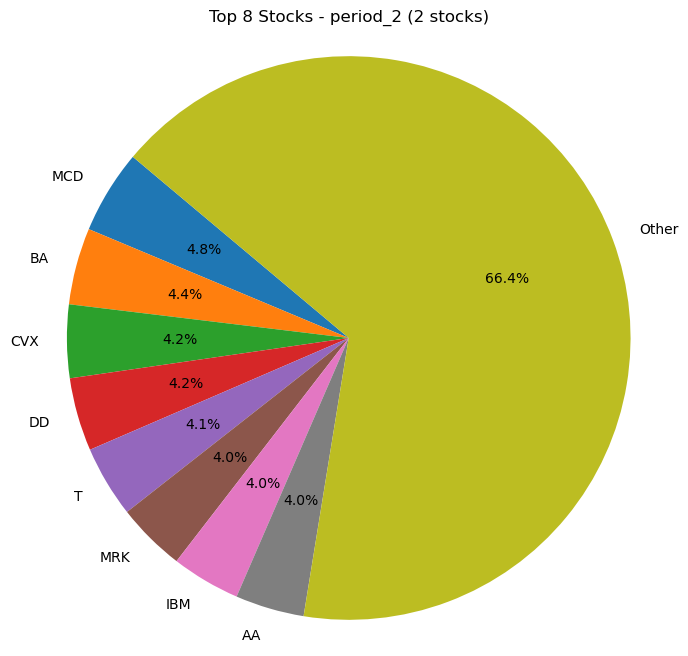

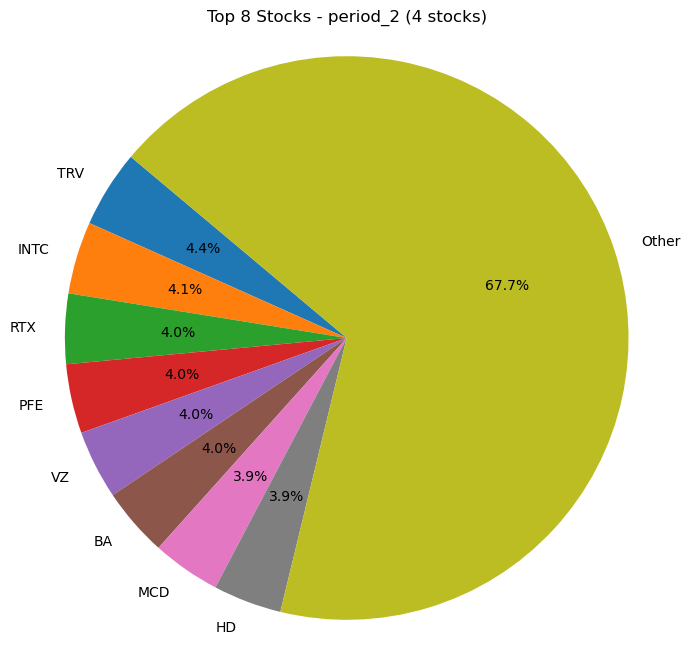

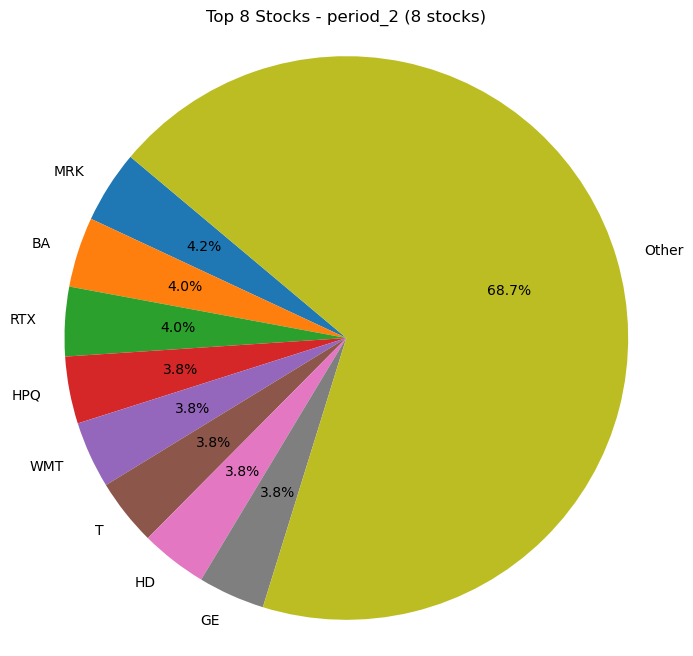

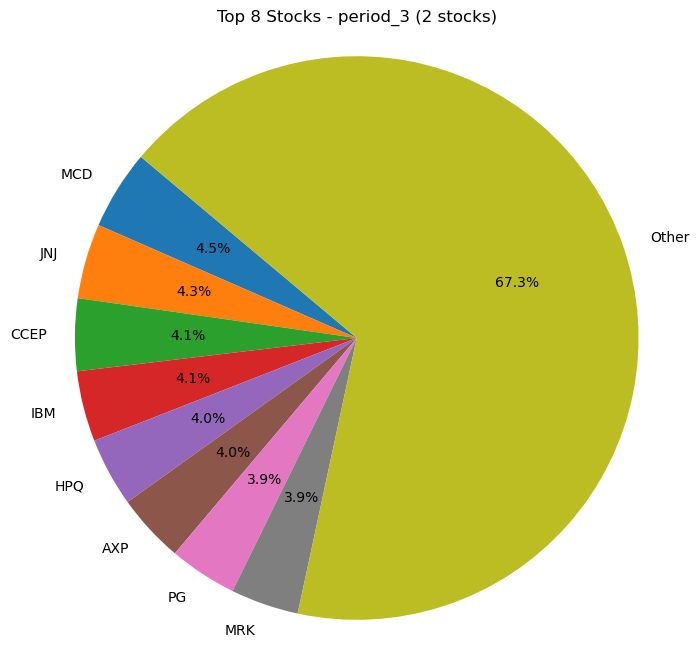

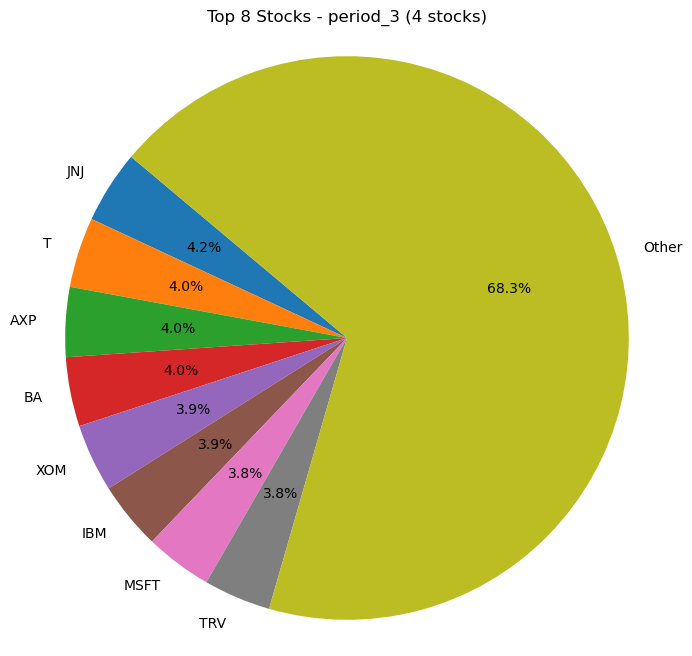

...

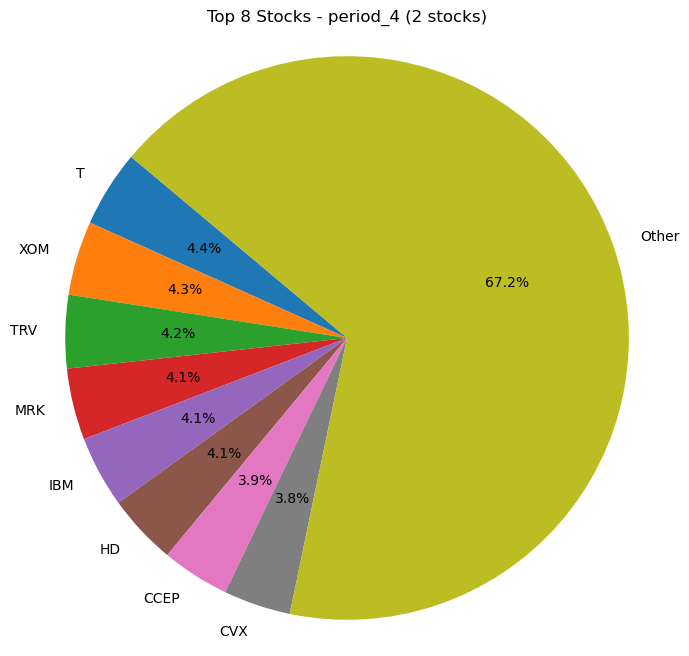

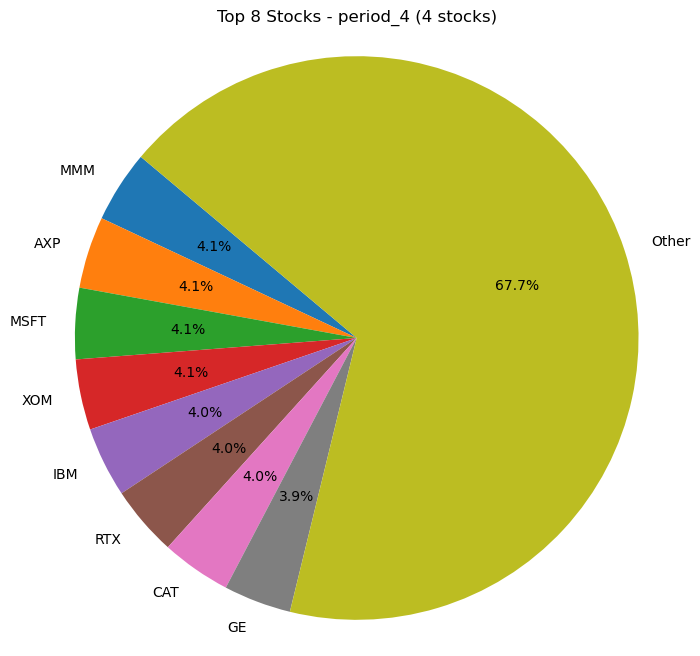

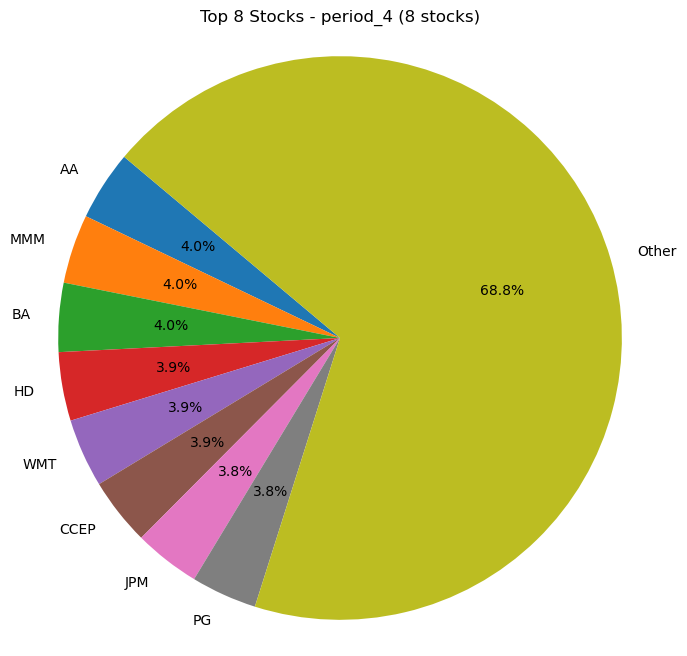

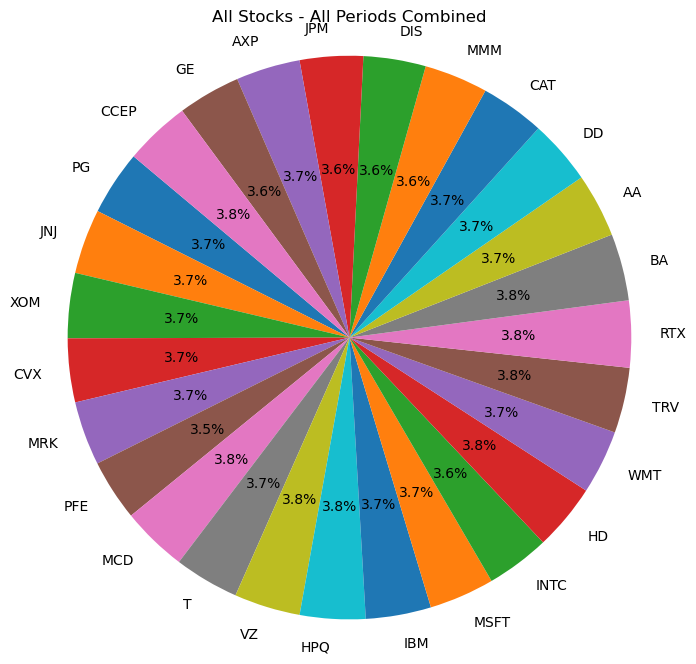

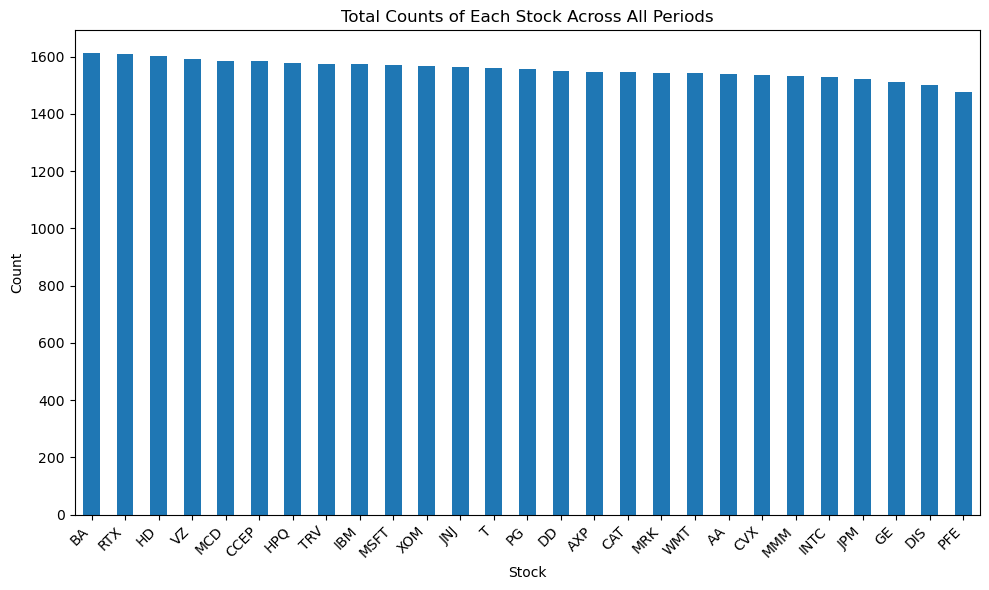

In [64]:
count_of_stocks(result_df_random_test1,custom_tickers)

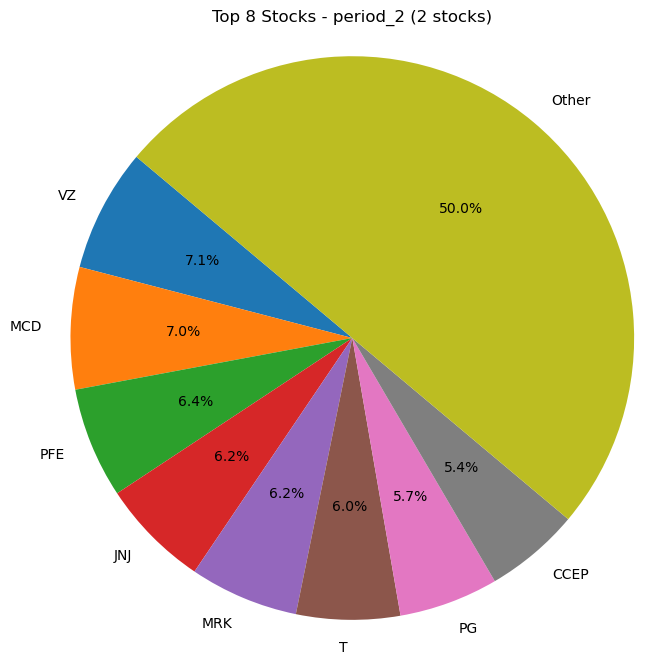

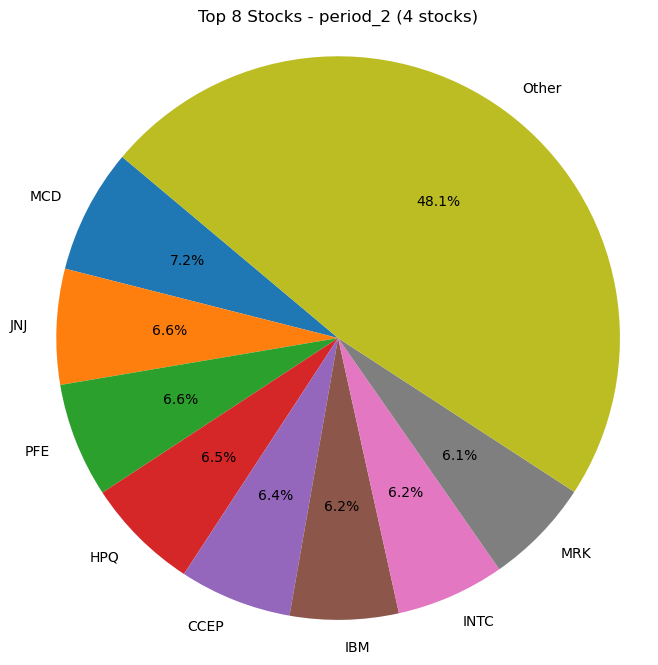

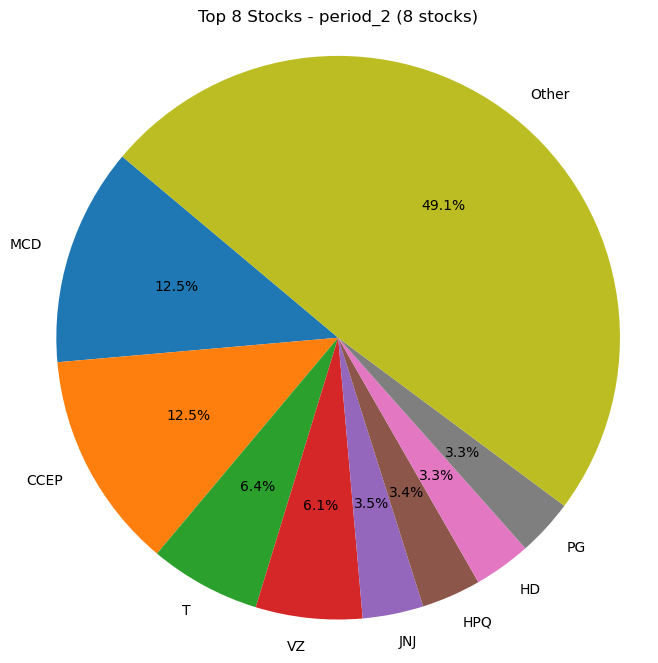

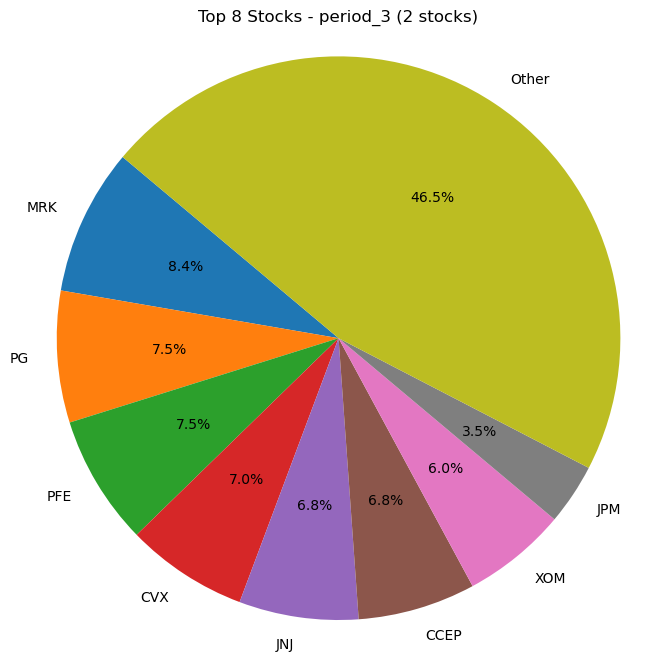

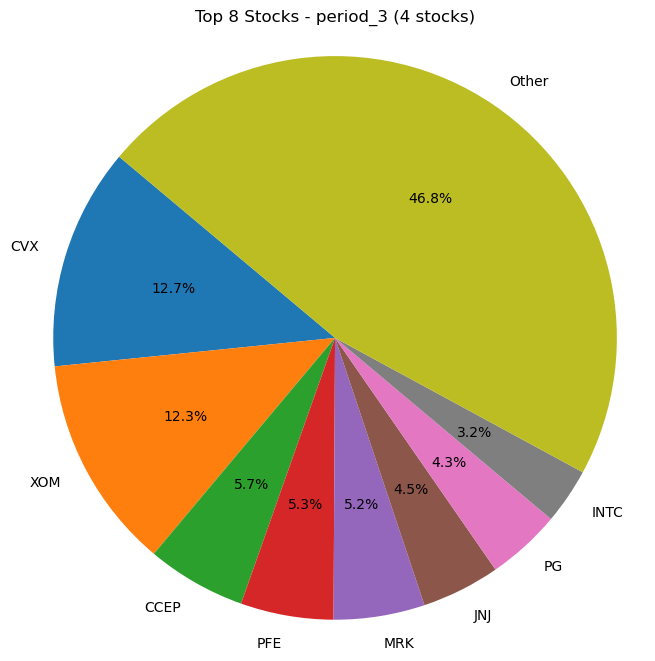

...

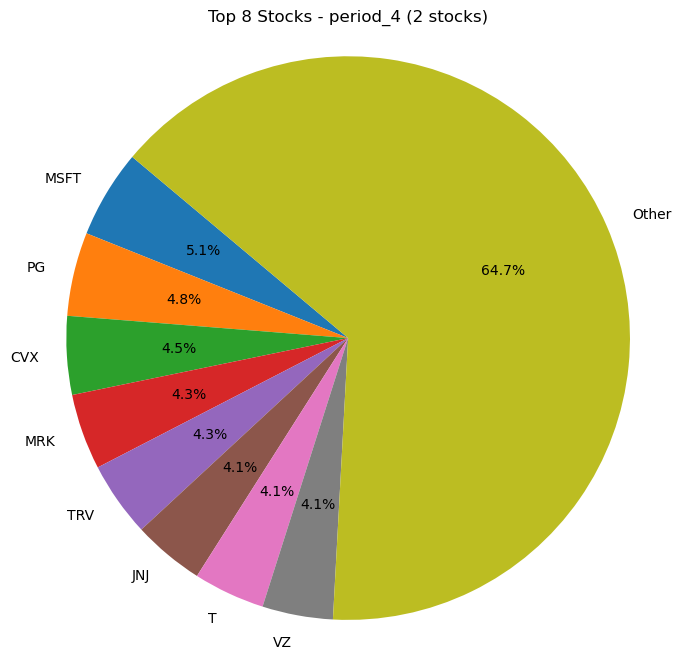

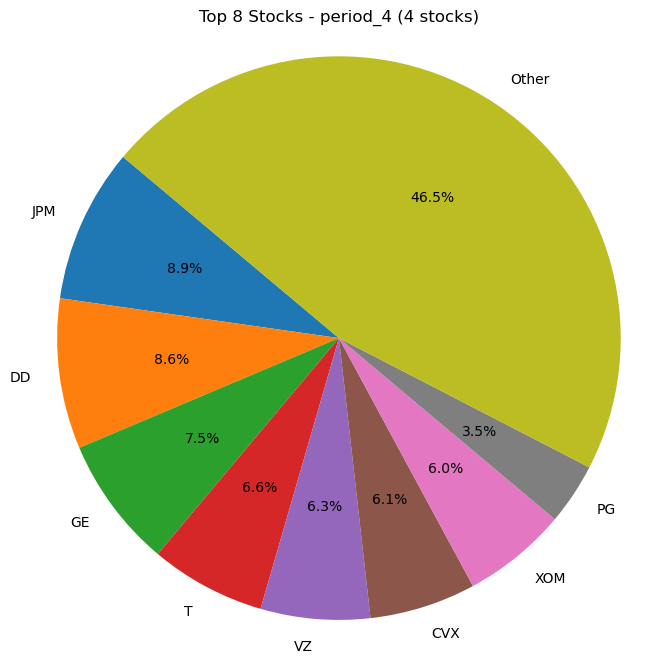

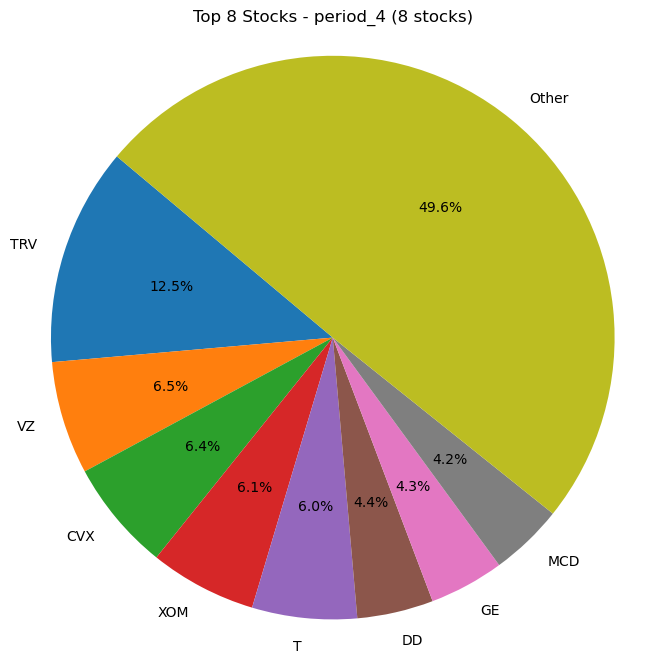

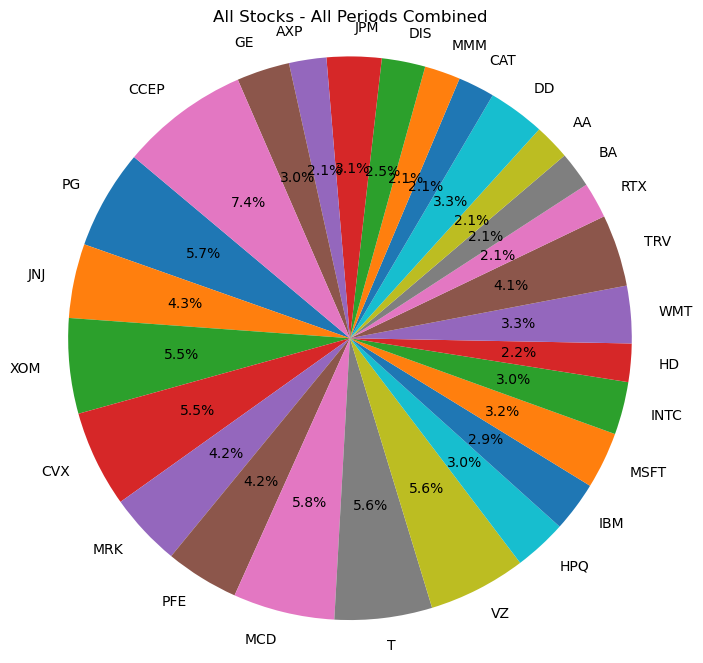

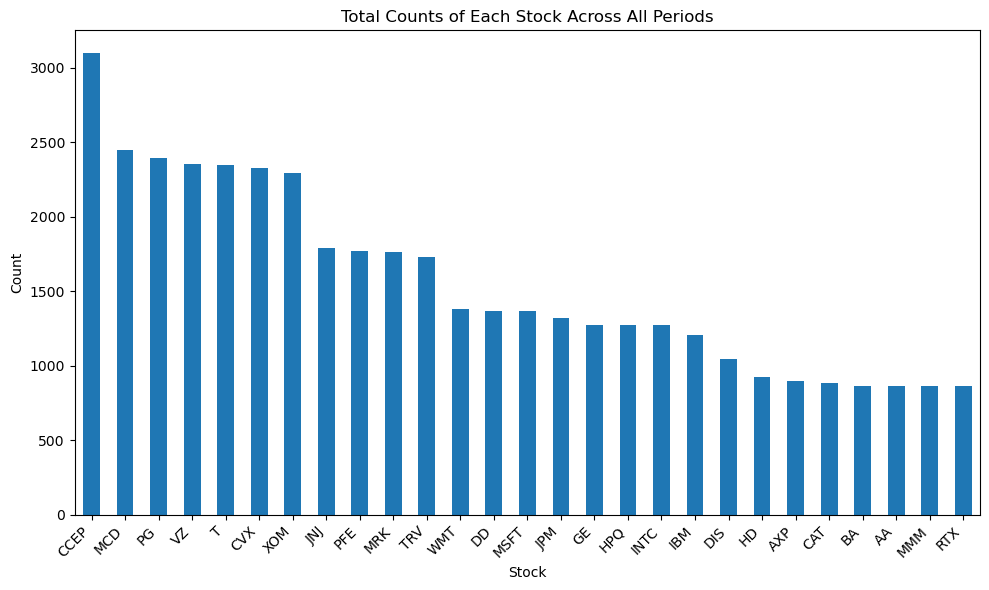

In [66]:
count_of_stocks(result_df_HCT_test1,custom_tickers)

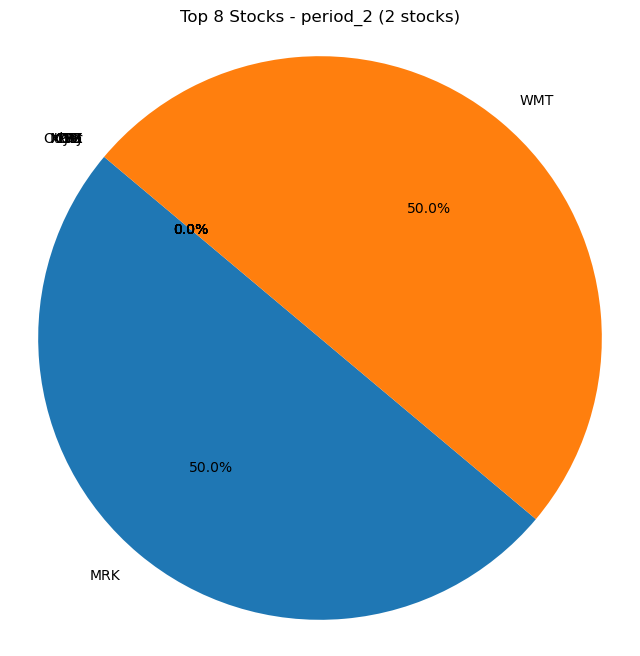

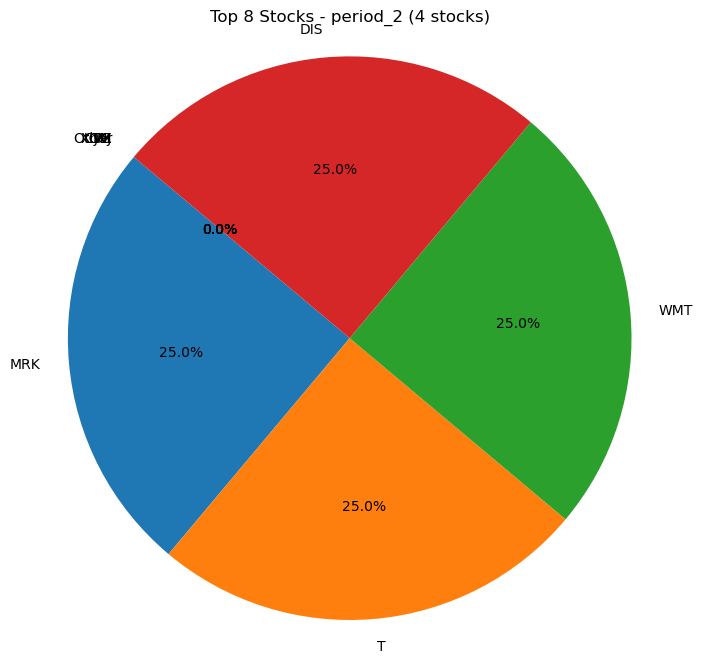

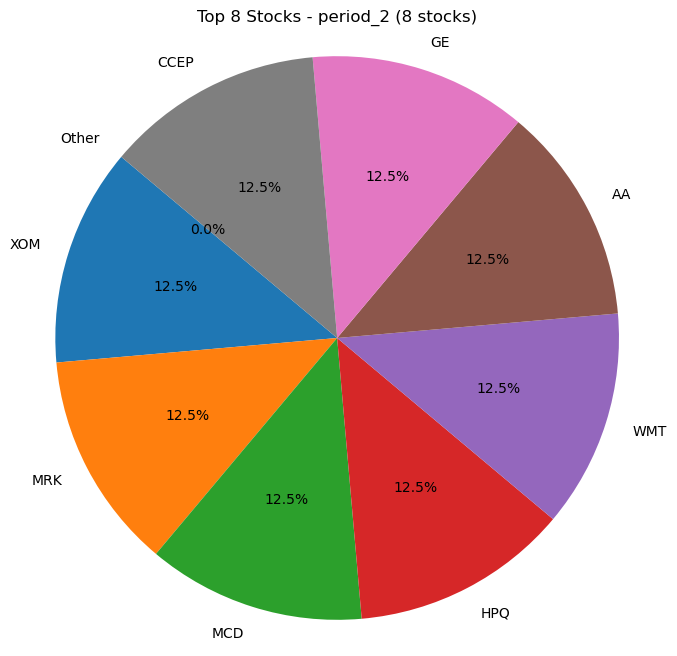

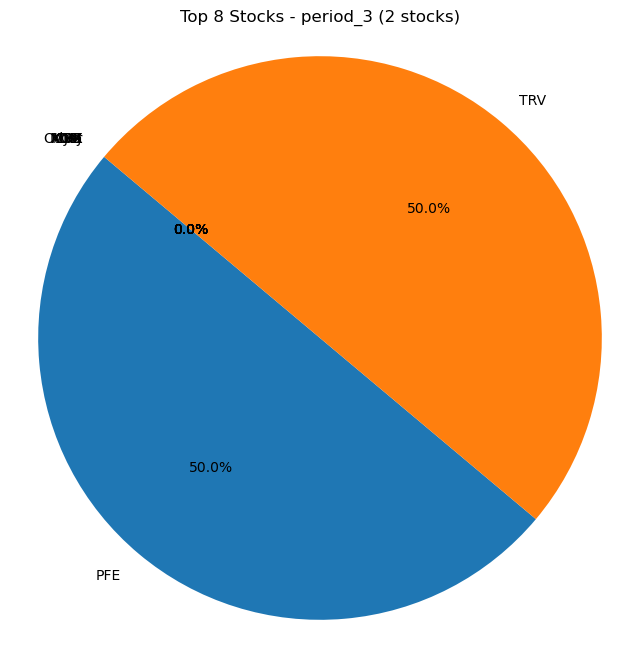

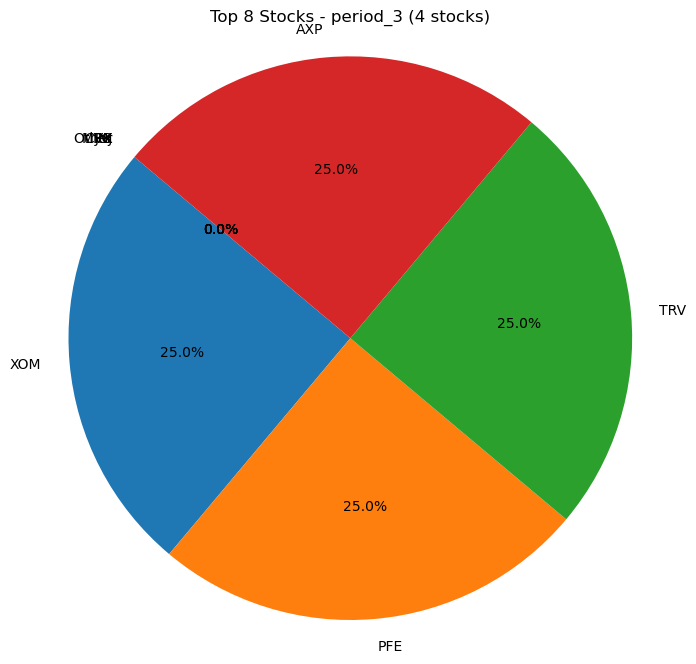

...

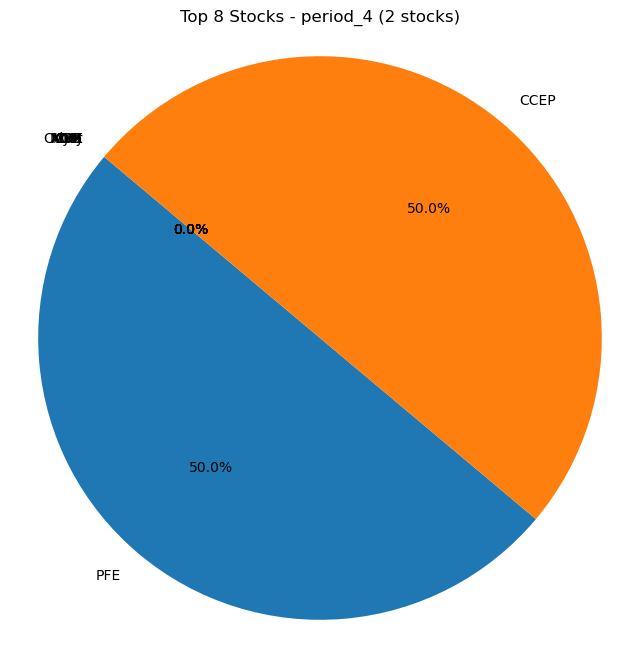

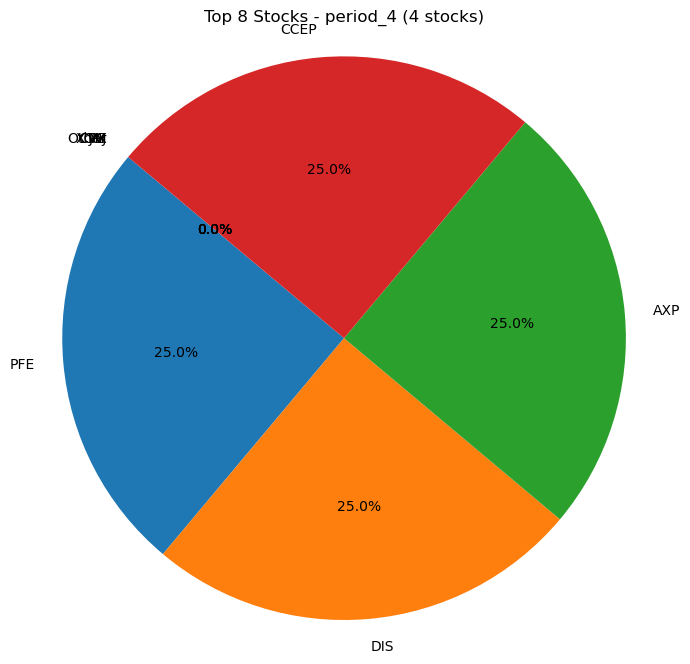

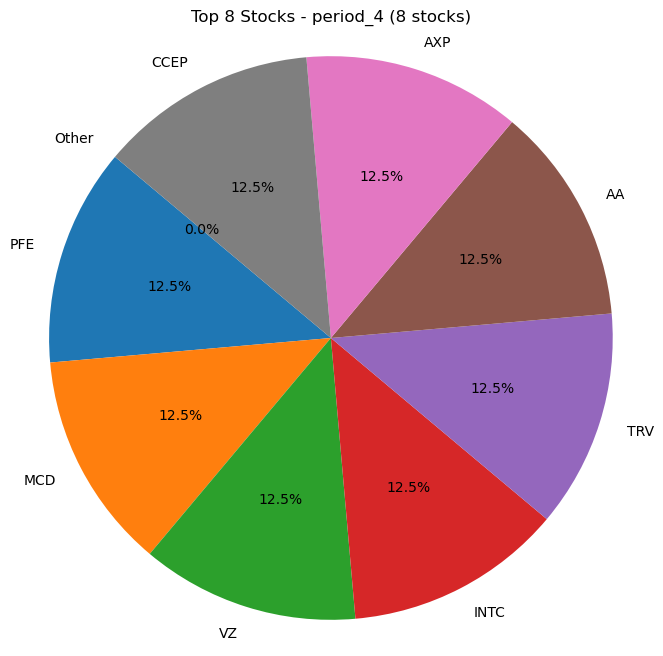

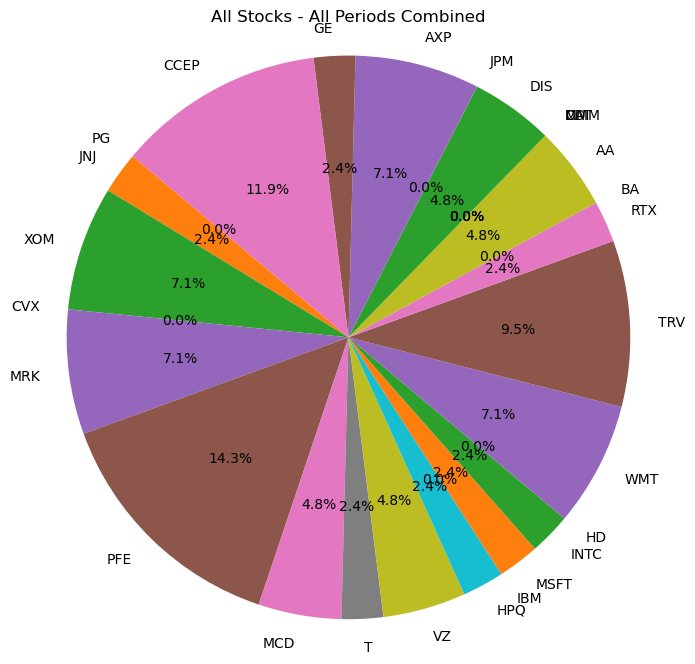

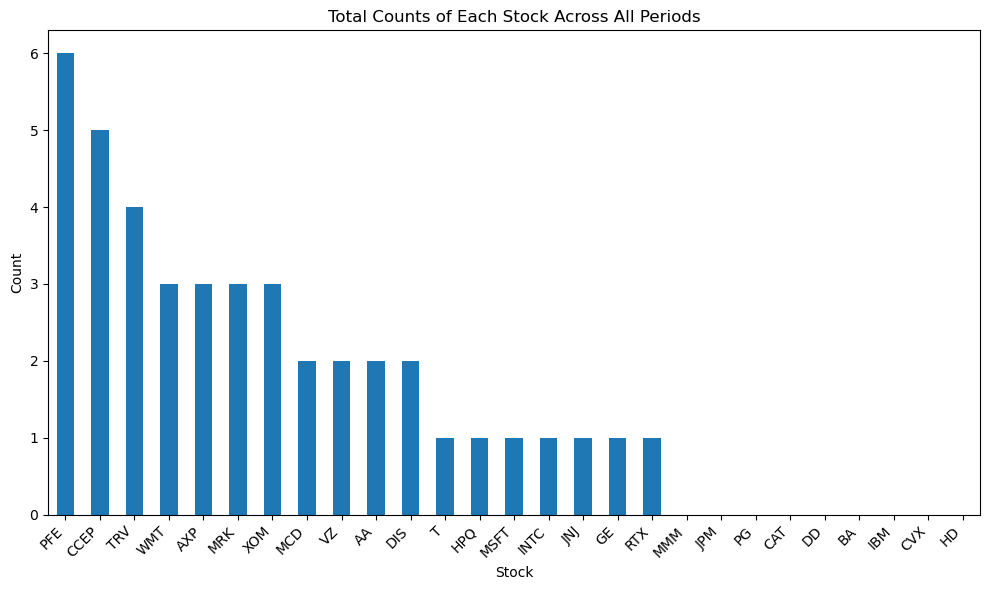

In [67]:
count_of_stocks(result_df_kmeans_test1,custom_tickers)

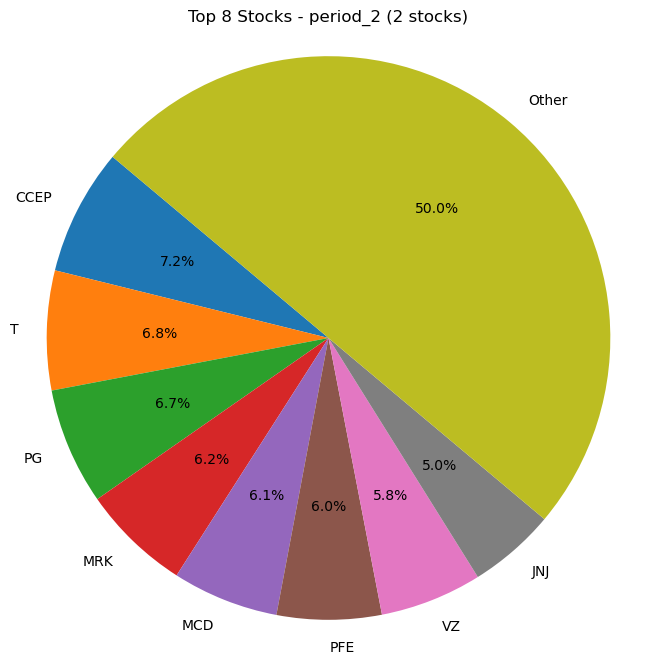

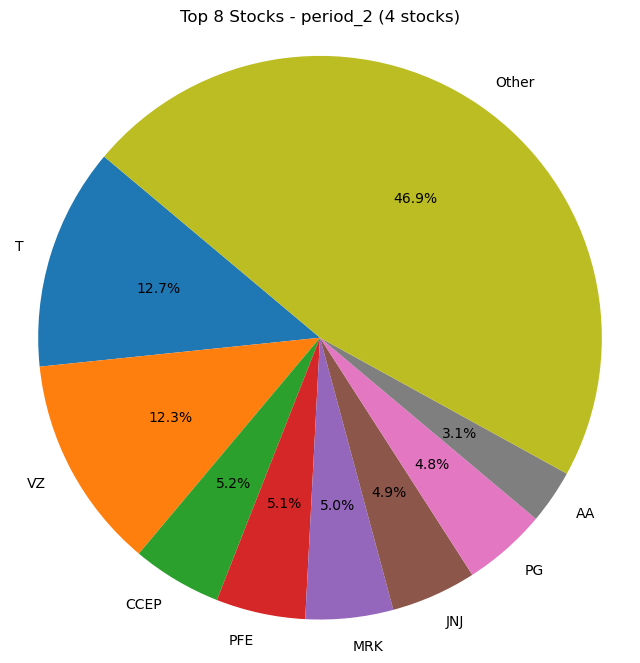

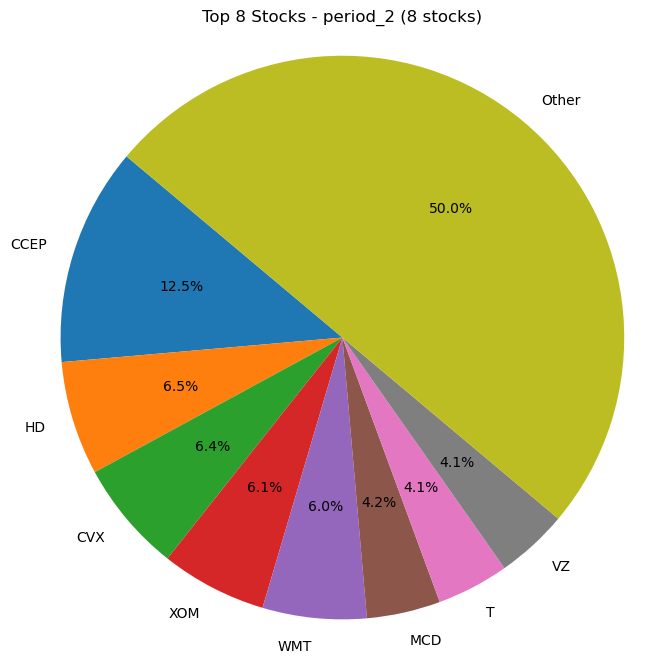

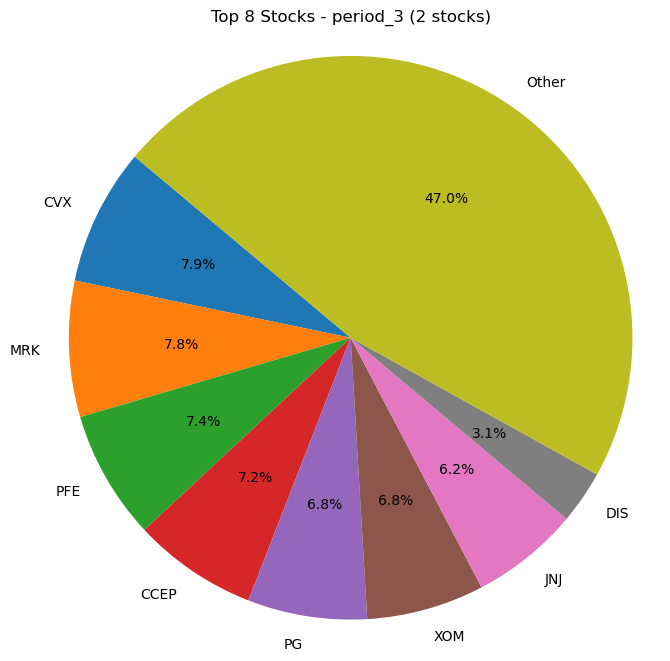

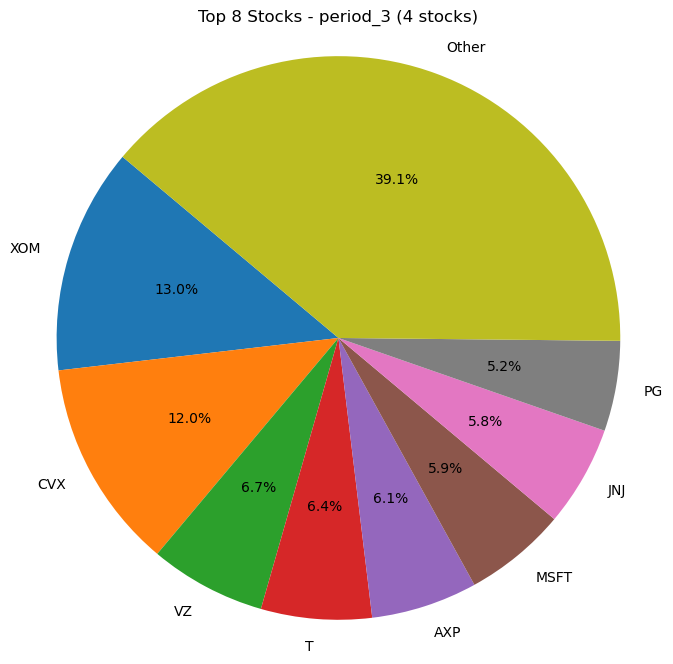

...

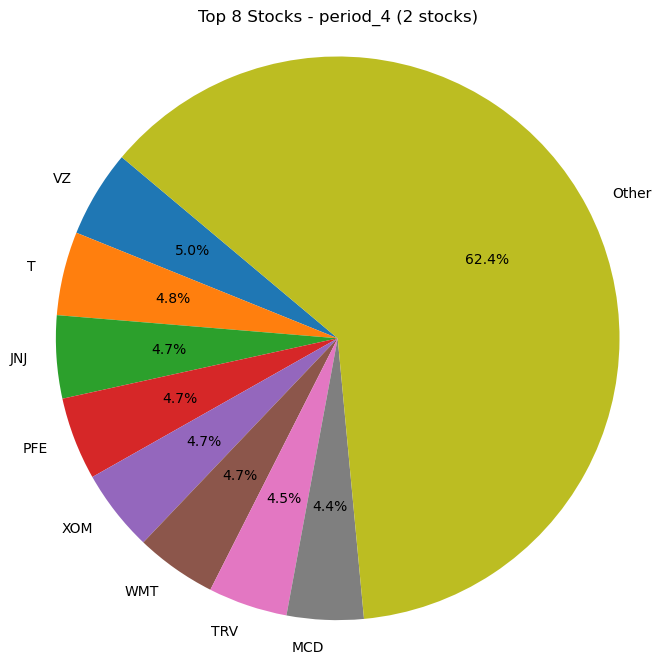

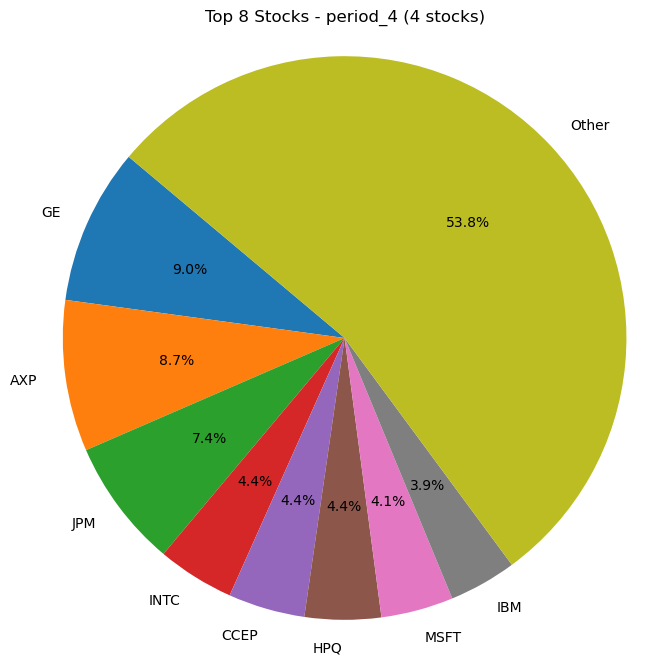

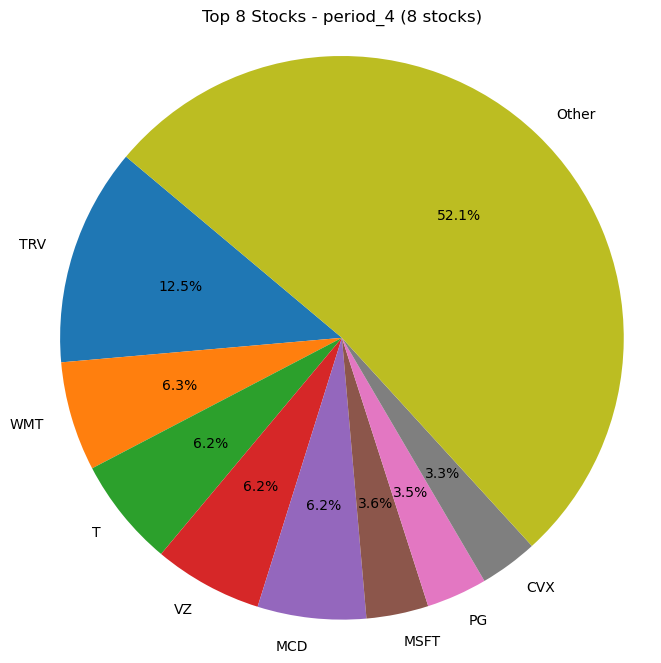

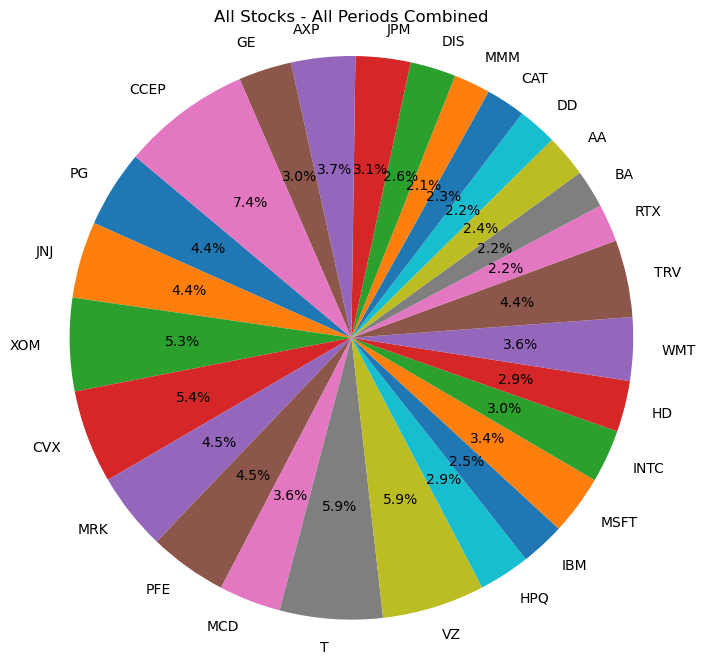

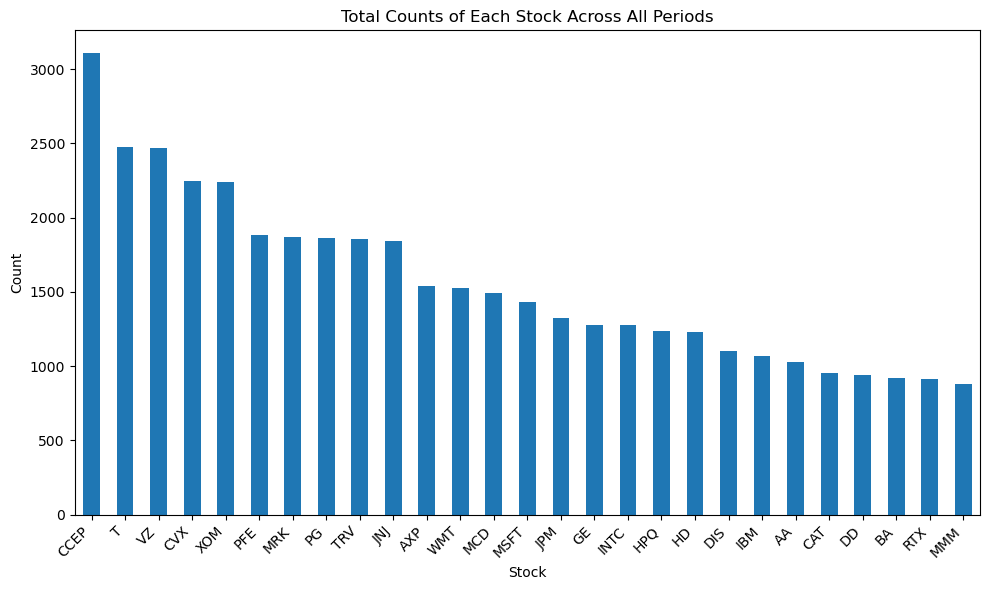

In [68]:
count_of_stocks(result_df_kmeans_rand_test1,custom_tickers)

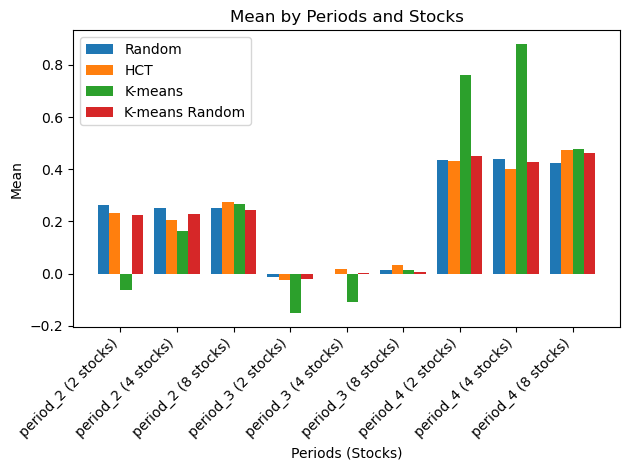

Total Average Mean of Random Values: 0.22915677252979416
Total Average Mean of Cluster Values: 0.22764260898355643
Total Average Mean of K-means Values: 0.24956026406176435
Total Average Mean of K-means Random Values: 0.2246348660846501

Period 1 Average Mean of Random Values: 0.2558256705920587
Period 1 Average Mean of Cluster Values: 0.23722490875878433
Period 1 Average Mean of K-means Values: 0.12300196751196342
Period 1 Average Mean of K-means Random Values: 0.23189710969007535
Period 2 Average Mean of Random Values: -0.0004535687998052796
Period 2 Average Mean of Cluster Values: 0.010265890640802309
Period 2 Average Mean of K-means Values: -0.08139989061092241
Period 2 Average Mean of K-means Random Values: -0.004553138327643356
Period 3 Average Mean of Random Values: 0.4320982157971291
Period 3 Average Mean of Cluster Values: 0.4354370275510826
Period 3 Average Mean of K-means Values: 0.707078715284252
Period 3 Average Mean of K-means Random Values: 0.4465606268915184


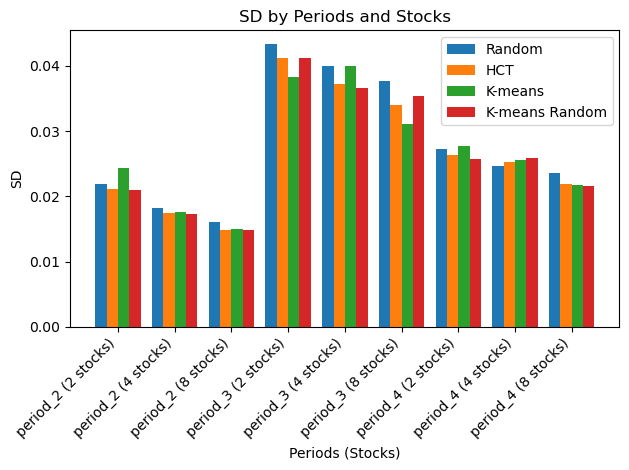

Total Average SD of Random Values: 0.028069967188964016
Total Average SD of Cluster Values: 0.026593644785837384
Total Average SD of K-means Values: 0.02683210145043494
Total Average SD of K-means Random Values: 0.026601721841624987

Period 1 Average SD of Random Values: 0.01872192810421547
Period 1 Average SD of Cluster Values: 0.017794832910083436
Period 1 Average SD of K-means Values: 0.01899268622935733
Period 1 Average SD of K-means Random Values: 0.017705017011725395
Period 2 Average SD of Random Values: 0.040313202602414756
Period 2 Average SD of Cluster Values: 0.03747676456025767
Period 2 Average SD of K-means Values: 0.03648615228465035
Period 2 Average SD of K-means Random Values: 0.03774564421021761
Period 3 Average SD of Random Values: 0.02517477086026181
Period 3 Average SD of Cluster Values: 0.02450933688717105
Period 3 Average SD of K-means Values: 0.025017465837297137
Period 3 Average SD of K-means Random Values: 0.024354504302931956


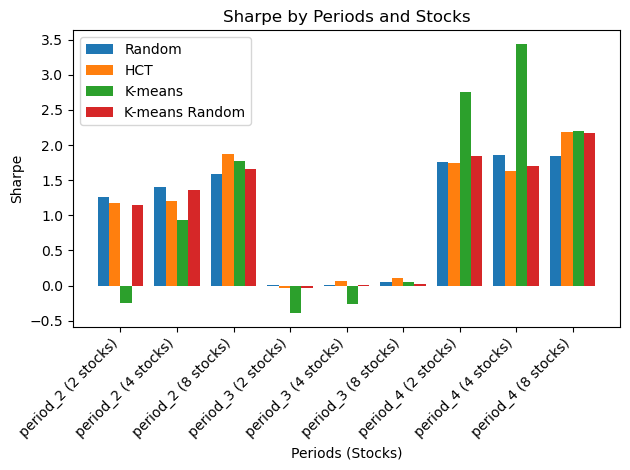

Total Average Sharpe of Random Values: 1.0858456260910279
Total Average Sharpe of Cluster Values: 1.1065114594992784
Total Average Sharpe of K-means Values: 1.1372286883489848
Total Average Sharpe of K-means Random Values: 1.0990688794239791

Period 1 Average Sharpe of Random Values: 1.4183383362598407
Period 1 Average Sharpe of Cluster Values: 1.419716084303048
Period 1 Average Sharpe of K-means Values: 0.819806530160922
Period 1 Average Sharpe of K-means Random Values: 1.3898032504483506
Period 2 Average Sharpe of Random Values: 0.020090307541236915
Period 2 Average Sharpe of Cluster Values: 0.04461512241454563
Period 2 Average Sharpe of K-means Values: -0.20529447071423154
Period 2 Average Sharpe of K-means Random Values: -0.0009377441042115979
Period 3 Average Sharpe of Random Values: 1.8191082344720062
Period 3 Average Sharpe of Cluster Values: 1.855203171780242
Period 3 Average Sharpe of K-means Values: 2.797174005600264
Period 3 Average Sharpe of K-means Random Values: 1.9083411

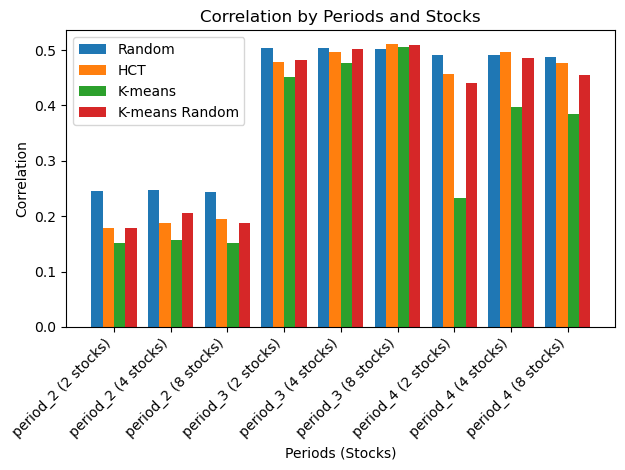

Total Average Correlation of Random Values: 0.41317895814452876
Total Average Correlation of Cluster Values: 0.3862325251498926
Total Average Correlation of K-means Values: 0.3232160989375211
Total Average Correlation of K-means Random Values: 0.3831282814191029

Period 1 Average Correlation of Random Values: 0.245922748424338
Period 1 Average Correlation of Cluster Values: 0.18695202701565308
Period 1 Average Correlation of K-means Values: 0.15354492134360417
Period 1 Average Correlation of K-means Random Values: 0.19108890798048941
Period 2 Average Correlation of Random Values: 0.5034085417449631
Period 2 Average Correlation of Cluster Values: 0.495481682944416
Period 2 Average Correlation of K-means Values: 0.478371589407341
Period 2 Average Correlation of K-means Random Values: 0.4980601516004935
Period 3 Average Correlation of Random Values: 0.49020558426428523
Period 3 Average Correlation of Cluster Values: 0.4762638654896086
Period 3 Average Correlation of K-means Values: 0.3377

In [69]:
# Plotting Mean
plot_metric('Mean',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric('SD',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric('Sharpe',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric('Correlation',result_df_random_test1,result_df_HCT_test1,result_df_kmeans_test1,result_df_kmeans_rand_test1)

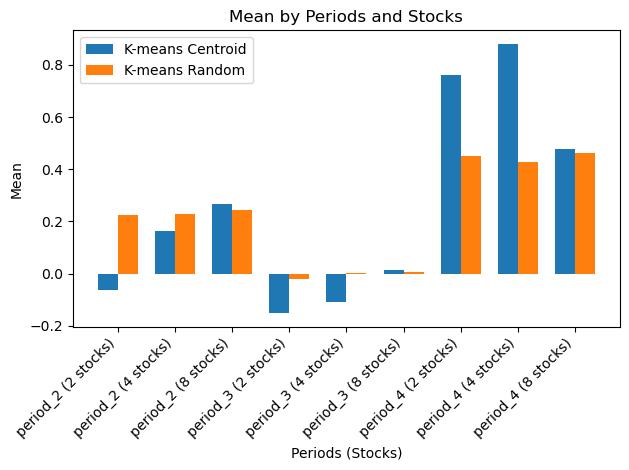

Total Average Mean of K-means Centroid Values: 0.24956026406176435
Total Average Mean of K-means Random Values: 0.2246348660846501

Period 1 Average Mean of K-means Centroid Values: 0.12300196751196342
Period 1 Average Mean of K-means Random Values: 0.23189710969007535
Period 2 Average Mean of K-means Centroid Values: -0.08139989061092241
Period 2 Average Mean of K-means Random Values: -0.004553138327643356
Period 3 Average Mean of K-means Centroid Values: 0.707078715284252
Period 3 Average Mean of K-means Random Values: 0.4465606268915184


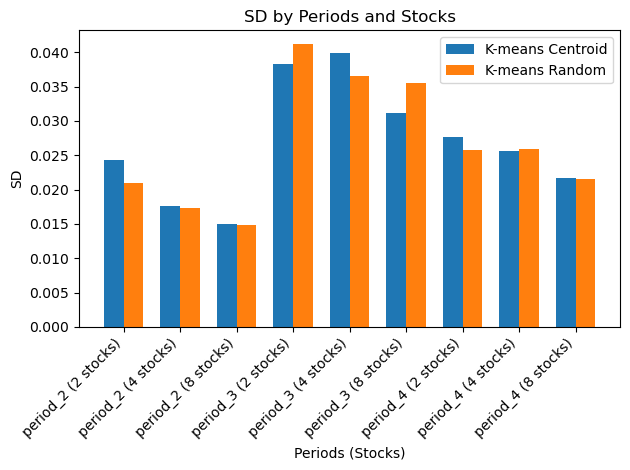

Total Average SD of K-means Centroid Values: 0.02683210145043494
Total Average SD of K-means Random Values: 0.026601721841624987

Period 1 Average SD of K-means Centroid Values: 0.01899268622935733
Period 1 Average SD of K-means Random Values: 0.017705017011725395
Period 2 Average SD of K-means Centroid Values: 0.03648615228465035
Period 2 Average SD of K-means Random Values: 0.03774564421021761
Period 3 Average SD of K-means Centroid Values: 0.025017465837297137
Period 3 Average SD of K-means Random Values: 0.024354504302931956


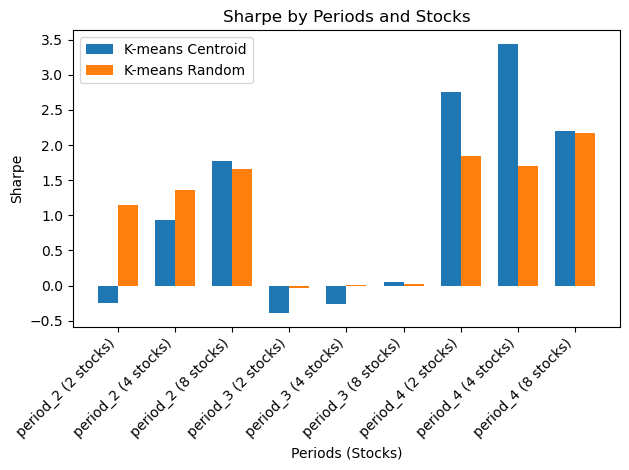

Total Average Sharpe of K-means Centroid Values: 1.1372286883489848
Total Average Sharpe of K-means Random Values: 1.0990688794239791

Period 1 Average Sharpe of K-means Centroid Values: 0.819806530160922
Period 1 Average Sharpe of K-means Random Values: 1.3898032504483506
Period 2 Average Sharpe of K-means Centroid Values: -0.20529447071423154
Period 2 Average Sharpe of K-means Random Values: -0.0009377441042115979
Period 3 Average Sharpe of K-means Centroid Values: 2.797174005600264
Period 3 Average Sharpe of K-means Random Values: 1.9083411319277988


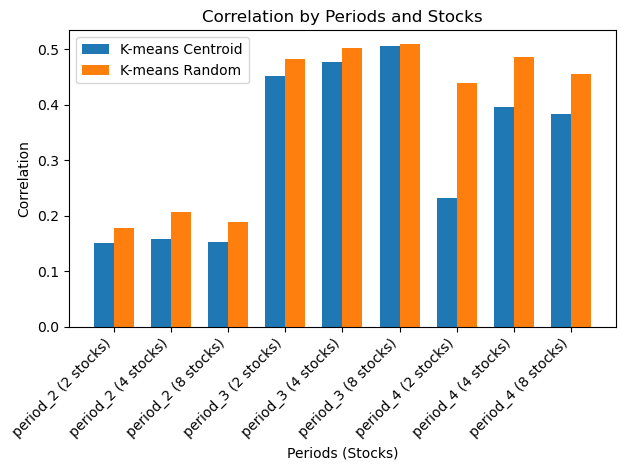

Total Average Correlation of K-means Centroid Values: 0.3232160989375211
Total Average Correlation of K-means Random Values: 0.3831282814191029

Period 1 Average Correlation of K-means Centroid Values: 0.15354492134360417
Period 1 Average Correlation of K-means Random Values: 0.19108890798048941
Period 2 Average Correlation of K-means Centroid Values: 0.478371589407341
Period 2 Average Correlation of K-means Random Values: 0.4980601516004935
Period 3 Average Correlation of K-means Centroid Values: 0.3377317860616183
Period 3 Average Correlation of K-means Random Values: 0.4602357846763258


In [70]:
# Plotting Mean
plot_metric_kmeans('Mean',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting SD
plot_metric_kmeans('SD',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Sharpe
plot_metric_kmeans('Sharpe',result_df_kmeans_test1,result_df_kmeans_rand_test1)

# Plotting Correlation
plot_metric_kmeans('Correlation',result_df_kmeans_test1,result_df_kmeans_rand_test1)